In [1]:
library(dplyr)
library(Seurat)
library(monocle3)
library("stringr")
library("factoextra")
library("Rtsne")


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


Attaching SeuratObject

Loading required package: Biobase

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:dplyr’:

    combine, intersect, setdiff, union


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, 

In [32]:
Healthy <-Read10X_h5(filename="/media/orsalia/SP PHD U3/Heart_project/mice_intraction/GSM3847603_30dpi_FilteredGeneBCMatrices.h5")

Warning message in sparseMatrix(i = indices[] + 1, p = indptr[], x = as.numeric(x = counts[]), :
“'giveCsparse' has been deprecated; setting 'repr = "T"' for you”


In [33]:
head(Healthy)

   [[ suppressing 8337 column names ‘AAACCTGAGACATAAC-1’, ‘AAACCTGAGCAGGTCA-1’, ‘AAACCTGAGCCTATGT-1’ ... ]]



6 x 8337 sparse Matrix of class "dgCMatrix"
                                                                               
Xkr4    . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . 1 . . .
Gm1992  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
Gm37381 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
Rp1     . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
Rp1.1   . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
Sox17   . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
                                                                               
Xkr4    . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
Gm1992  . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
Gm37381 . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . .
Rp1     . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . . 

In [34]:
Healthy <- CreateSeuratObject(counts = Healthy , project = "Health")

In [35]:
DPI_14 <-Read10X_h5(filename="/media/orsalia/SP PHD U3/Heart_project/mice_intraction/GSM3847603_30dpi_FilteredGeneBCMatrices.h5")

Warning message in sparseMatrix(i = indices[] + 1, p = indptr[], x = as.numeric(x = counts[]), :
“'giveCsparse' has been deprecated; setting 'repr = "T"' for you”


In [36]:
DPI_14 <- CreateSeuratObject(counts = DPI_14 , project = "DPI_14")

In [37]:
pbmc <- merge(DPI_14, y=Healthy, add.cell.ids = c("DPI_14", "Healthy"), project = "Dpi14vsnormal",merge.data = TRUE)

In [38]:
pbmcF <- CreateSeuratObject(counts=GetAssayData(pbmc), project = "DPI_14vsnormal", min.cells = 3, min.features = 200)

Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of percent.mt.”
Warning message in cor(x = data[, 1], y = data[, 2]):
“the standard deviation is zero”
Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”


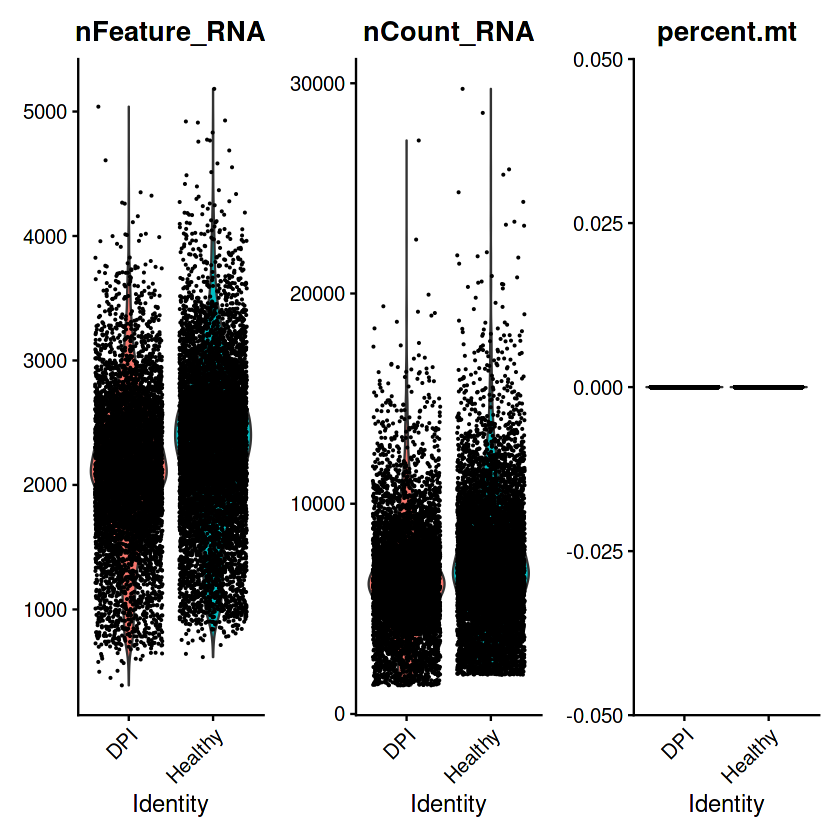

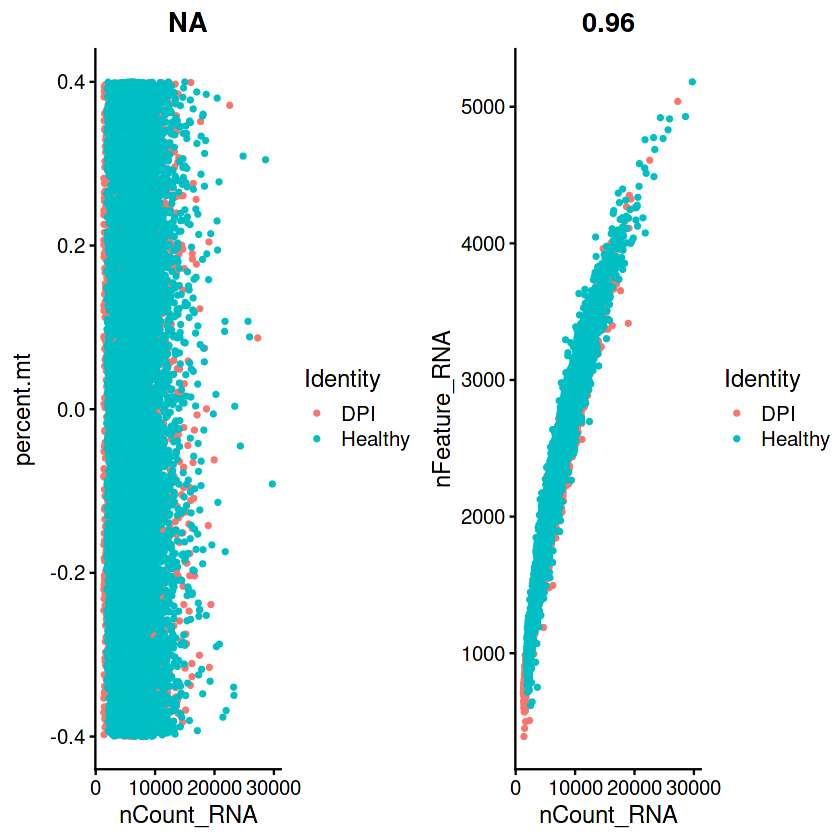

In [39]:
pbmcF[["percent.mt"]] <- PercentageFeatureSet(object = pbmcF, pattern = "^MT-")
VlnPlot(object = pbmcF, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)
plot1 <- FeatureScatter(object = pbmcF, feature1 = "nCount_RNA", feature2 = "percent.mt") 
plot2 <- FeatureScatter(object = pbmcF, feature1 = "nCount_RNA", feature2 = "nFeature_RNA") 
CombinePlots(plots = list(plot1,plot2))

In [40]:
pbmcF <- NormalizeData(object = pbmcF, normalization.method = "LogNormalize", scale.factor = 1e4)

In [41]:
pbmcF <- FindVariableFeatures(object = pbmcF,selection.method = 'vst', nfeatures = 2000)
top10 <- head(x = VariableFeatures(object = pbmcF), 10)
plot1 <- VariableFeaturePlot(object = pbmcF)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)

When using repel, set xnudge and ynudge to 0 for optimal results



Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”
Centering and scaling data matrix

Centering and scaling data matrix

Regressing out percent.mt

Centering and scaling data matrix



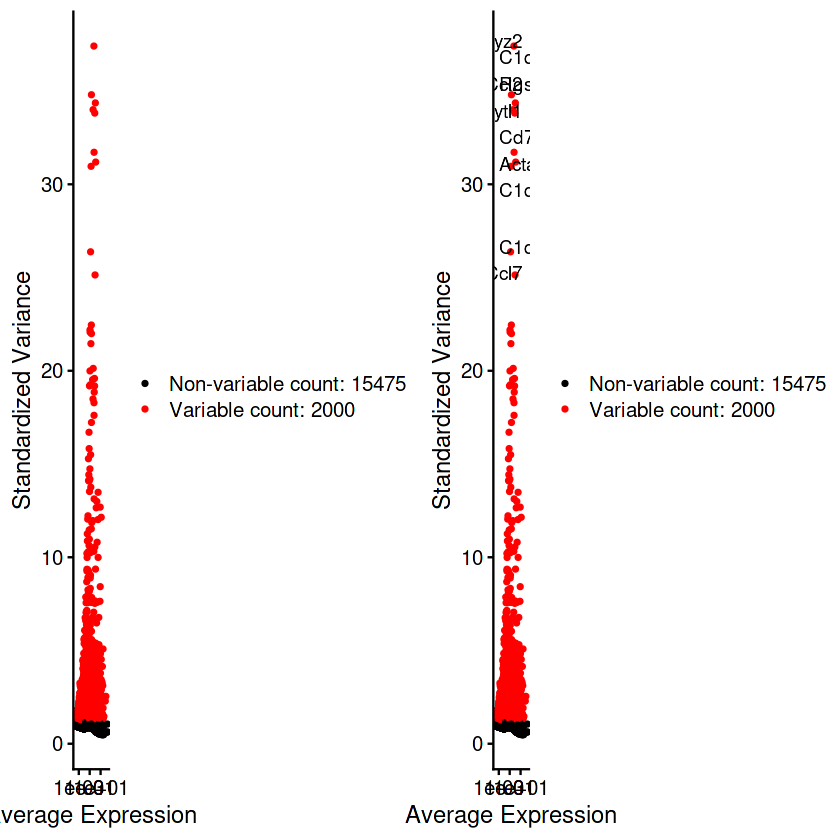

In [42]:
CombinePlots(plots = list(plot1, plot2))
all.genes <- rownames(x = pbmcF)
pbmcF <- ScaleData(object = pbmcF, features = all.genes)
pbmcF <- ScaleData(object = pbmcF)
pbmcF <- ScaleData(object = pbmcF, vars.to.regress = 'percent.mt')

In [43]:
levels(pbmcF)

[1] "DPI"     "Healthy"

In [44]:
monocyte.de.markers <- FindMarkers(pbmcF, ident.1 = "DPI", ident.2 = "Healthy")
# view results
head(monocyte.de.markers)

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Rpl31,0,0.3957451,0.994,0.994,0
1500015O10Rik,0,-1.3193054,0.208,0.511,0
Col3a1,0,-1.1298428,0.964,0.985,0
Fn1,0,-1.1244615,0.438,0.694,0
Rpl37a,0,0.3539315,0.998,0.999,0
Chpf,0,-0.8683477,0.341,0.691,0


In [45]:
write.csv(monocyte.de.markers, file = "/media/orsalia/SP PHD U3/Heart_project/mice_intraction/DPI30vsdpi14.csv")

PC_ 1 
Positive:  Clec3b, Lpl, Lamb1, Pla1a, Pcsk6, Adamts5, Gsta3, Smoc2, Sparcl1, Hsd11b1 
	   S100a6, Ifi27l2a, Dpep1, Tnxb, Col15a1, Scara5, Gpx3, G0s2, Col5a3, Gstm1 
	   Ccnd1, Rarres2, Ret, Itm2a, Pcolce, Ifi205, Fbln2, Ifitm3, Cd34, Thy1 
Negative:  Comp, Dkk3, 1500015O10Rik, Cst3, Pdlim3, Mfap4, Fmod, Csrp2, Id3, Sfrp2 
	   Cd200, Cthrc1, Ddah1, Cpe, Angptl7, Mgp, Mdk, Ier3, Fbln1, Fxyd6 
	   Cpxm2, Gadd45b, Nr4a2, Clu, Fgl2, Postn, Wisp2, Cdc42ep3, Ltbp2, Timp1 
PC_ 2 
Positive:  Apoe, Sept4, Mgp, Hsd11b1, G0s2, Nmb, Ndufa4l2, Adm, Lpl, Rgs5 
	   Ifitm3, Adap2os, Notch3, Ifitm1, Dpep1, Tmem176b, Ggt5, Cox4i2, Rgs17, Cpxm1 
	   Gsta3, Rasgrp2, Colec11, Ldhb, Higd1b, Tinagl1, Penk, Ppp1r14a, Fmo2, Gucy1a3 
Negative:  Mfap5, Pi16, Cd248, Fstl1, Crip1, Ly6a, Efhd1, Anxa2, S100a10, Cd34 
	   Uap1, Ly6c1, Gfpt2, Ugdh, Tmem100, Cd9, Actg1, Ackr3, Cd55, Uqcc2 
	   Ugp2, Anxa1, Vim, Fbln2, Tmsb4x, Hn1, Axl, Fbn1, Pcolce2, Nbl1 
PC_ 3 
Positive:  Rgs5, Esam, Tinagl1, Higd1b, Tagln, Snc

PC_ 1 
Positive:  Clec3b, Lpl, Lamb1, Pla1a, Pcsk6 
Negative:  Comp, Dkk3, 1500015O10Rik, Cst3, Pdlim3 
PC_ 2 
Positive:  Apoe, Sept4, Mgp, Hsd11b1, G0s2 
Negative:  Mfap5, Pi16, Cd248, Fstl1, Crip1 
PC_ 3 
Positive:  Rgs5, Esam, Tinagl1, Higd1b, Tagln 
Negative:  Gsn, Bgn, Gpx3, Crispld2, Sepp1 
PC_ 4 
Positive:  Fibin, Col8a1, Postn, Bgn, Aspn 
Negative:  Zfp36, Junb, Fos, Egr1, Atf3 
PC_ 5 
Positive:  Rgs5, Nr4a1, Myl9, Sncg, Mylk 
Negative:  Nkain4, Lrrn4, Upk3b, Gpm6a, C2 


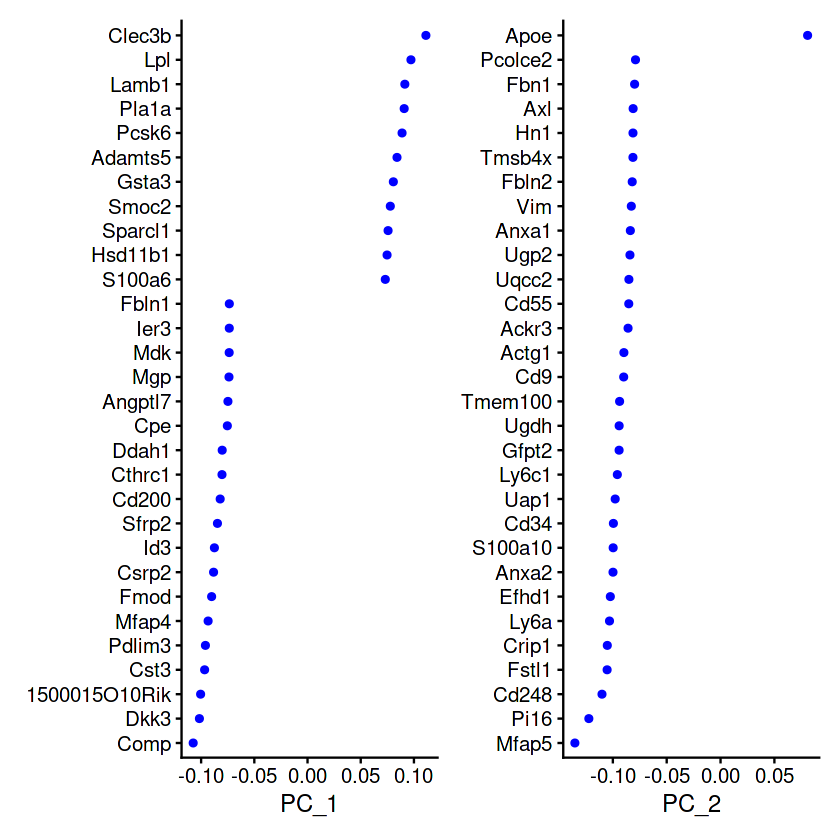

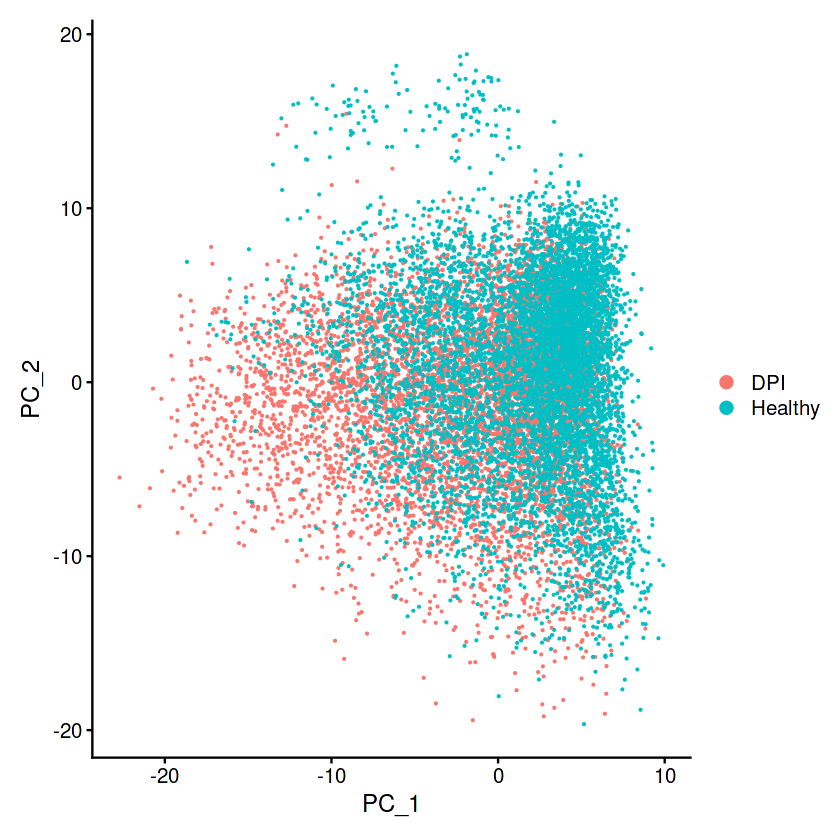

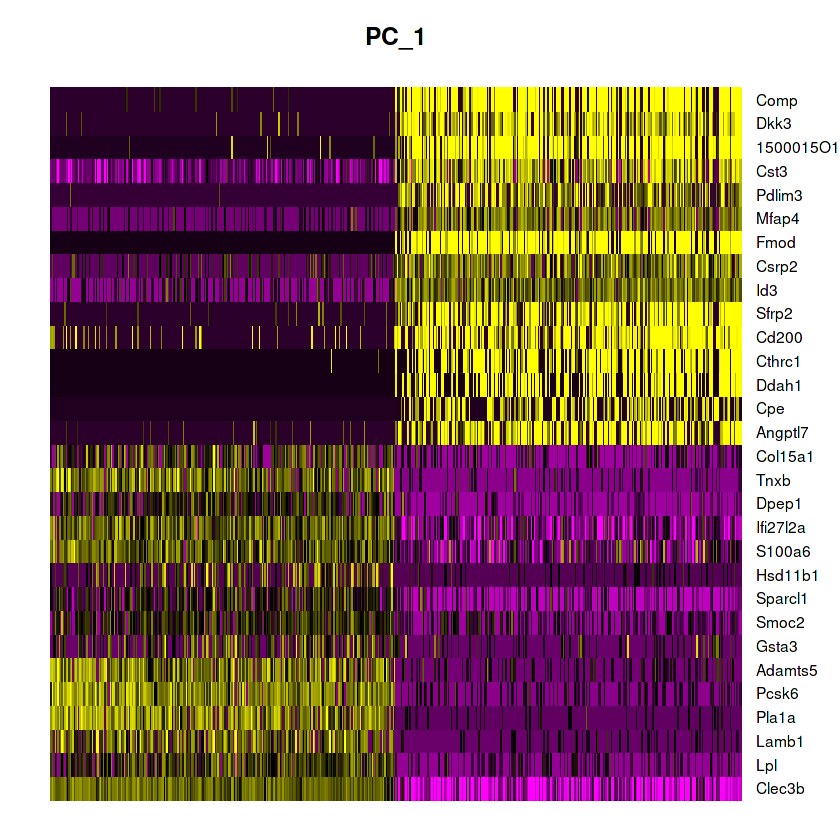

In [16]:
pbmcF <- RunPCA(object = pbmcF, features = VariableFeatures(object = pbmcF))
print(x = pbmcF[['pca']], dims = 1:5, nfeatures = 5)
VizDimLoadings(object = pbmcF, dims = 1:2, reduction = 'pca')
DimPlot(object = pbmcF, reduction = 'pca')
DimHeatmap(object = pbmcF, dims = 1, cells = 500, balanced = TRUE)

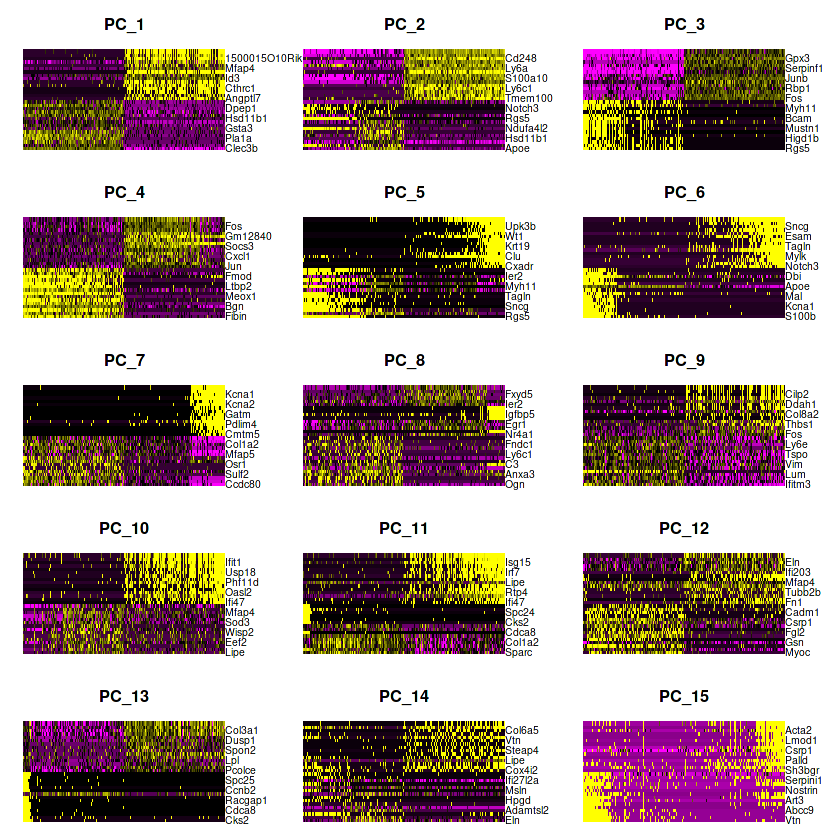

In [17]:
DimHeatmap(object = pbmcF, dims = 1:15, cells = 500, balanced = TRUE)

In [18]:
pbmcF <- FindNeighbors(object = pbmcF, dims = 1:10)
pbmcF <- FindClusters(object = pbmcF, resolution = 0.5)
head(x = Idents(object = pbmcF), 5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 13884
Number of edges: 407368

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8190
Number of communities: 10
Elapsed time: 2 seconds


DPI_14_AAACCTGAGATGTCGG-1 DPI_14_AAACCTGAGCTCTCGG-1 DPI_14_AAACCTGAGTGTACGG-1 
                        1                         1                         4 
DPI_14_AAACCTGAGTTGAGAT-1 DPI_14_AAACCTGCAAAGTCAA-1 
                        2                         0 
Levels: 0 1 2 3 4 5 6 7 8 9

In [19]:
pbmcF <- RunUMAP(object = pbmcF, dims = 1:10)

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
12:26:06 UMAP embedding parameters a = 0.9922 b = 1.112

12:26:06 Read 13884 rows and found 10 numeric columns

12:26:06 Using Annoy for neighbor search, n_neighbors = 30

12:26:06 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:26:07 Writing NN index file to temp file /tmp/Rtmpn6O805/file12486274e7c4

12:26:08 Searching Annoy index using 1 thread, search_k = 3000

12:26:12 Annoy recall = 100%

12:26:50 Commencing smooth kNN distance calibration using 1 thread

12:26:51 Initializing fr

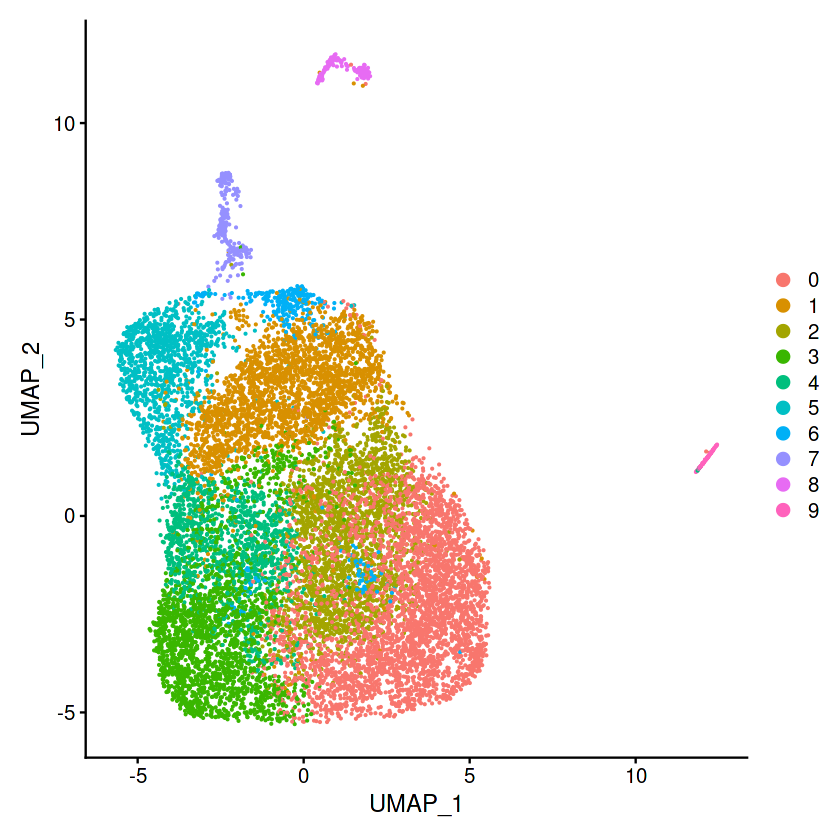

In [20]:
DimPlot(object = pbmcF, reduction = 'umap')

In [21]:
pbmc.markers <- FindAllMarkers(object = pbmcF, only.pos = TRUE, min.pct = 0.25,logfc.threshold = 0.17)
pbmc.markers %>% group_by(cluster) %>% top_n(n = 2, wt = avg_log2FC)
write.csv(pbmc.markers, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/DPI30healthymarkersall.csv")

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,1.164570,0.908,0.729,0.000000e+00,0,Lpl
0.000000e+00,1.150640,0.716,0.431,0.000000e+00,0,Hsd11b1
0.000000e+00,1.660941,0.984,0.881,0.000000e+00,1,Apoe
3.620173e-112,1.571651,0.314,0.141,6.162982e-108,1,Inmt
0.000000e+00,1.317278,0.992,0.765,0.000000e+00,2,Smoc2
0.000000e+00,1.098318,0.825,0.439,0.000000e+00,2,Hsd11b1
0.000000e+00,1.766815,0.658,0.167,0.000000e+00,3,Ly6c1
0.000000e+00,1.719763,0.799,0.243,0.000000e+00,3,Cd248
1.573558e-249,1.140413,0.432,0.099,2.678825e-245,4,Cst6


Warning message in DoHeatmap(object = pbmcF, features = top10$gene):
“The following features were omitted as they were not found in the scale.data slot for the RNA assay: Hspg2”


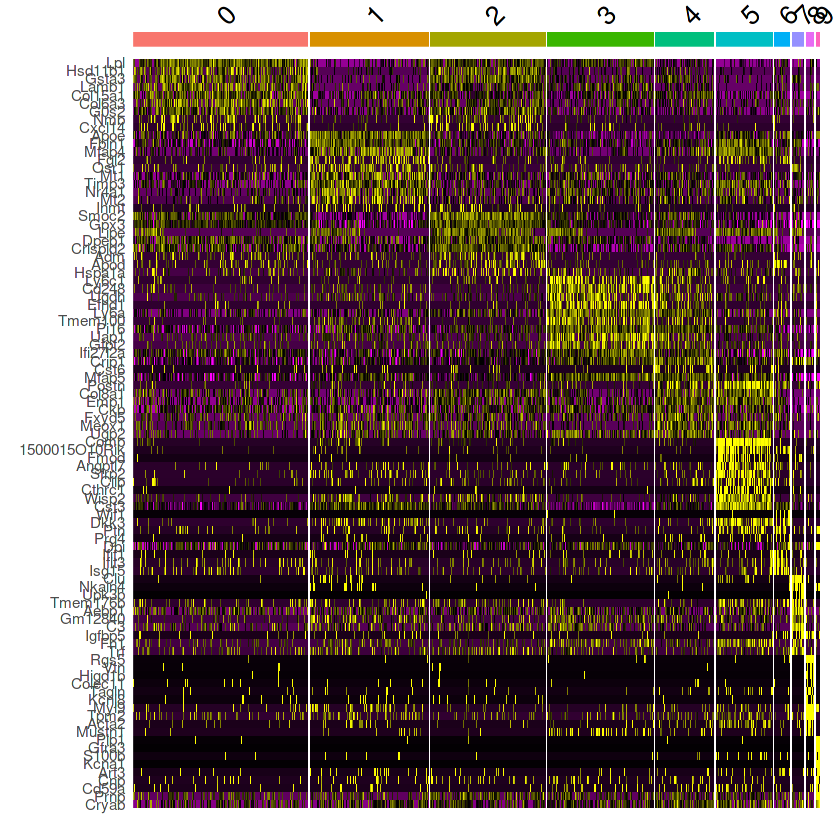

In [22]:
pbmc.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC) -> top10
DoHeatmap(object = pbmcF, features = top10$gene) + NoLegend()

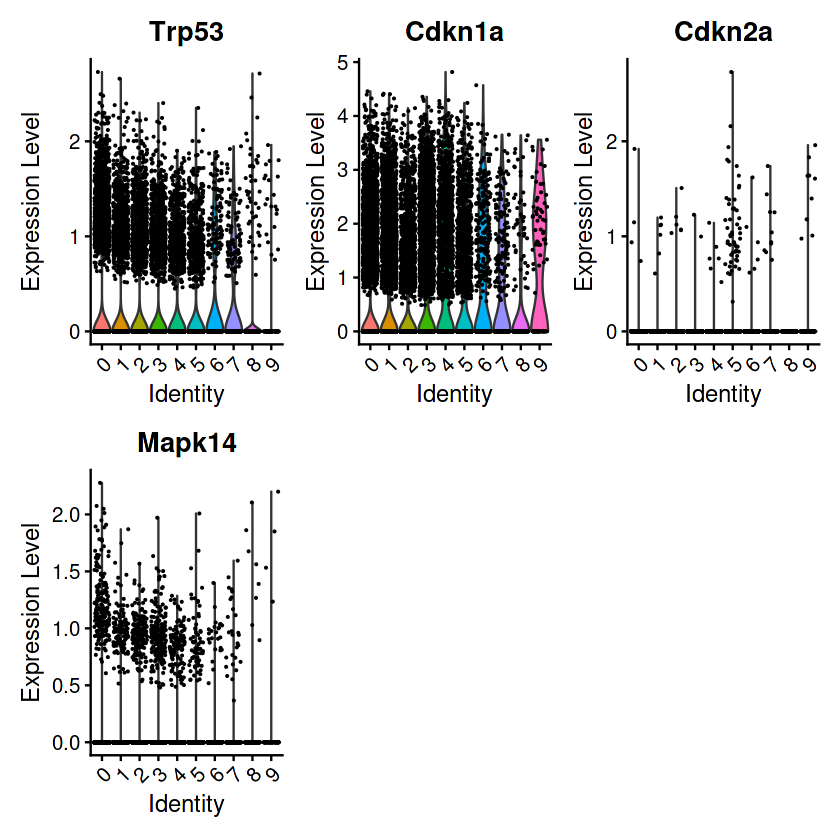

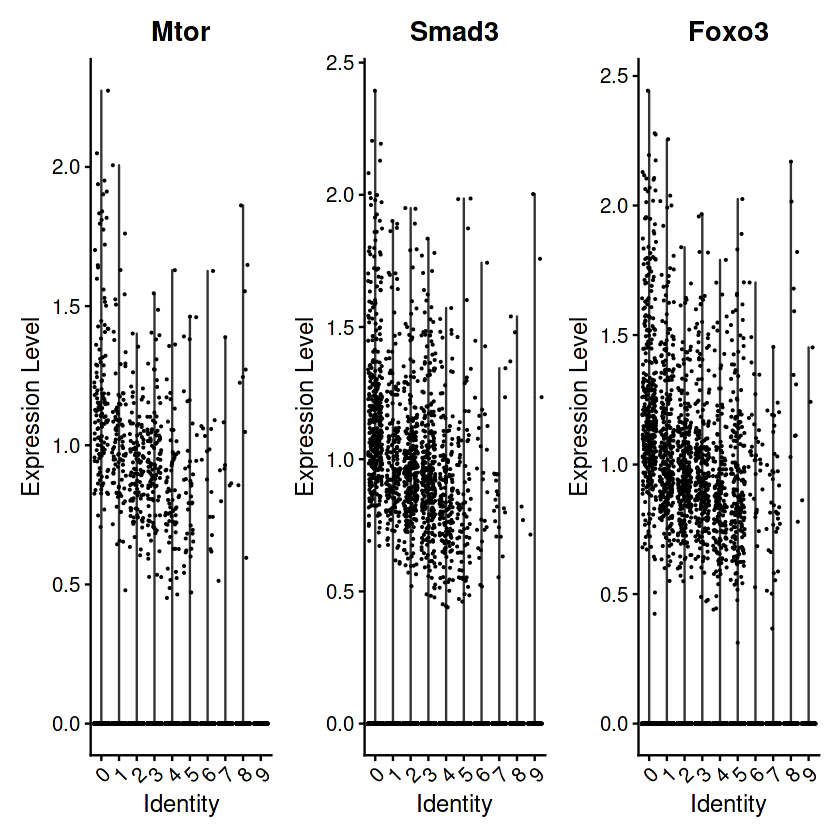

In [23]:
VlnPlot(object = pbmcF, features = c("Trp53","Cdkn1a","Cdkn2a","Mapk14"))
VlnPlot(object = pbmcF, features = c("Mtor","Smad3","Foxo3"))


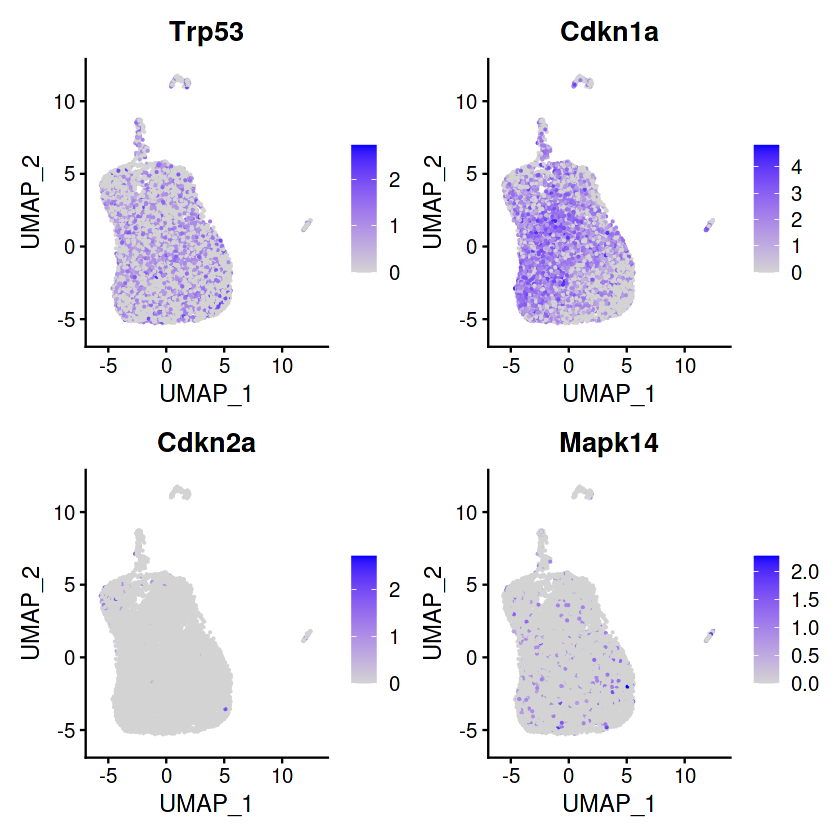

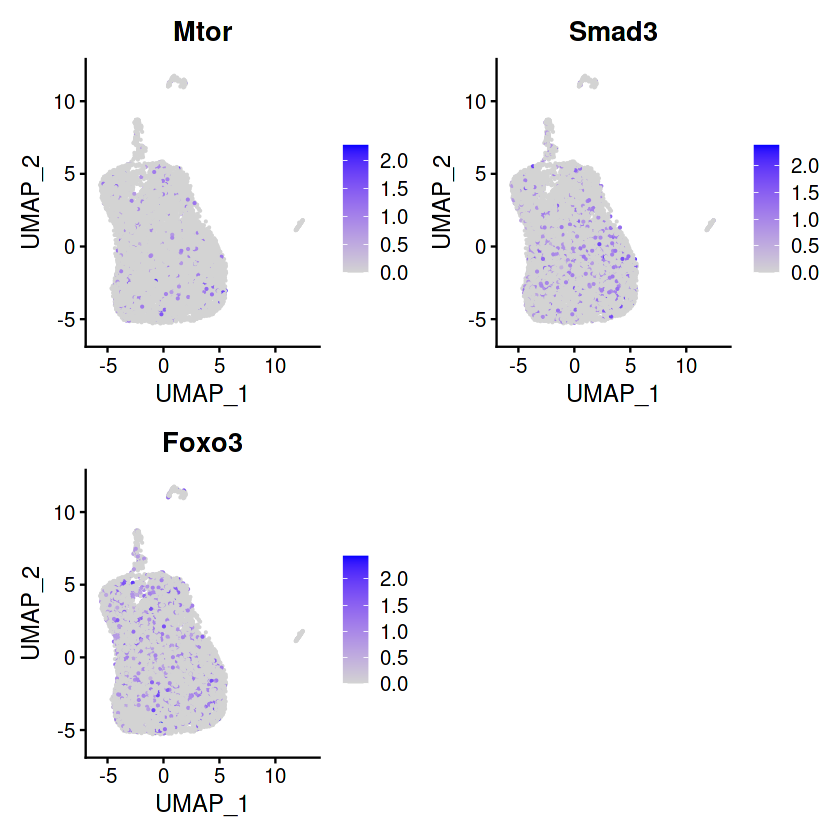

In [24]:
FeaturePlot(pbmcF, features = c("Trp53","Cdkn1a","Cdkn2a","Mapk14"))
FeaturePlot(pbmcF, features = c("Mtor","Smad3","Foxo3"))


Warning message in sparseMatrix(i = indices[] + 1, p = indptr[], x = as.numeric(x = counts[]), :
“'giveCsparse' has been deprecated; setting 'repr = "T"' for you”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of percent.mt.”
Warning message in cor(x = data[, 1], y = data[, 2]):
“the standard deviation is zero”
Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”


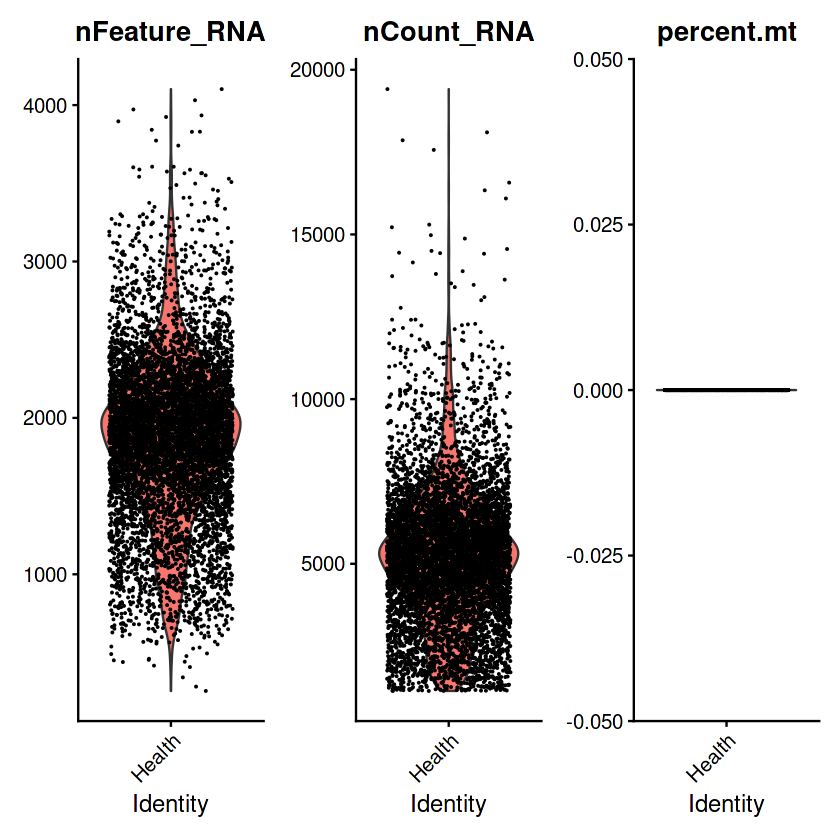

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 10017 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 10017 rows containing missing values (geom_point).”


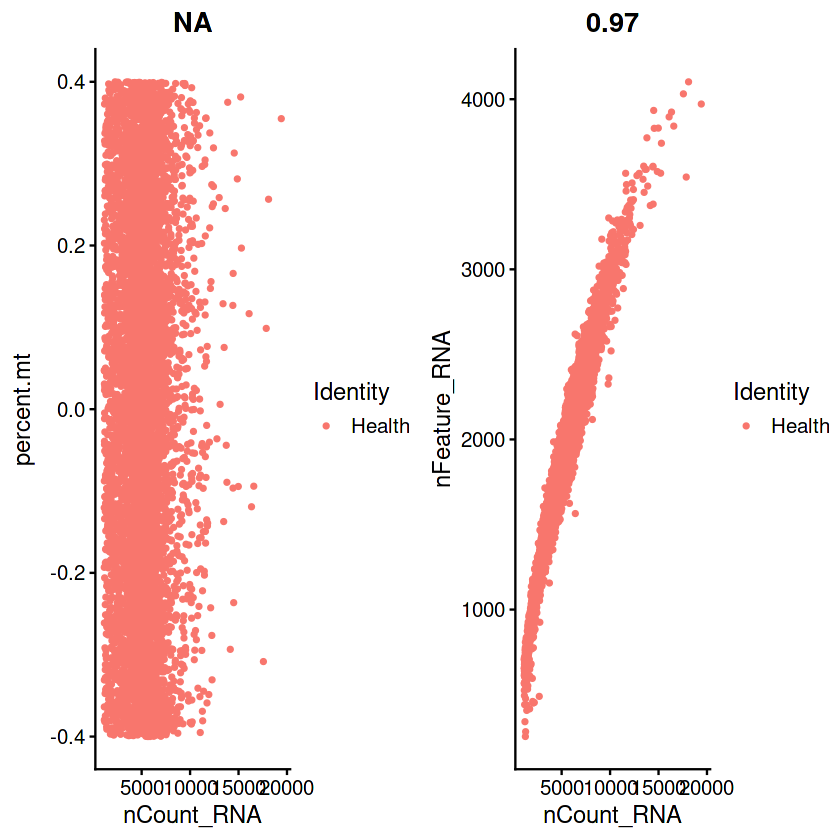

Centering and scaling data matrix

Centering and scaling data matrix

Regressing out percent.mt

Centering and scaling data matrix

PC_ 1 
Positive:  Rgs5, Tinagl1, Higd1b, Sncg, Cox4i2, Esam, Myl9, Pcp4l1, Mylk, Olfr558 
	   Notch3, Gucy1a3, Tagln, Myh11, Rgs4, Sept4, Vtn, Acta2, Casq2, Fabp4 
	   Tpm2, Lmod1, Rasgrp2, Colec11, Atp1b2, Bcam, Kcnj8, Nrip2, Sorbs2, Ndufa4l2 
Negative:  Mfap5, Pi16, S100a10, Ly6a, Cd34, Cd248, S100a6, Clec3b, Anxa2, Fstl1 
	   Pcolce2, Fbln2, Ifi27l2a, Efhd1, Dpt, Uap1, Gfpt2, Axl, Ly6c1, Cd55 
	   Ugdh, Fbn1, Tmem100, Pmp22, Serpinb6a, Igfbp6, Klf4, Islr, Timp2, Actg1 
PC_ 2 
Positive:  Gpx3, Lpl, Hsd11b1, Dpep1, Smoc2, Crispld2, Gsta3, G0s2, Pcolce, Mgp 
	   Clec3b, Ifitm3, Ogn, Nmb, Col6a3, Lamb1, Adm, Col4a1, Ly6e, Lum 
	   Spry1, Cxcl14, Col15a1, Gpm6b, Rgs17, Cp, Spon1, Tsc22d3, Sparcl1, Hspg2 
Negative:  Crip1, Mustn1, Cd9, Tagln, Acta2, Tmem100, Csrp2, Myl6, Rgs5, Myl9 
	   Cd248, Sncg, Cd200, Limch1, Sema3c, Fez1, Pdgfa, Postn, Sorbs2, Efhd1 
	 

PC_ 1 
Positive:  Rgs5, Tinagl1, Higd1b, Sncg, Cox4i2 
Negative:  Mfap5, Pi16, S100a10, Ly6a, Cd34 
PC_ 2 
Positive:  Gpx3, Lpl, Hsd11b1, Dpep1, Smoc2 
Negative:  Crip1, Mustn1, Cd9, Tagln, Acta2 
PC_ 3 
Positive:  Fbln1, Apoe, Mgp, Cst3, Mfap4 
Negative:  Pla1a, Lamb1, Pcsk6, Hspg2, Prss23 
PC_ 4 
Positive:  Rgs5, Sncg, Tinagl1, Pcp4l1, Acta2 
Negative:  Gfra3, Plp1, Kcna1, Gpr37l1, S100b 
PC_ 5 
Positive:  Bgn, Meox1, Col8a1, Mfap4, Fibin 
Negative:  C3, Zfp36, Socs3, Fos, Cxcl1 


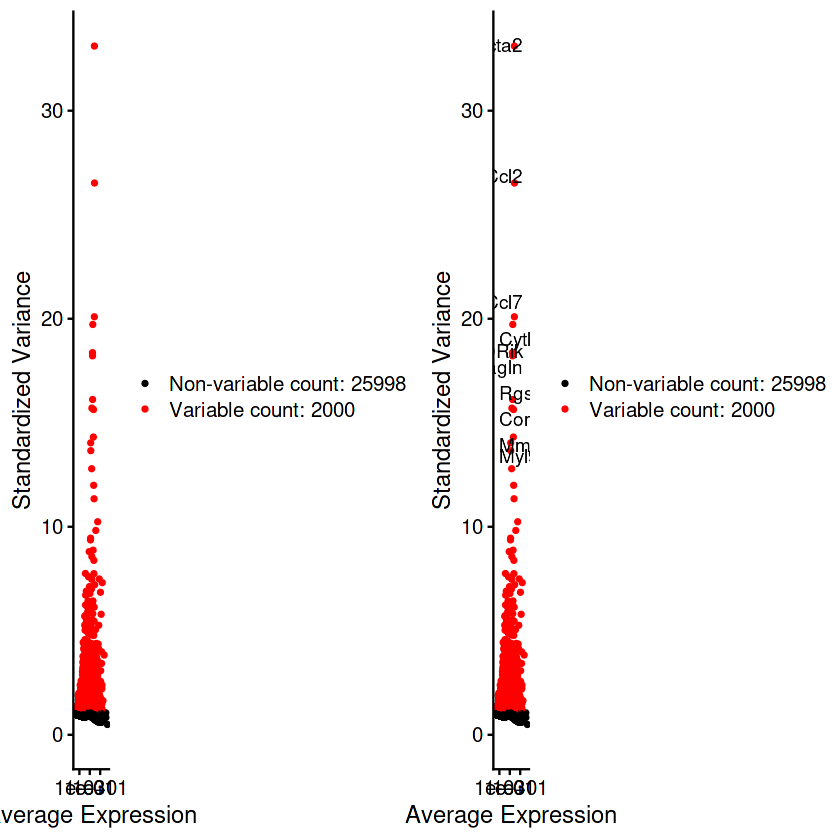

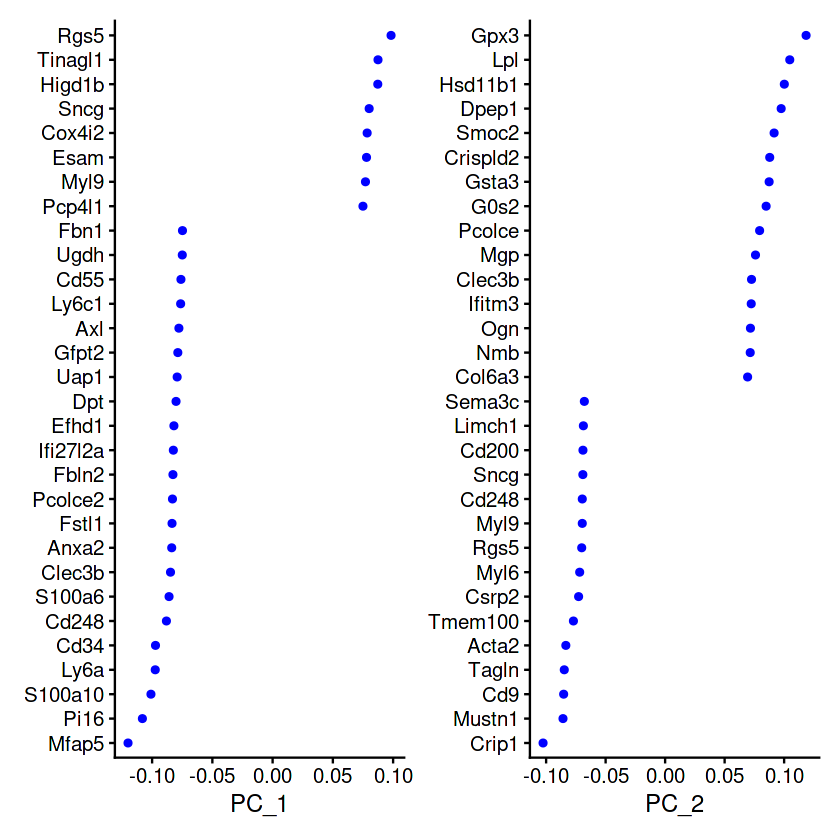

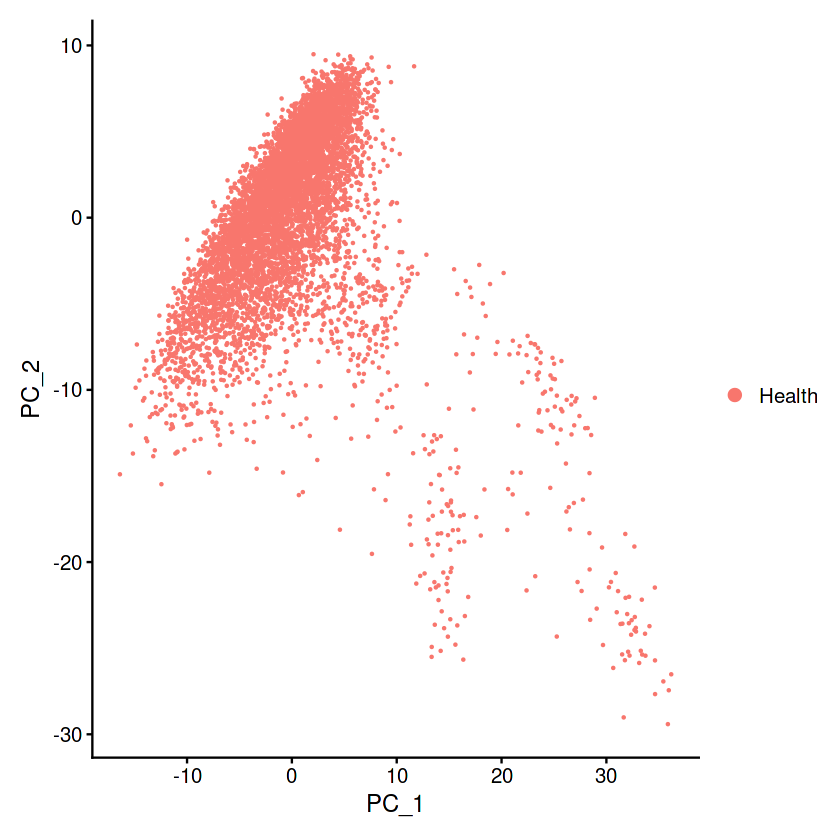

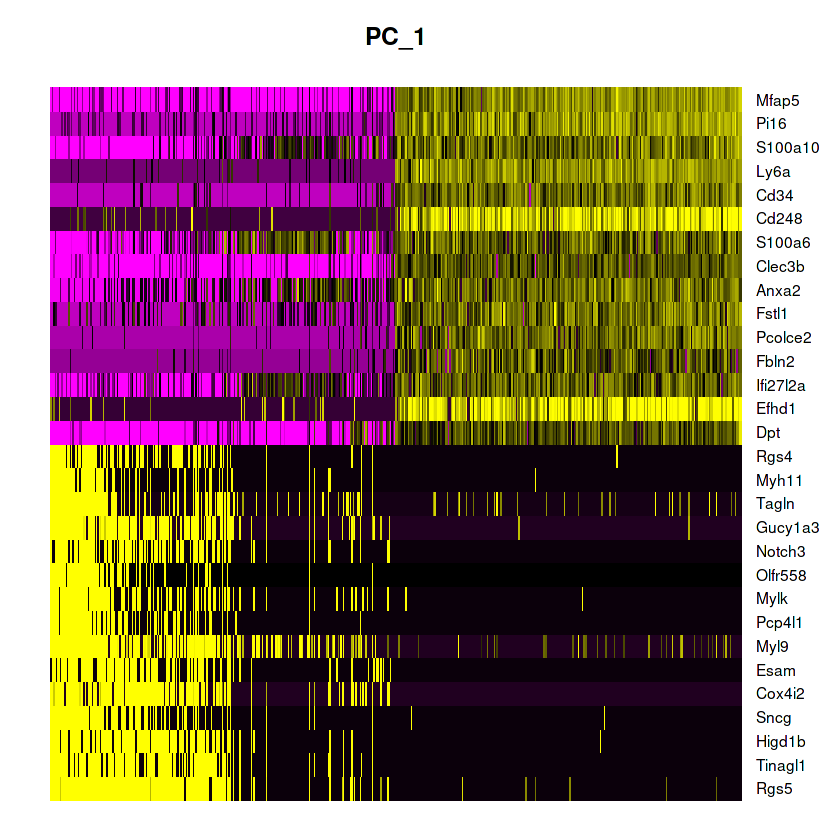

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 7079
Number of edges: 214435

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8122
Number of communities: 11
Elapsed time: 0 seconds


AAACCTGAGAGGTAGA-1 AAACCTGAGATCCTGT-1 AAACCTGCAAACGCGA-1 AAACCTGCAAGAAAGG-1 
                 4                  8                  3                  1 
AAACCTGCAGCTGCAC-1 
                 5 
Levels: 0 1 2 3 4 5 6 7 8 9 10

Warning message:
“The default method for RunUMAP has changed from calling Python UMAP via reticulate to the R-native UWOT using the cosine metric
To use Python UMAP via reticulate, set umap.method to 'umap-learn' and metric to 'correlation'
This message will be shown once per session”
12:39:56 UMAP embedding parameters a = 0.9922 b = 1.112

12:39:56 Read 7079 rows and found 10 numeric columns

12:39:56 Using Annoy for neighbor search, n_neighbors = 30

12:39:56 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:39:57 Writing NN index file to temp file /tmp/RtmpmdnoMD/file21309a5c2c9

12:39:57 Searching Annoy index using 1 thread, search_k = 3000

12:39:59 Annoy recall = 100%

12:40:00 Commencing smooth kNN distance calibration using 1 thread

12:40:01 Initializing from

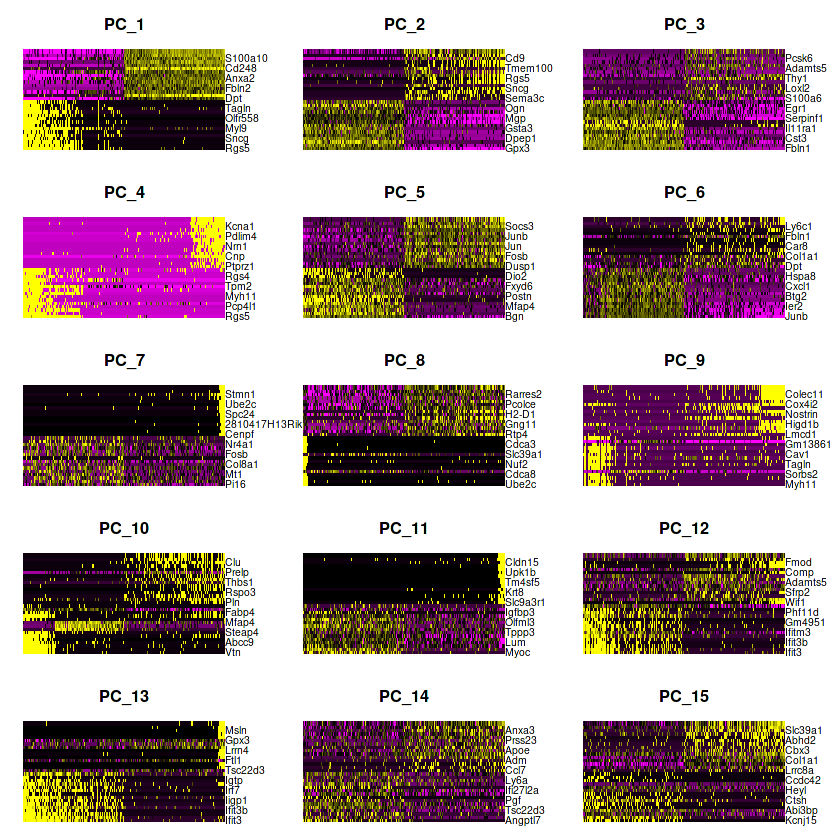

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8

Calculating cluster 9

Calculating cluster 10



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
9.518531e-129,1.3060109,0.698,0.445,2.664998e-124,0,Hsd11b1
1.701706e-92,0.9274170,0.762,0.612,4.764437e-88,0,Lamb1
0.000000e+00,1.8176493,0.629,0.122,0.000000e+00,1,Ly6c1
0.000000e+00,1.7623754,0.797,0.236,0.000000e+00,1,Cd248
5.128545e-96,0.7021240,0.787,0.488,1.435890e-91,2,Col8a1
8.234779e-90,0.6911328,0.604,0.300,2.305573e-85,2,Ccnd1
1.236499e-155,1.1563228,0.814,0.436,3.461951e-151,3,Hsd11b1
1.412890e-93,1.5567940,0.431,0.165,3.955810e-89,3,Cxcl14
4.662789e-215,1.5963127,0.983,0.845,1.305488e-210,4,Apoe


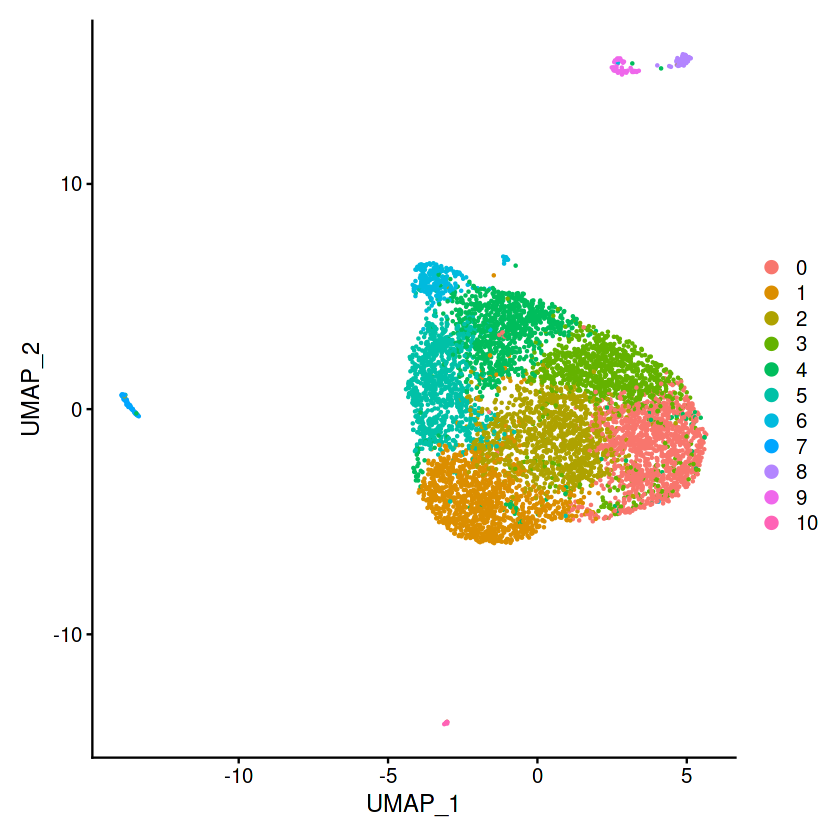

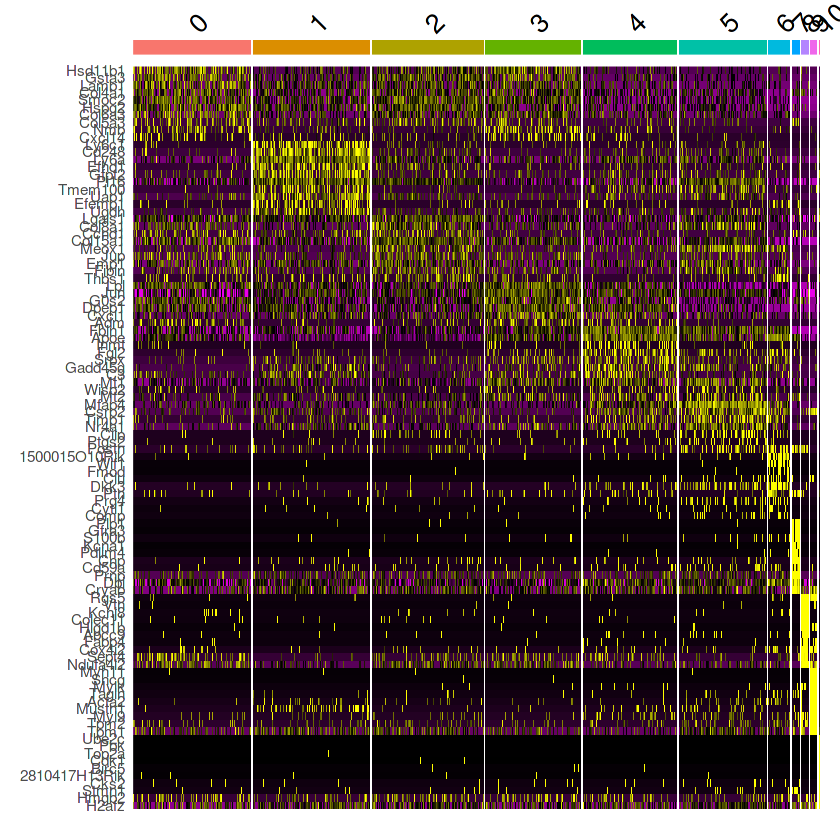

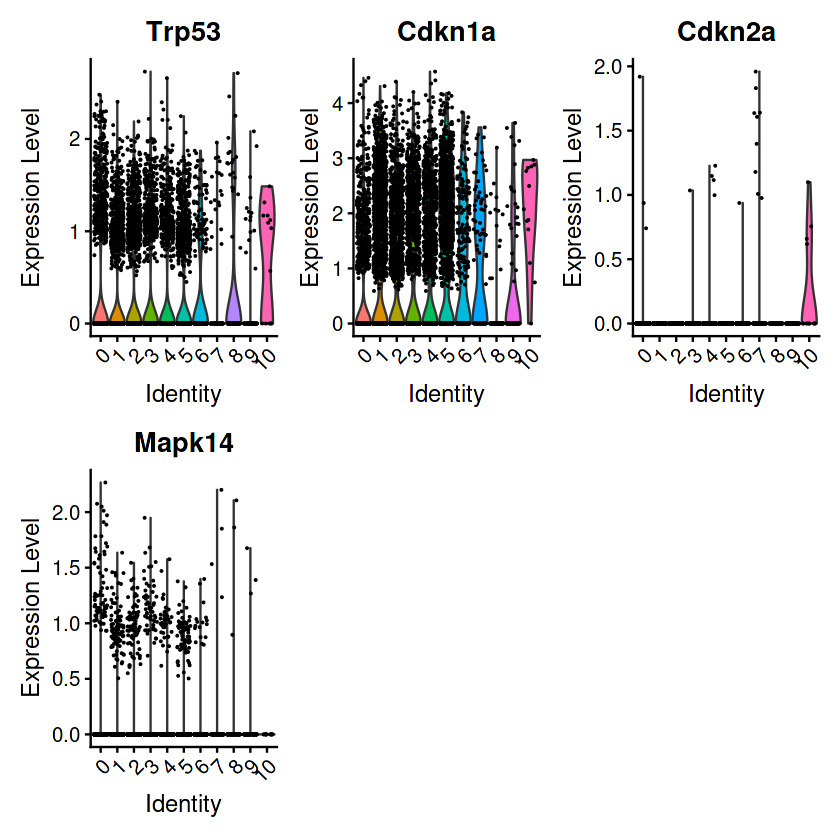

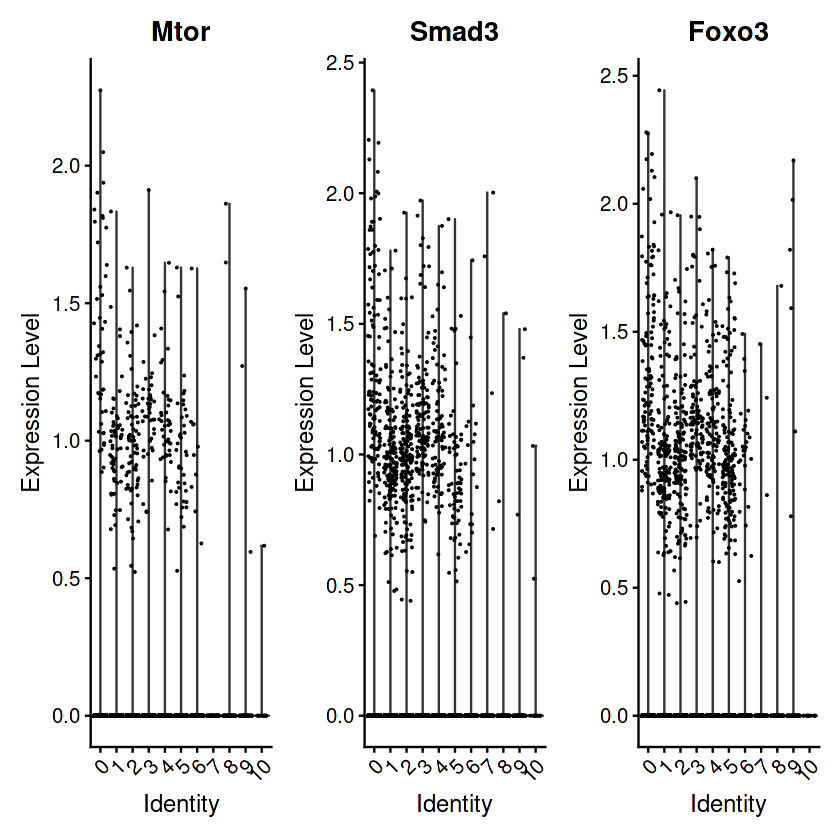

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: Top2A”


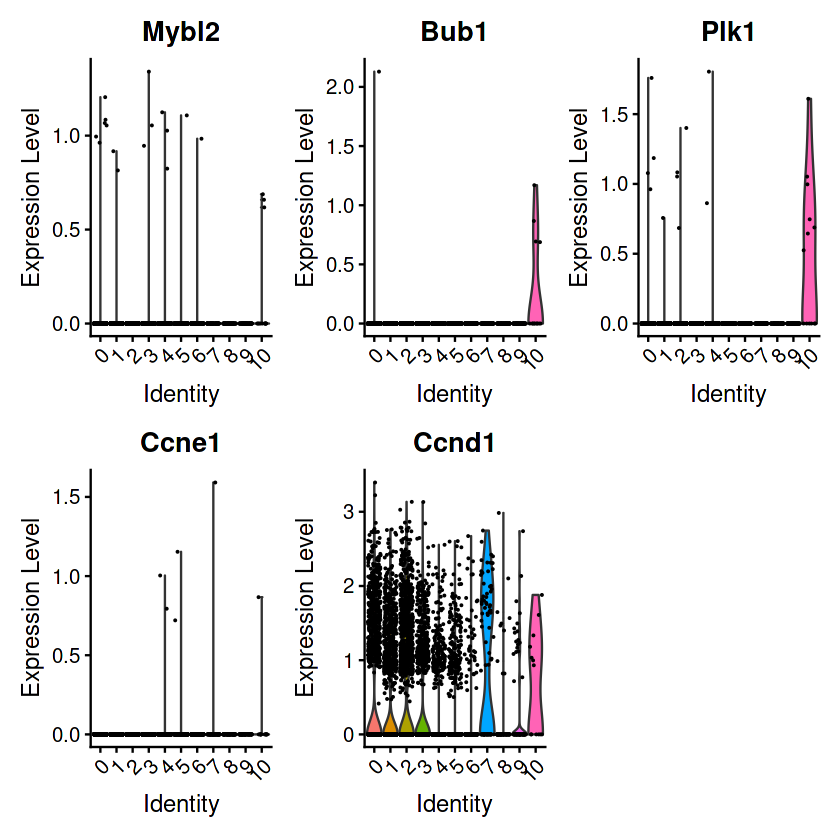

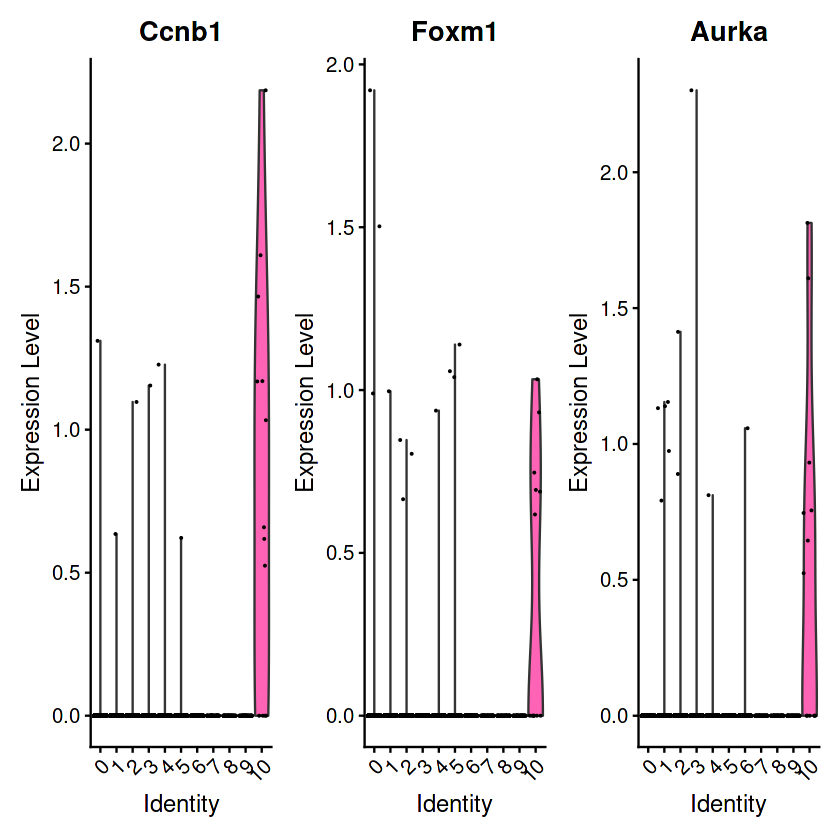

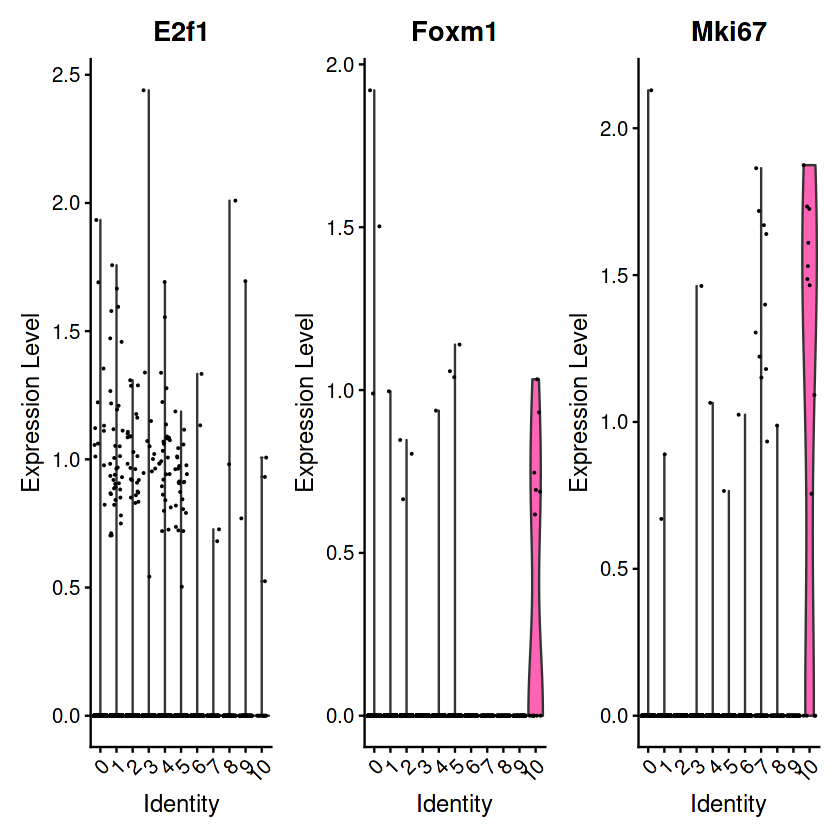

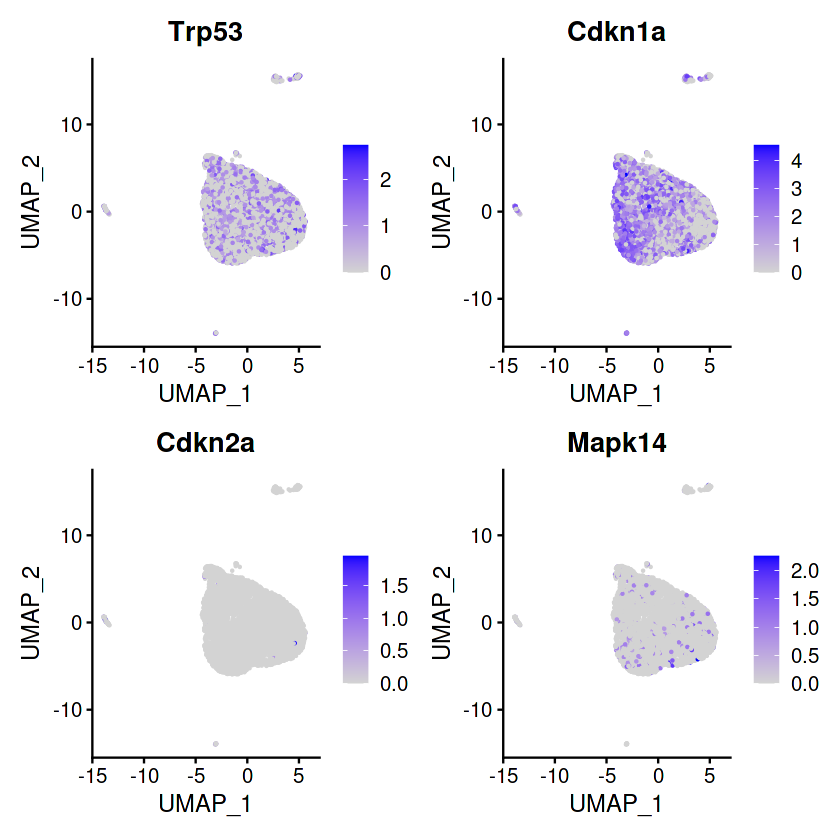

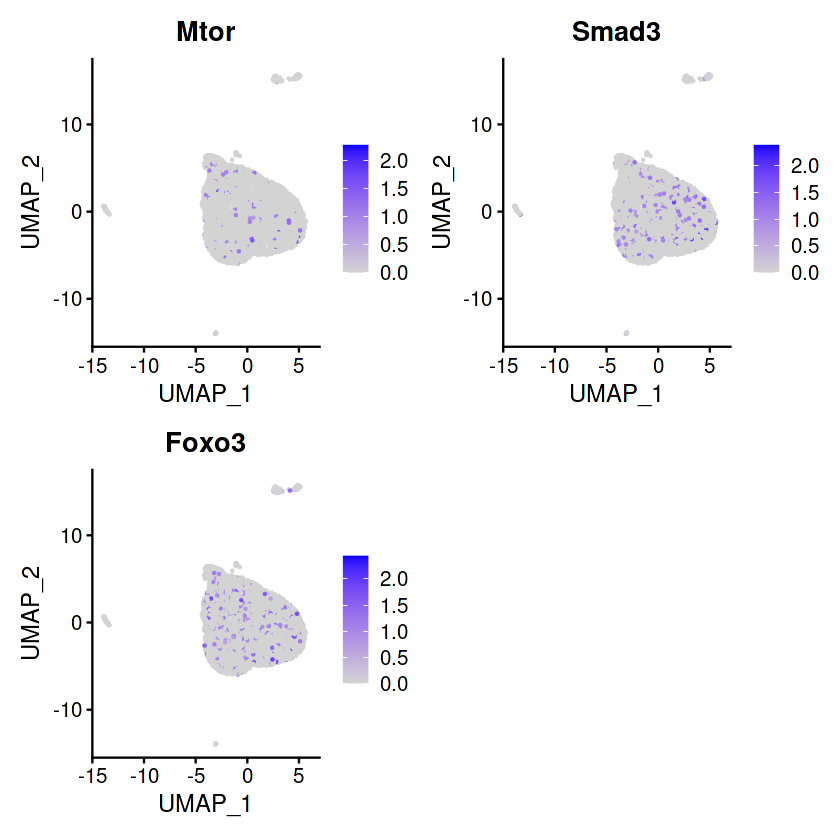

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Top2A”


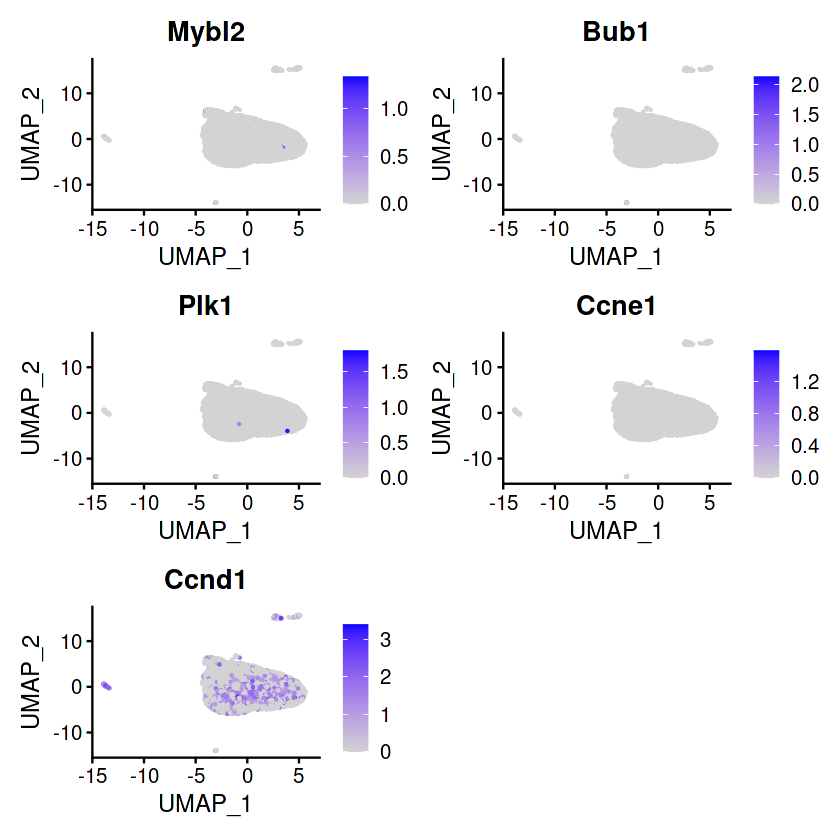

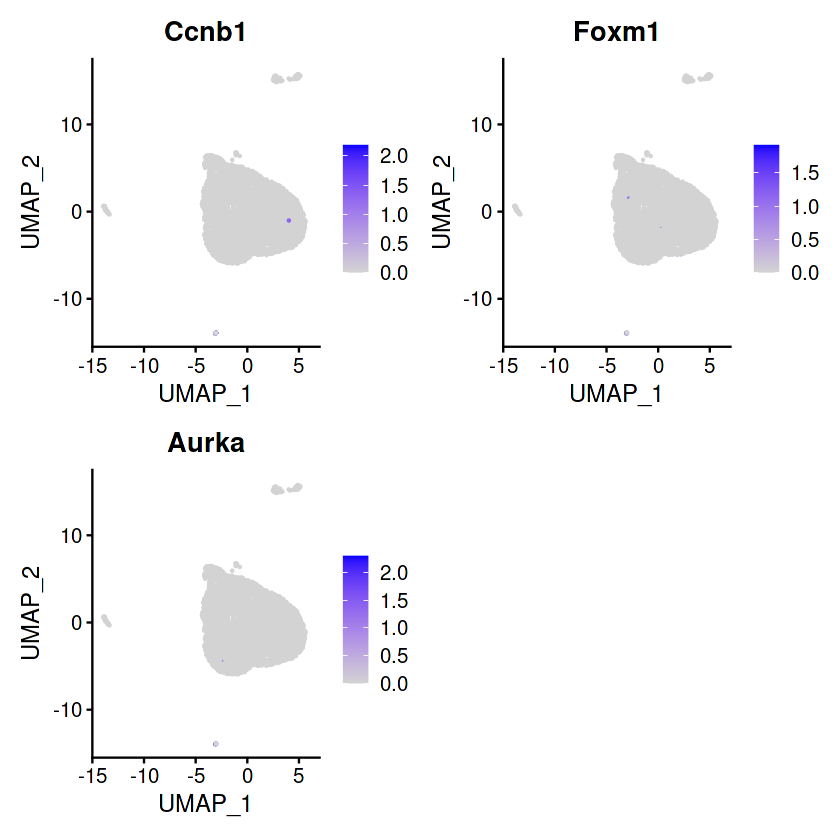

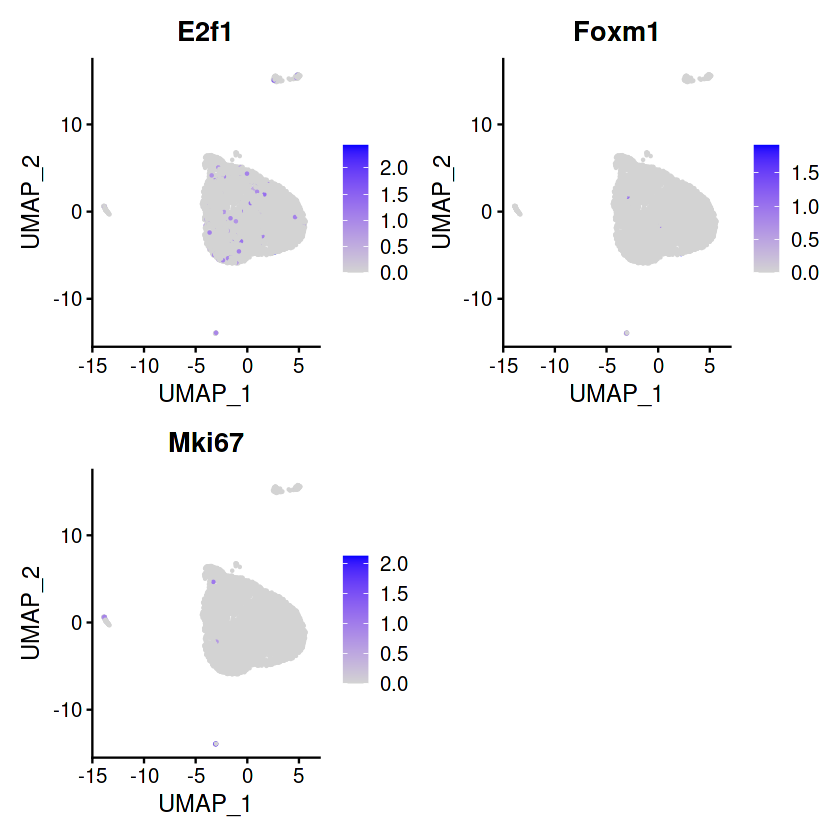

In [43]:
library(dplyr)
library(Seurat)
library(monocle3)
library("stringr")
library("factoextra")
library("Rtsne")

Healthy <-Read10X_h5(filename="/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/GSM3847600_HealthyMyocardium_FilteredGeneBCMatrices.h5")
Healthy <- CreateSeuratObject(counts = Healthy , project = "Health")
Healthy[["percent.mt"]] <- PercentageFeatureSet(object = Healthy, pattern = "^MT-")

VlnPlot(object = Healthy, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)
plot1 <- FeatureScatter(object = Healthy, feature1 = "nCount_RNA", feature2 = "percent.mt") 
plot2 <- FeatureScatter(object =Healthy, feature1 = "nCount_RNA", feature2 = "nFeature_RNA") 
CombinePlots(plots = list(plot1,plot2))

Healthy <- NormalizeData(object = Healthy, normalization.method = "LogNormalize", scale.factor = 1e4)

Healthy <- FindVariableFeatures(object = Healthy,selection.method = 'vst', nfeatures = 2000)
top10 <- head(x = VariableFeatures(object = Healthy), 10)
plot1 <- VariableFeaturePlot(object = Healthy)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)

CombinePlots(plots = list(plot1, plot2))
all.genes <- rownames(x = Healthy)
Healthy <- ScaleData(object = Healthy, features = all.genes)
Healthy <- ScaleData(object = Healthy)
Healthy <- ScaleData(object = Healthy, vars.to.regress = 'percent.mt')

Healthy <- RunPCA(object = Healthy, features = VariableFeatures(object = Healthy))
print(x = Healthy[['pca']], dims = 1:5, nfeatures = 5)
VizDimLoadings(object = Healthy, dims = 1:2, reduction = 'pca')
DimPlot(object = Healthy, reduction = 'pca')
DimHeatmap(object = Healthy, dims = 1, cells = 500, balanced = TRUE)

DimHeatmap(object = Healthy, dims = 1:15, cells = 500, balanced = TRUE)

Healthy <- FindNeighbors(object = Healthy, dims = 1:10)
Healthy <- FindClusters(object = Healthy, resolution = 0.5)
head(x = Idents(object = Healthy), 5)

Healthy <- RunUMAP(object = Healthy, dims = 1:10)

DimPlot(object = Healthy, reduction = 'umap')

pbmc.markers <- FindAllMarkers(object = Healthy, only.pos = TRUE, min.pct = 0.25,logfc.threshold = 0.17)
pbmc.markers %>% group_by(cluster) %>% top_n(n = 2, wt = avg_log2FC)

pbmc.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC) -> top10
DoHeatmap(object = Healthy, features = top10$gene) + NoLegend()

VlnPlot(object = Healthy, features = c("Trp53","Cdkn1a","Cdkn2a","Mapk14"))
VlnPlot(object = Healthy, features = c("Mtor","Smad3","Foxo3"))

VlnPlot(object = Healthy, features = c("Mybl2", "Bub1","Plk1","Ccne1", "Ccnd1"))
VlnPlot(object = Healthy, features = c("Ccnb1","Foxm1","Top2A","Aurka"))
VlnPlot(object = Healthy, features = c("E2f1","Foxm1","Mki67"))

FeaturePlot(Healthy, features = c("Trp53","Cdkn1a","Cdkn2a","Mapk14"))
FeaturePlot(Healthy, features = c("Mtor","Smad3","Foxo3"))

FeaturePlot(Healthy, features = c("Mybl2", "Bub1","Plk1","Ccne1", "Ccnd1"))
FeaturePlot(Healthy, features = c("Ccnb1","Foxm1","Top2A","Aurka"))
FeaturePlot(Healthy, features = c("E2f1","Foxm1","Mki67"))

Warning message in sparseMatrix(i = indices[] + 1, p = indptr[], x = as.numeric(x = counts[]), :
“'giveCsparse' has been deprecated; setting 'repr = "T"' for you”
Warning message in SingleExIPlot(type = type, data = data[, x, drop = FALSE], idents = idents, :
“All cells have the same value of percent.mt.”
Warning message in cor(x = data[, 1], y = data[, 2]):
“the standard deviation is zero”
Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”


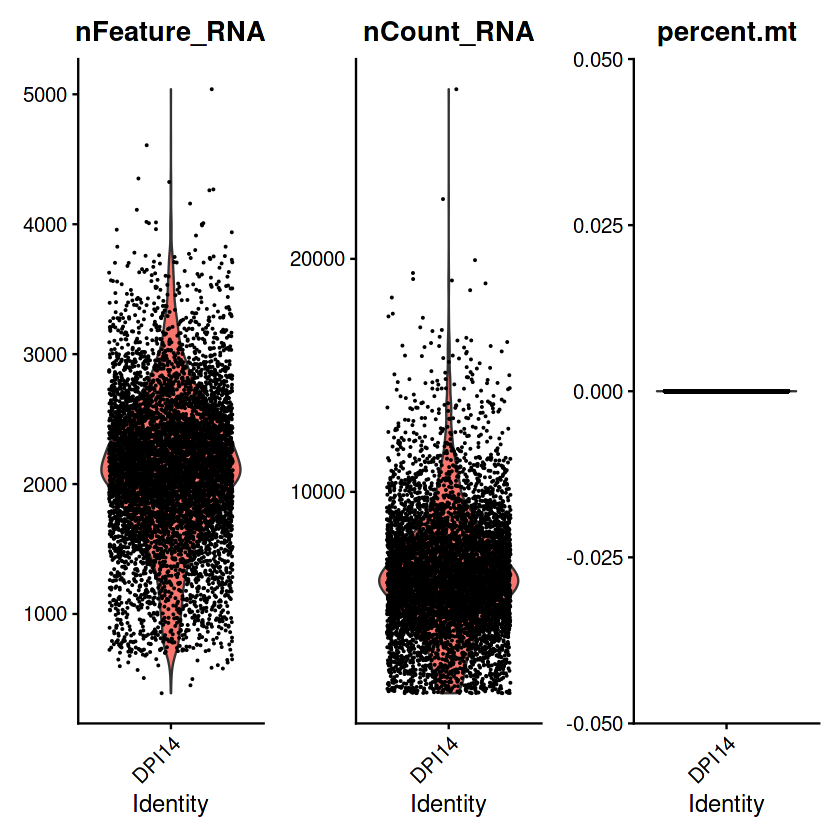

When using repel, set xnudge and ynudge to 0 for optimal results

Warning message:
“CombinePlots is being deprecated. Plots should now be combined using the patchwork system.”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 9838 rows containing missing values (geom_point).”
Warning message:
“Transformation introduced infinite values in continuous x-axis”
Warning message:
“Removed 9838 rows containing missing values (geom_point).”


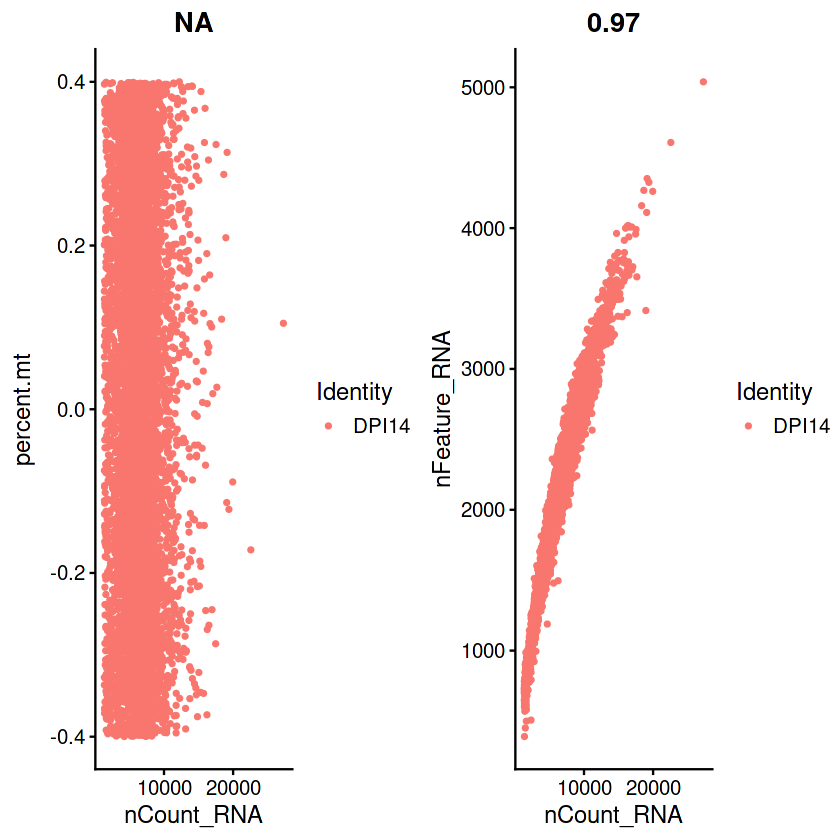

Centering and scaling data matrix

Centering and scaling data matrix

Regressing out percent.mt

Centering and scaling data matrix

PC_ 1 
Positive:  Comp, 1500015O10Rik, Dkk3, Fmod, Cd200, Sfrp2, Cthrc1, Ddah1, Mfap4, Fn1 
	   Pdlim3, Angptl7, Id3, Csrp2, Mdk, Cst3, Clu, Cpe, Col8a2, Cpxm2 
	   Tgfb3, Ltbp2, Fxyd6, Nr4a2, Mgp, Acta2, Cdc42ep3, Nkain4, Postn, Tcea3 
Negative:  Clec3b, Smoc2, Sparcl1, Ms4a4d, Dpep1, Pla1a, Lpl, Gsta3, Hsd11b1, Lamb1 
	   Pcsk6, Adamts5, Gpx3, Gstm1, Nid1, S100a6, Abca8a, G0s2, Tnxb, Vwa1 
	   Hspg2, Ccnd1, Ifi27l2a, Ifitm3, Ifi205, Pcolce, Col15a1, Cd34, Fbln2, Scara5 
PC_ 2 
Positive:  Bgn, Postn, Aspn, Mfap5, Col8a1, Fibin, Emp1, Sparc, Comp, Cilp 
	   Fxyd6, Meox1, Ckb, Ltbp2, Ddah1, Fstl1, Pi16, Ctgf, Cd9, Fam101b 
	   Frzb, Prelp, Igfbp7, Cst3, Pmepa1, Serpinf1, 1500015O10Rik, Pcolce2, Islr, Cthrc1 
Negative:  Nkain4, Lrrn4, Gpm6a, Upk3b, Adam33, Slc9a3r1, Wt1, C2, Clu, Upk1b 
	   Krt19, C3, Rspo1, Esam, Msln, Aqp1, Atp1b1, Cxadr, Tmem151a, Pdlim4 

PC_ 1 
Positive:  Comp, 1500015O10Rik, Dkk3, Fmod, Cd200 
Negative:  Clec3b, Smoc2, Sparcl1, Ms4a4d, Dpep1 
PC_ 2 
Positive:  Bgn, Postn, Aspn, Mfap5, Col8a1 
Negative:  Nkain4, Lrrn4, Gpm6a, Upk3b, Adam33 
PC_ 3 
Positive:  Crip1, Cd248, Efhd1, S100a10, Ly6c1 
Negative:  Mgp, Apoe, Cst3, Crispld2, Sept4 
PC_ 4 
Positive:  Upk3b, Upk1b, Gpm6a, Lrrn4, Krt19 
Negative:  Junb, Egr1, Fos, Zfp36, Nr4a1 
PC_ 5 
Positive:  Tmem100, Sulf2, Fbln1, Col14a1, Cd248 
Negative:  Junb, Jun, Fos, Btg2, Ier2 


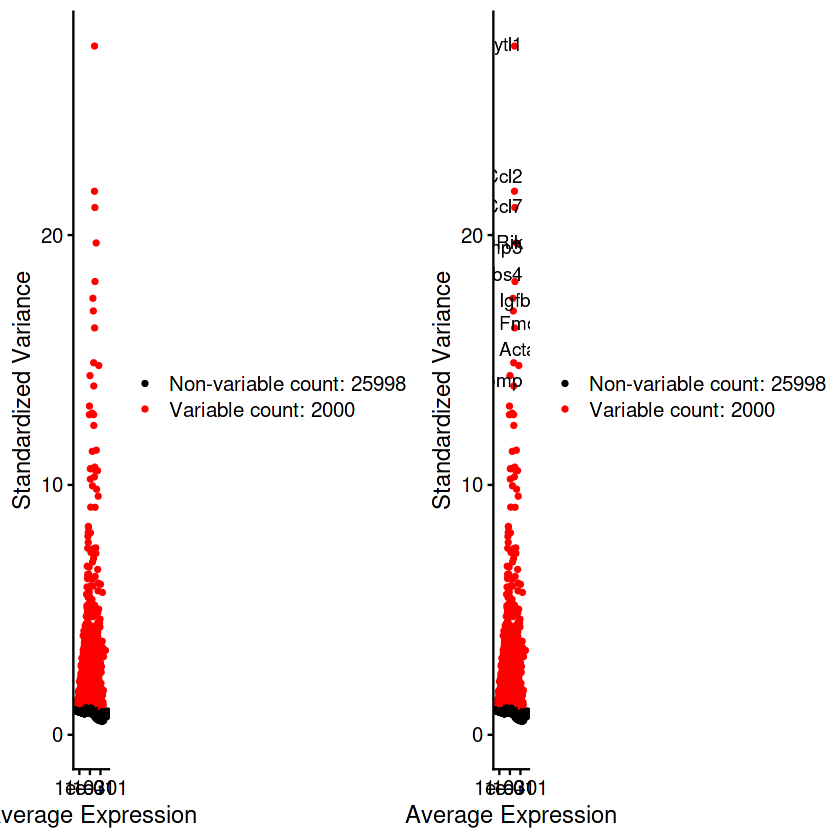

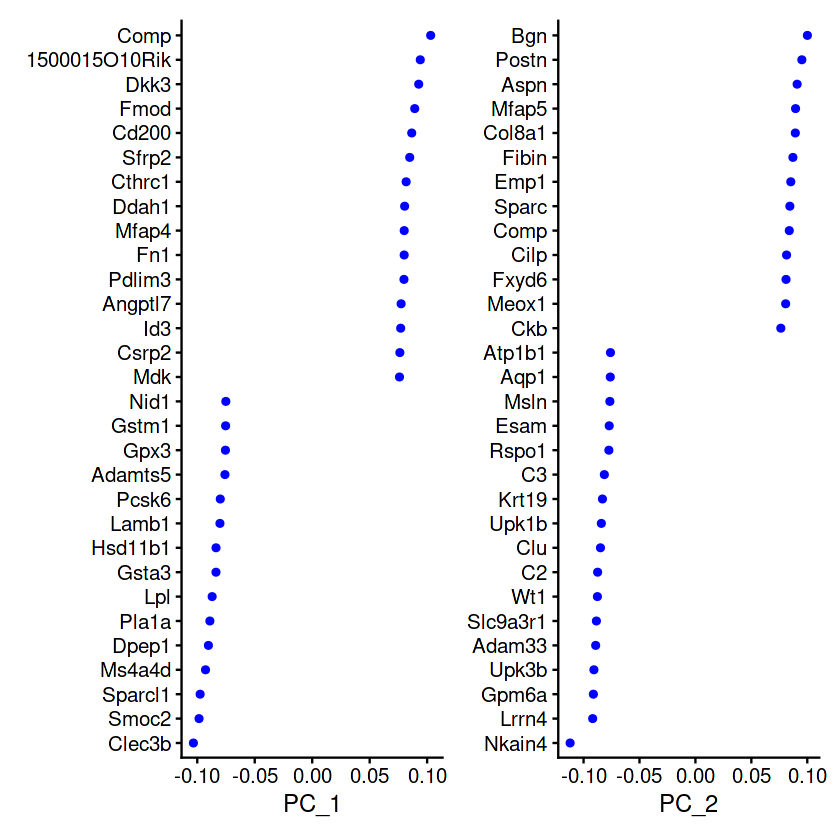

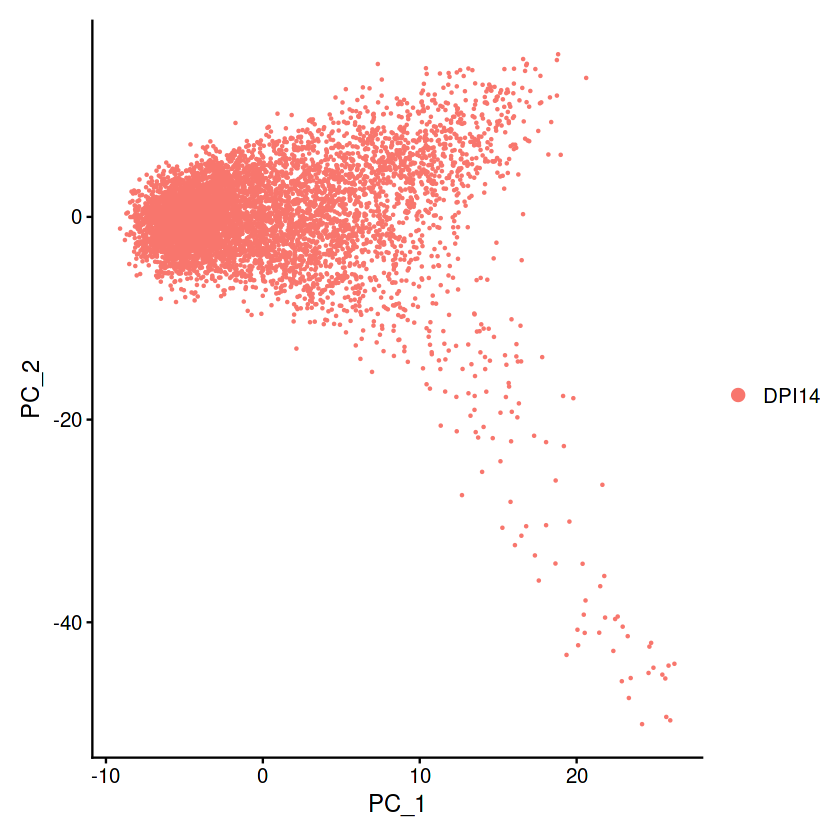

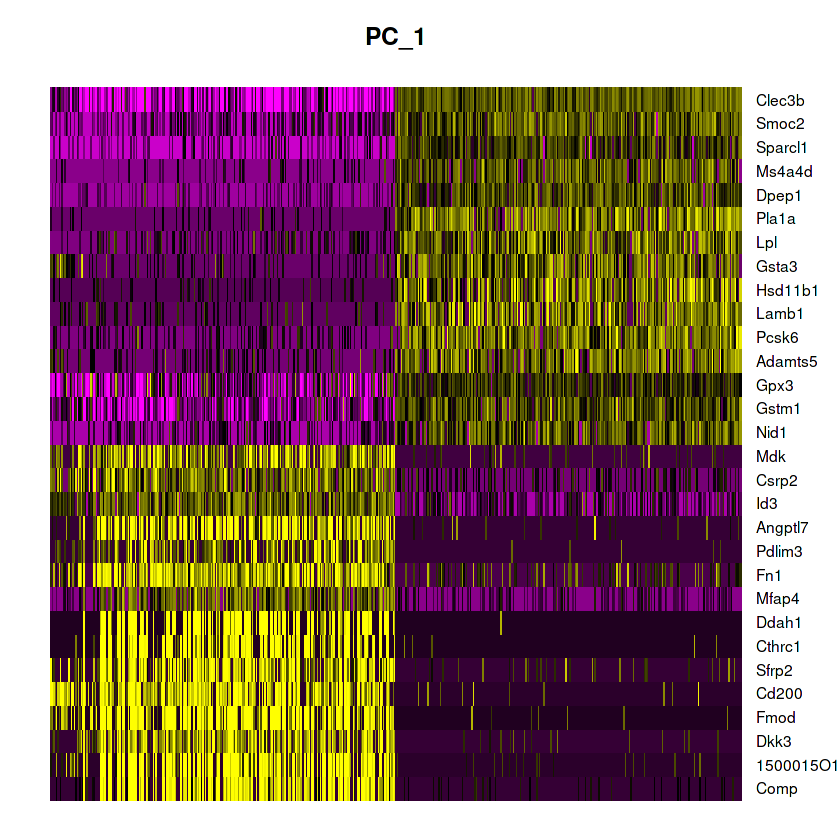

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 6805
Number of edges: 207482

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8085
Number of communities: 9
Elapsed time: 0 seconds


AAACCTGAGATGTCGG-1 AAACCTGAGCTCTCGG-1 AAACCTGAGTGTACGG-1 AAACCTGAGTTGAGAT-1 
                 3                  3                  1                  0 
AAACCTGCAAAGTCAA-1 
                 1 
Levels: 0 1 2 3 4 5 6 7 8

12:33:01 UMAP embedding parameters a = 0.9922 b = 1.112

12:33:01 Read 6805 rows and found 10 numeric columns

12:33:01 Using Annoy for neighbor search, n_neighbors = 30

12:33:01 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

12:33:02 Writing NN index file to temp file /tmp/Rtmpn6O805/file124848fab8d6

12:33:02 Searching Annoy index using 1 thread, search_k = 3000

12:33:04 Annoy recall = 100%

12:33:05 Commencing smooth kNN distance calibration using 1 thread

12:33:06 Initializing from normalized Laplacian + noise

12:33:06 Commencing optimization for 500 epochs, with 265984 positive edges

12:33:13 Optimization finished



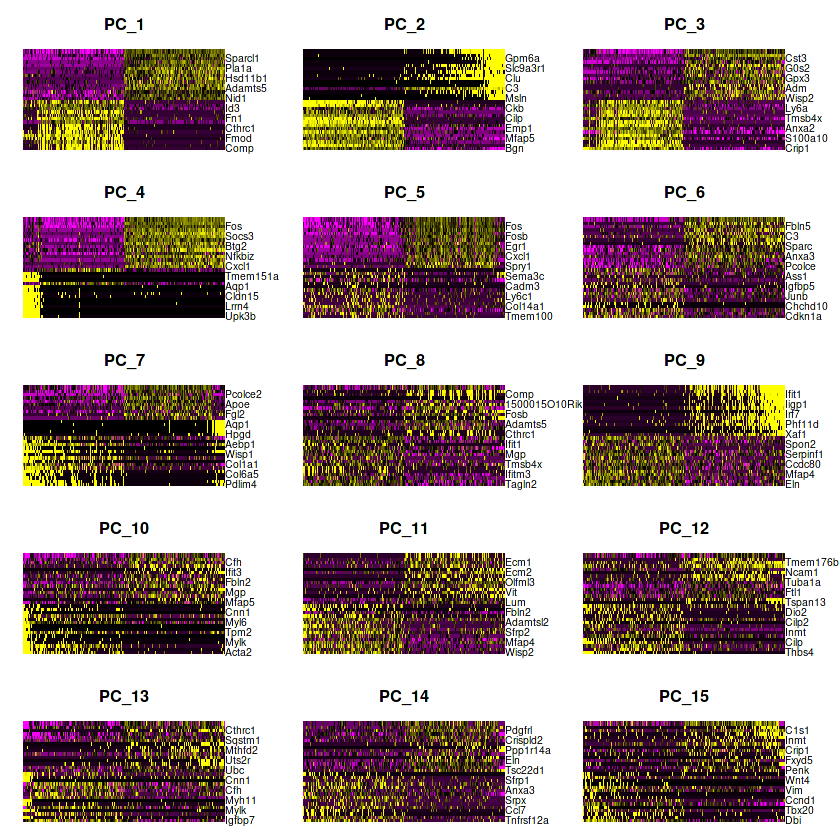

Calculating cluster 0

Calculating cluster 1

Calculating cluster 2

Calculating cluster 3

Calculating cluster 4

Calculating cluster 5

Calculating cluster 6

Calculating cluster 7

Calculating cluster 8



p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
0.000000e+00,1.340158,0.576,0.095,0.000000e+00,0,Efhd1
2.741081e-272,1.481976,0.614,0.180,7.674479e-268,0,Ly6c1
2.236018e-215,1.281502,0.838,0.444,6.260403e-211,1,Hsd11b1
9.699654e-98,1.582203,0.427,0.182,2.715709e-93,1,Cxcl14
7.335752e-218,1.057458,0.962,0.838,2.053864e-213,2,Smoc2
1.402889e-157,1.190392,0.778,0.460,3.927810e-153,2,Hsd11b1
1.322851e-258,1.747428,0.995,0.923,3.703717e-254,3,Apoe
8.384054e-63,1.546954,0.375,0.174,2.347367e-58,3,Inmt
0.000000e+00,4.094046,0.925,0.234,0.000000e+00,4,Comp


Warning message in DoHeatmap(object = DPI_14, features = top10$gene):
“The following features were omitted as they were not found in the scale.data slot for the RNA assay: mt-Cytb, mt-Nd2, Ifngr1”


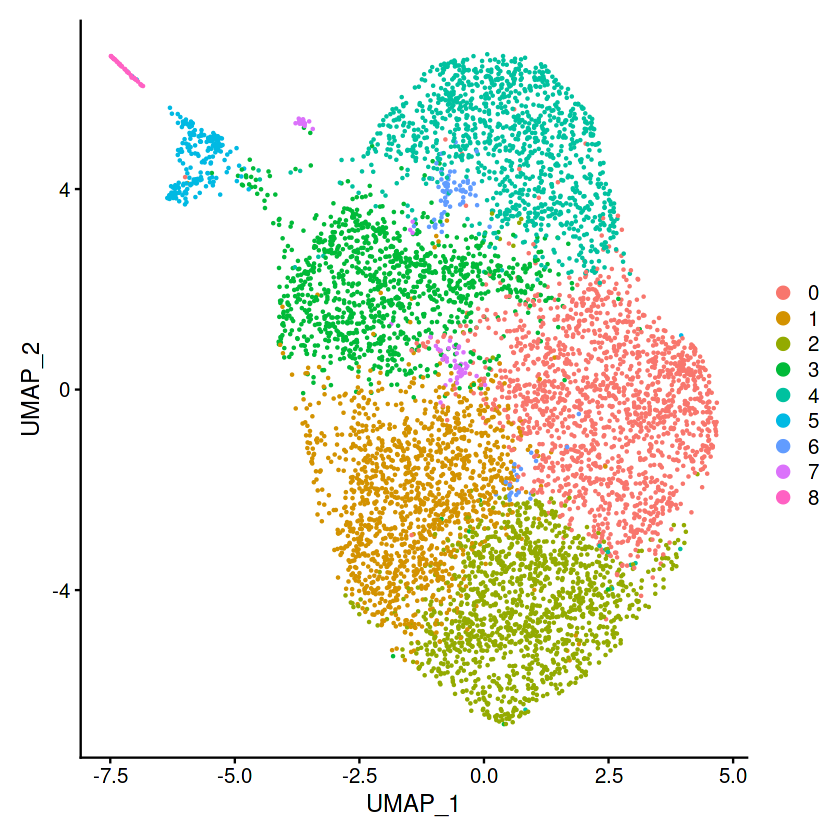

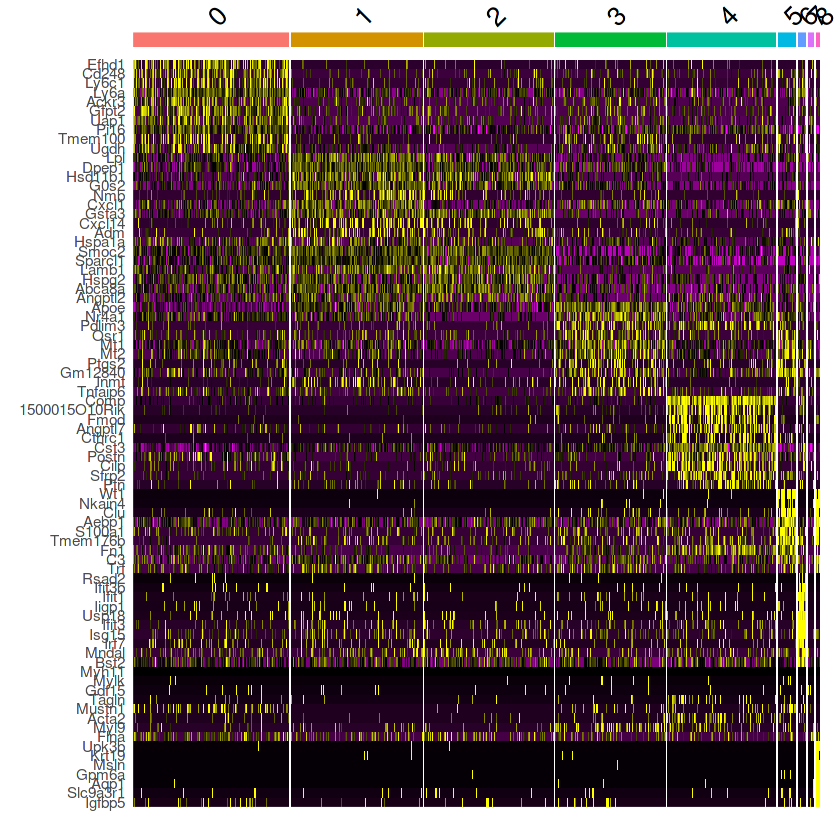

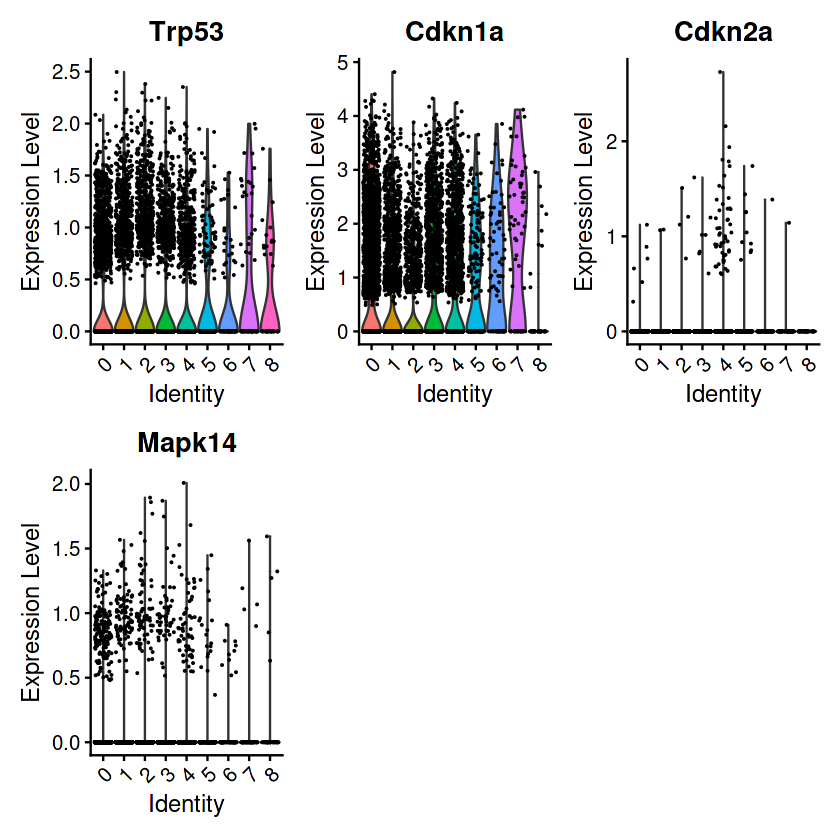

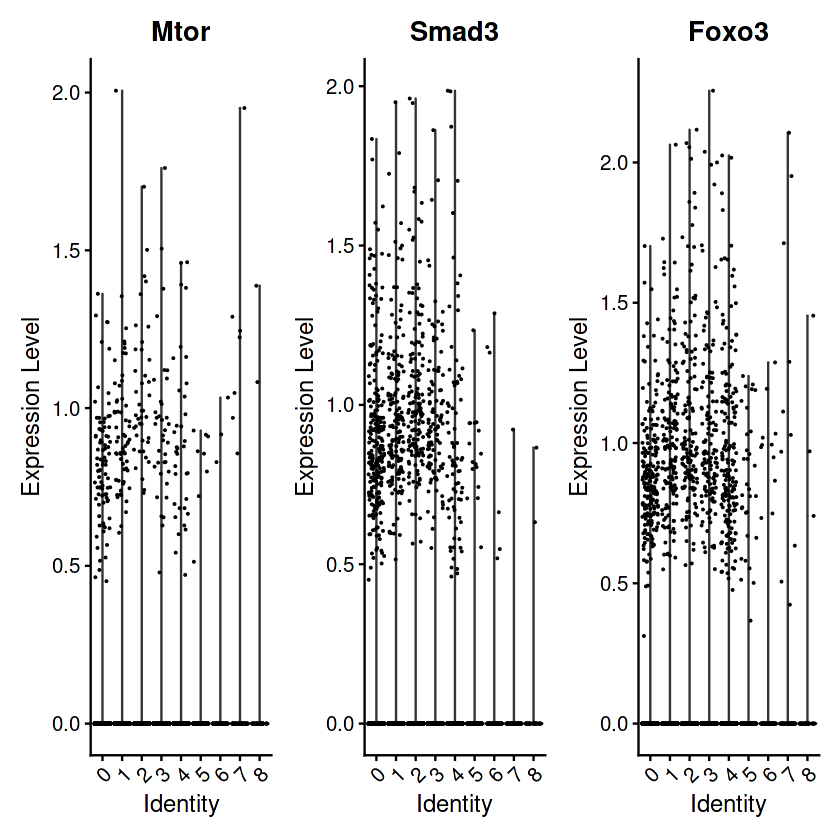

Warning message in FetchData(object = object, vars = features, slot = slot):
“The following requested variables were not found: Top2A”


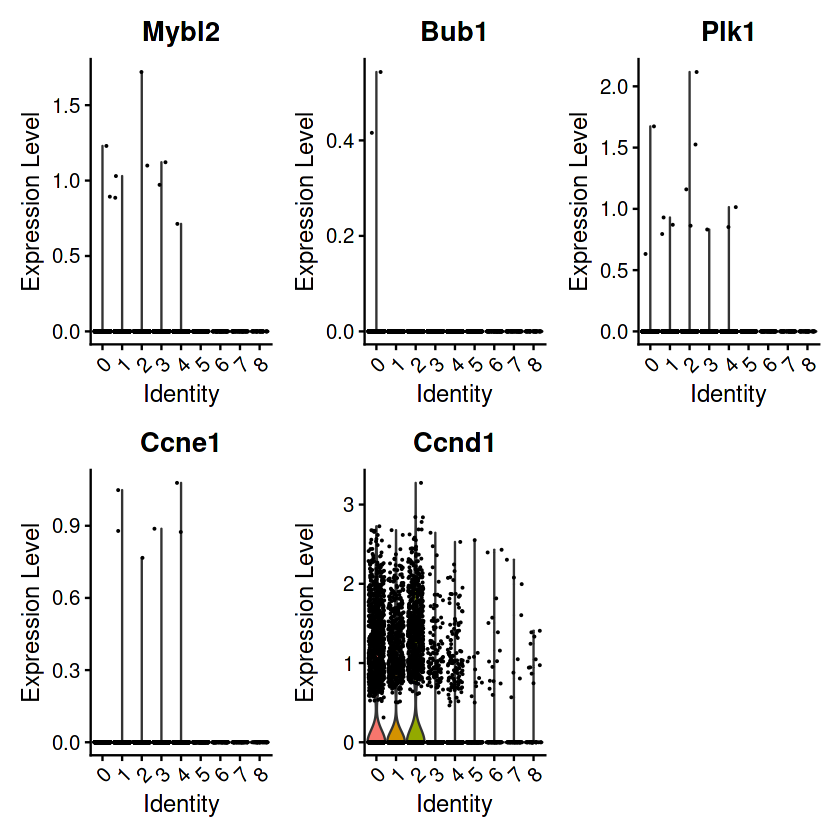

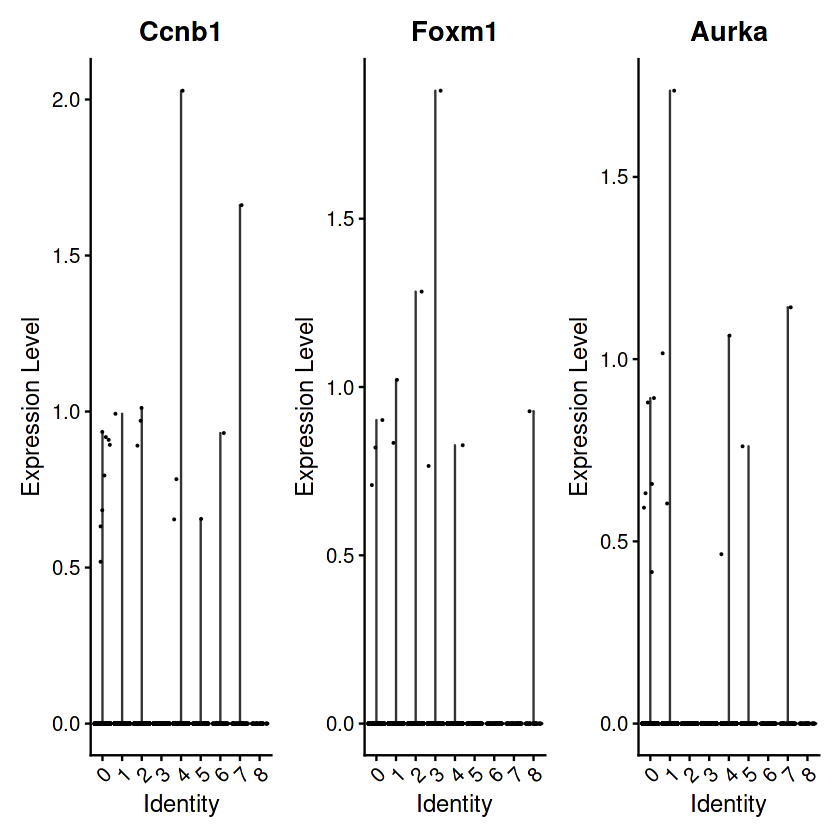

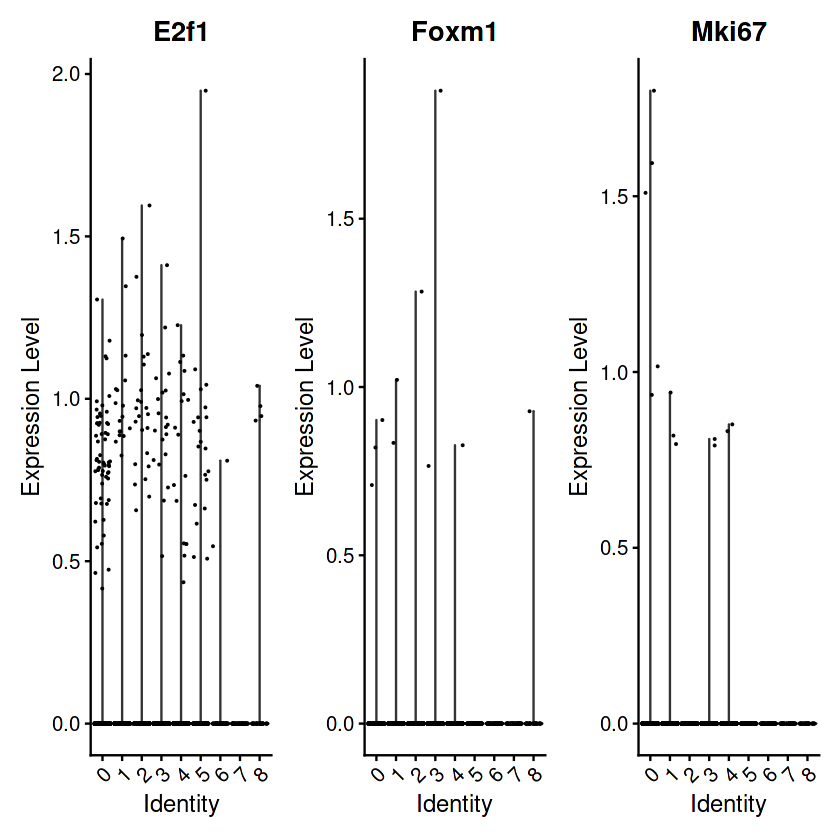

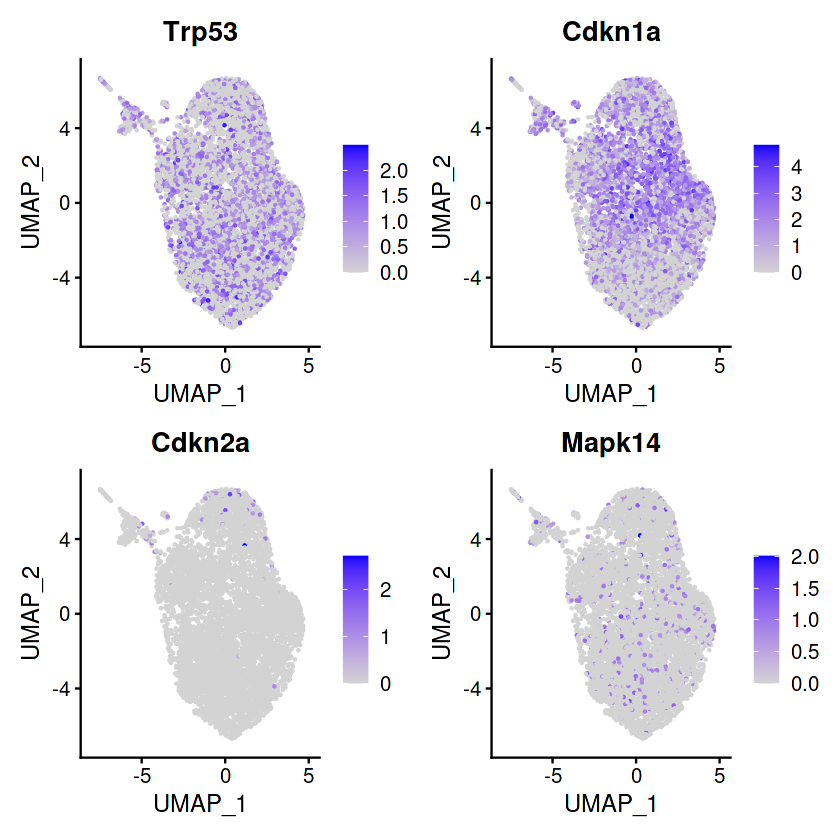

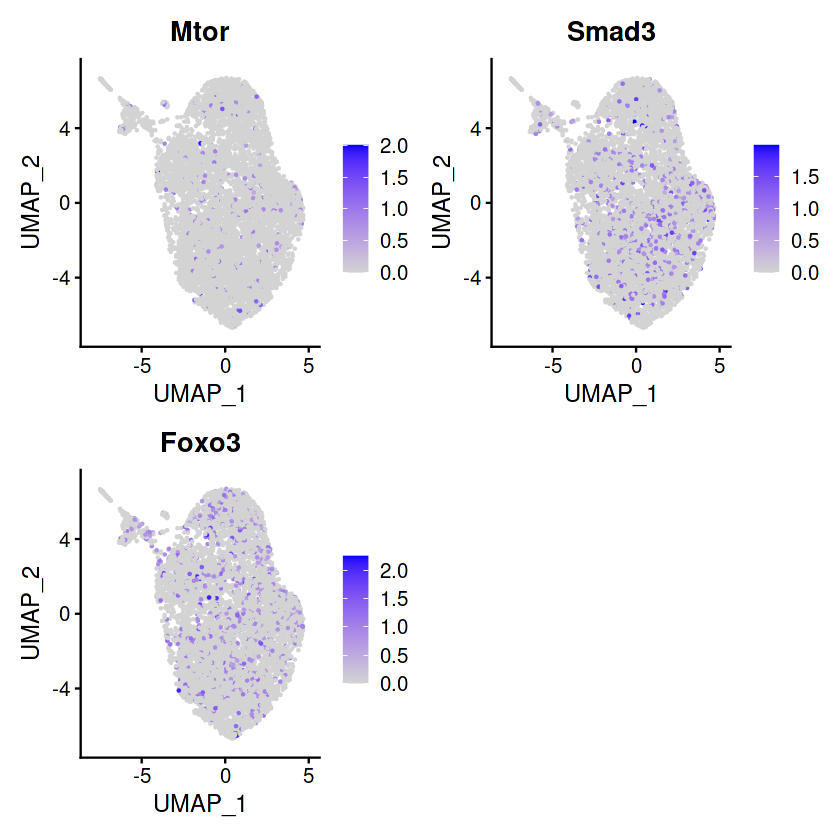

Warning message in FetchData(object = object, vars = c(dims, "ident", features), :
“The following requested variables were not found: Top2A”


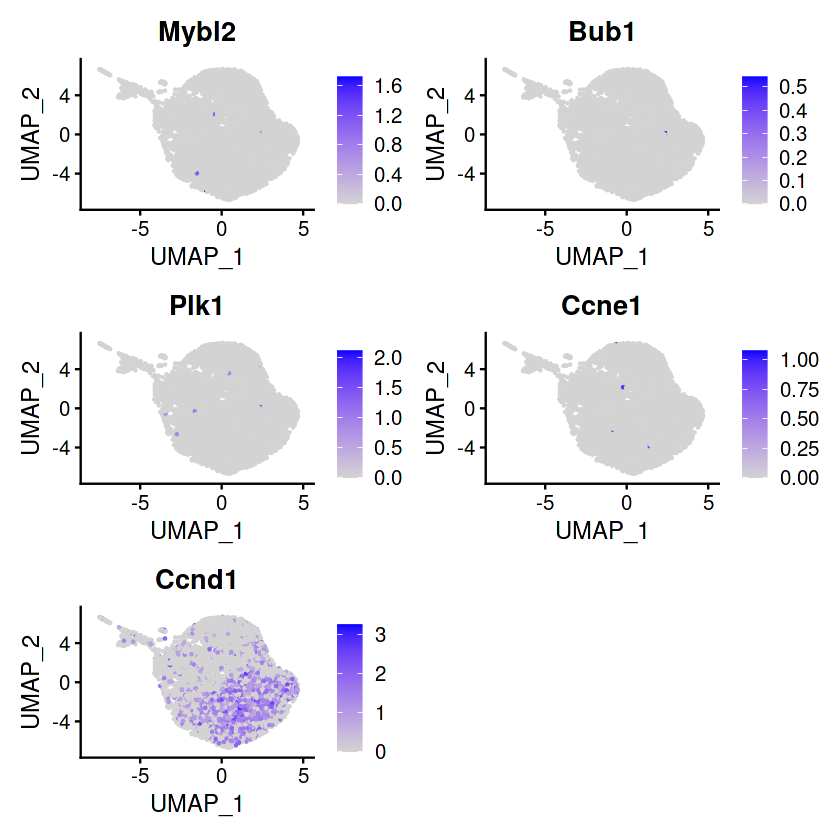

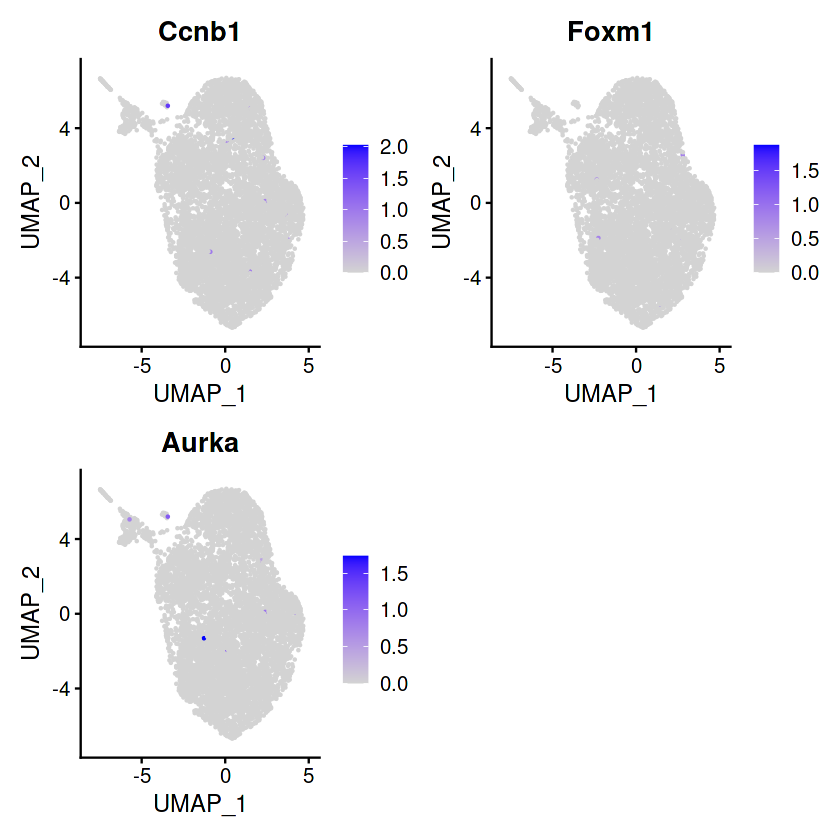

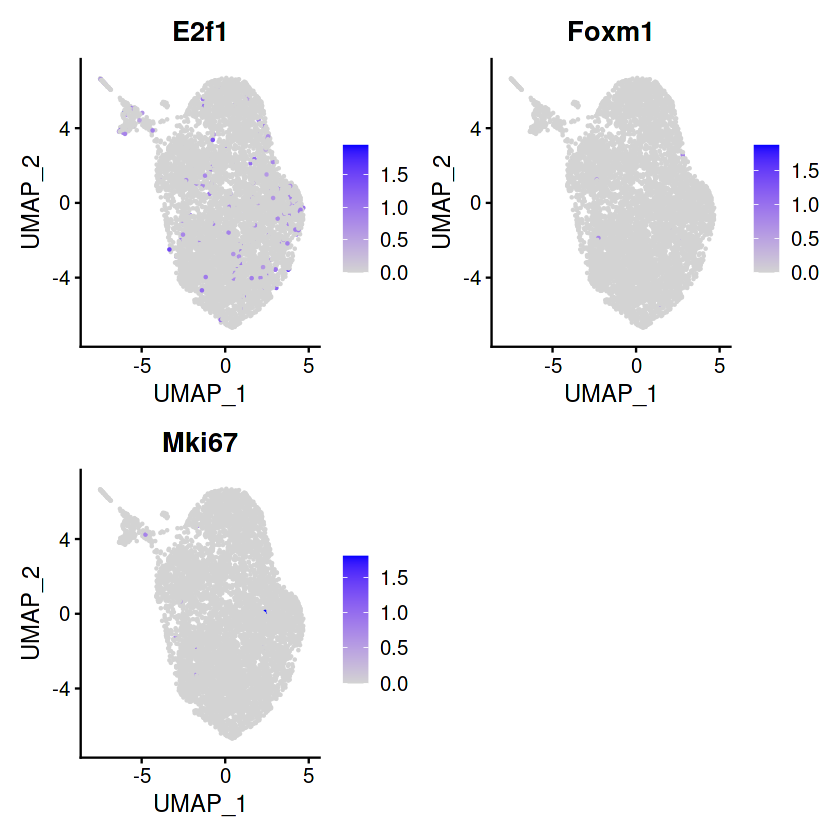

In [25]:
library(dplyr)
library(Seurat)
library(monocle3)
library("stringr")
library("factoextra")
library("Rtsne")

DPI_14 <-Read10X_h5(filename="/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/GSM3847603_30dpi_FilteredGeneBCMatrices.h5")
DPI_14 <- CreateSeuratObject(counts = DPI_14 , project = "DPI14")
DPI_14[["percent.mt"]] <- PercentageFeatureSet(object = DPI_14, pattern = "^MT-")

VlnPlot(object = DPI_14, features = c("nFeature_RNA", "nCount_RNA", "percent.mt"), ncol = 3)
plot1 <- FeatureScatter(object = DPI_14, feature1 = "nCount_RNA", feature2 = "percent.mt") 
plot2 <- FeatureScatter(object =DPI_14, feature1 = "nCount_RNA", feature2 = "nFeature_RNA") 
CombinePlots(plots = list(plot1,plot2))

DPI_14 <- NormalizeData(object = DPI_14, normalization.method = "LogNormalize", scale.factor = 1e4)

DPI_14 <- FindVariableFeatures(object = DPI_14,selection.method = 'vst', nfeatures = 2000)
top10 <- head(x = VariableFeatures(object = DPI_14), 10)
plot1 <- VariableFeaturePlot(object = DPI_14)
plot2 <- LabelPoints(plot = plot1, points = top10, repel = TRUE)

CombinePlots(plots = list(plot1, plot2))
all.genes <- rownames(x = DPI_14)
DPI_14 <- ScaleData(object = DPI_14, features = all.genes)
DPI_14 <- ScaleData(object = DPI_14)
DPI_14 <- ScaleData(object = DPI_14, vars.to.regress = 'percent.mt')

DPI_14 <- RunPCA(object = DPI_14, features = VariableFeatures(object = DPI_14))
print(x = DPI_14[['pca']], dims = 1:5, nfeatures = 5)
VizDimLoadings(object = DPI_14, dims = 1:2, reduction = 'pca')
DimPlot(object = DPI_14, reduction = 'pca')
DimHeatmap(object = DPI_14, dims = 1, cells = 500, balanced = TRUE)

DimHeatmap(object = DPI_14, dims = 1:15, cells = 500, balanced = TRUE)

DPI_14 <- FindNeighbors(object = DPI_14, dims = 1:10)
DPI_14 <- FindClusters(object = DPI_14, resolution = 0.5)
head(x = Idents(object = DPI_14), 5)

DPI_14 <- RunUMAP(object = DPI_14, dims = 1:10)

DimPlot(object = DPI_14, reduction = 'umap')

pbmc.markers <- FindAllMarkers(object = DPI_14, only.pos = TRUE, min.pct = 0.25,logfc.threshold = 0.17)
pbmc.markers %>% group_by(cluster) %>% top_n(n = 2, wt = avg_log2FC)
write.csv(pbmc.markers, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/DPI30markers.csv")

pbmc.markers %>% group_by(cluster) %>% top_n(n = 10, wt = avg_log2FC) -> top10
DoHeatmap(object = DPI_14, features = top10$gene) + NoLegend()

VlnPlot(object = DPI_14, features = c("Trp53","Cdkn1a","Cdkn2a","Mapk14"))
VlnPlot(object = DPI_14, features = c("Mtor","Smad3","Foxo3"))

VlnPlot(object = DPI_14, features = c("Mybl2", "Bub1","Plk1","Ccne1", "Ccnd1"))
VlnPlot(object = DPI_14, features = c("Ccnb1","Foxm1","Top2A","Aurka"))
VlnPlot(object = DPI_14, features = c("E2f1","Foxm1","Mki67"))

FeaturePlot(DPI_14, features = c("Trp53","Cdkn1a","Cdkn2a","Mapk14"))
FeaturePlot(DPI_14, features = c("Mtor","Smad3","Foxo3"))

FeaturePlot(DPI_14, features = c("Mybl2", "Bub1","Plk1","Ccne1", "Ccnd1"))
FeaturePlot(DPI_14, features = c("Ccnb1","Foxm1","Top2A","Aurka"))
FeaturePlot(DPI_14, features = c("E2f1","Foxm1","Mki67"))


In [26]:
library(monocle3)

In [27]:
data <- as(as.matrix(DPI_14@assays$RNA@data), 'sparseMatrix')
pd <- data.frame(DPI_14@meta.data)
pData <- pd %>% select(orig.ident, nCount_RNA, nFeature_RNA)
fData <- data.frame(gene_short_name = row.names(data), row.names = row.names(data))
monocle.object <- new_cell_data_set(expression_data = data, cell_metadata = pData, gene_metadata = fData)
head(pData)

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
AAACCTGAGATGTCGG-1,DPI14,5839,2070
AAACCTGAGCTCTCGG-1,DPI14,6320,1982
AAACCTGAGTGTACGG-1,DPI14,8947,2959
AAACCTGAGTTGAGAT-1,DPI14,5933,2157
AAACCTGCAAAGTCAA-1,DPI14,5474,2053
AAACCTGCAAATACAG-1,DPI14,7386,2177


No preprocess_method specified, using preprocess_method = 'PCA'

No trajectory to plot. Has learn_graph() been called yet?

cluster not found in colData(cds), cells will not be colored

cluster_cells() has not been called yet, can't color cells by cluster

No trajectory to plot. Has learn_graph() been called yet?



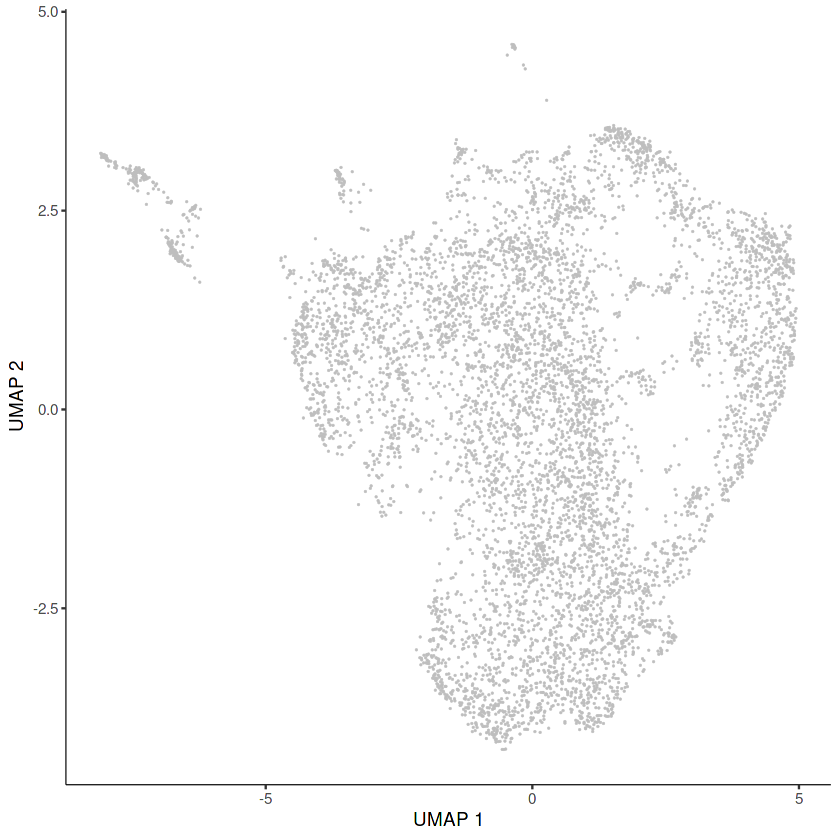

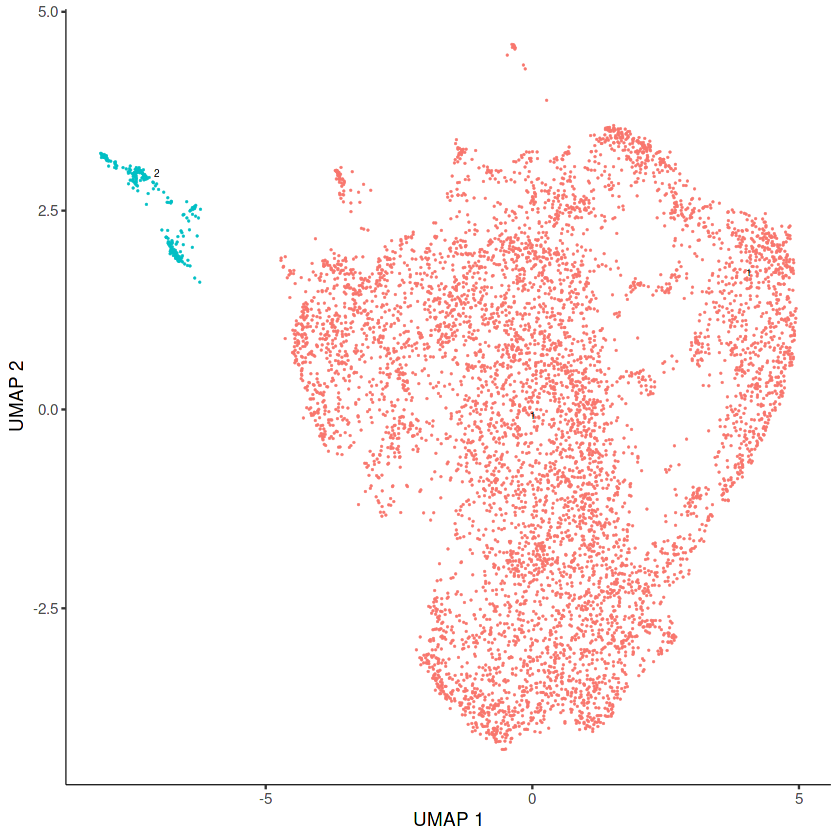

In [28]:
monocle.object = preprocess_cds(monocle.object, num_dim = 100, norm_method = "size_only", pseudo_count = 0)
monocle.object = reduce_dimension(monocle.object)
plot_cells(monocle.object)
monocle.object <- cluster_cells(monocle.object)
plot_cells(monocle.object, color_cells_by = "partition")

No trajectory to plot. Has learn_graph() been called yet?

No preprocess_method specified, using preprocess_method = 'PCA'



  |======================================================================| 100%
  |======================================================================| 100%


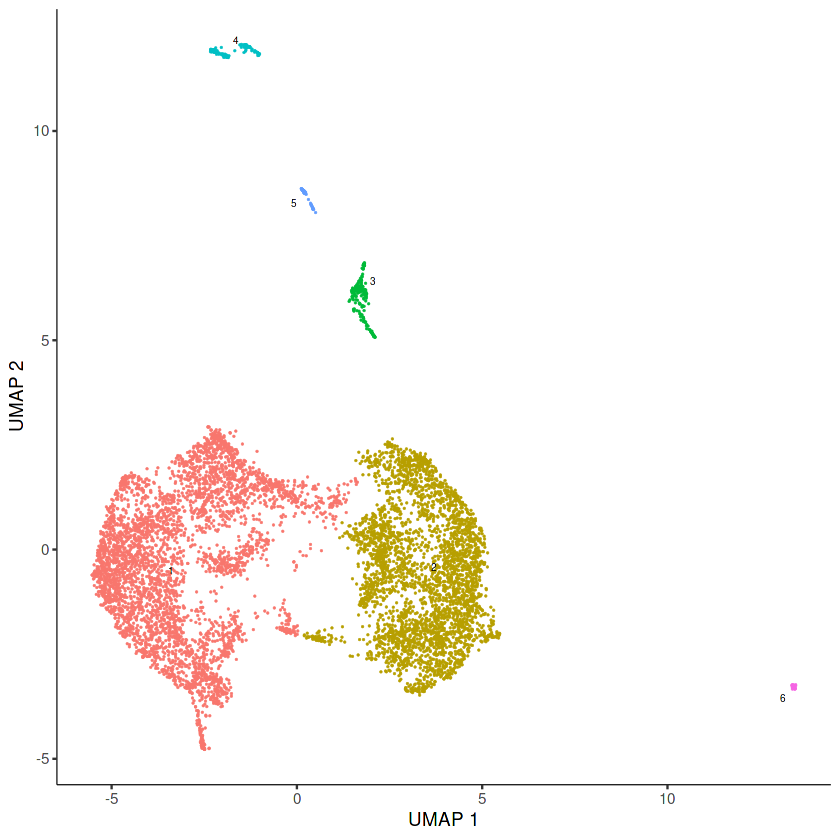

In [7]:
cds = cluster_cells(monocle.object, resolution=1e-5)
plot_cells(cds)
monocle.object <- reduce_dimension(cds, reduction_method = 'UMAP')
monocle.object <- cluster_cells(monocle.object, reduction_method = 'UMAP')
monocle.object <- learn_graph(monocle.object)

Warning message:
“`select_()` was deprecated in dplyr 0.7.0.
Please use `select()` instead.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was generated.”


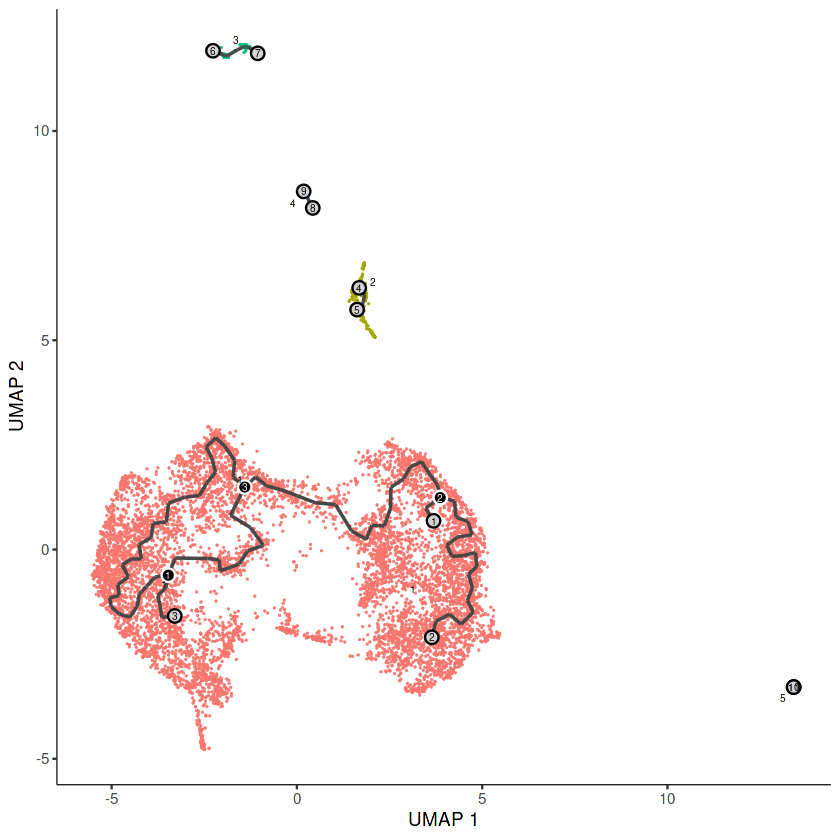

In [8]:
plot_cells(
  cds = monocle.object,
  color_cells_by = "partition",
  show_trajectory_graph = TRUE
)

In [9]:
cds <- cluster_cells(cds, num_clusters = 15)

No trajectory to plot. Has learn_graph() been called yet?



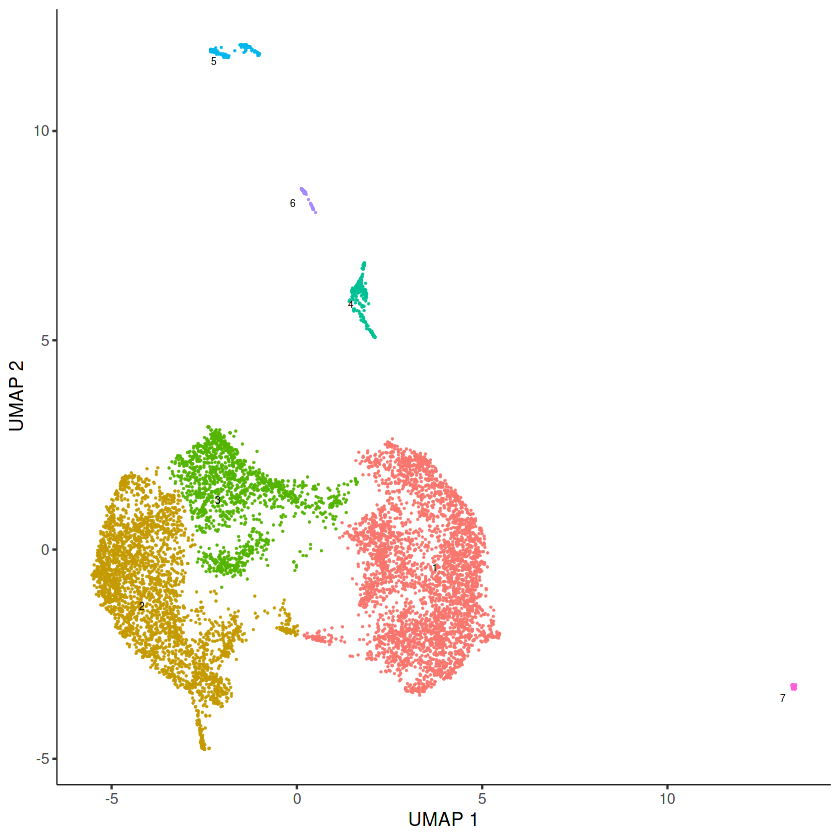

In [10]:
my_cluster_dim_5 <- pData(cds)$Cluster
plot_cells(cds)

In [11]:
monocle.object <- learn_graph(cds)

  |======================================================================| 100%
  |======================================================================| 100%


No trajectory to plot. Has learn_graph() been called yet?



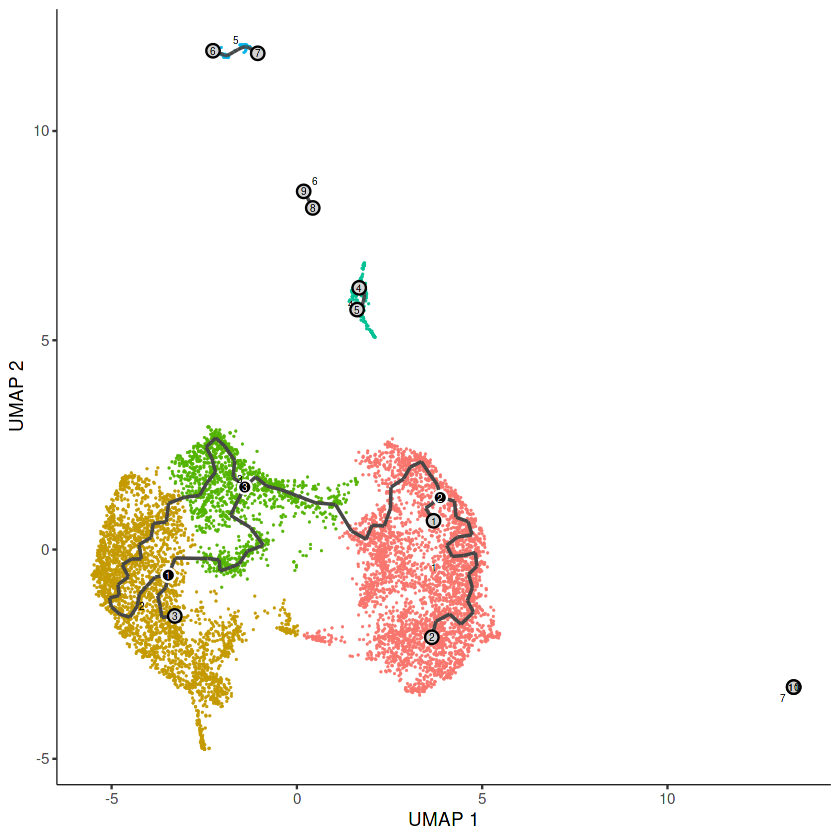

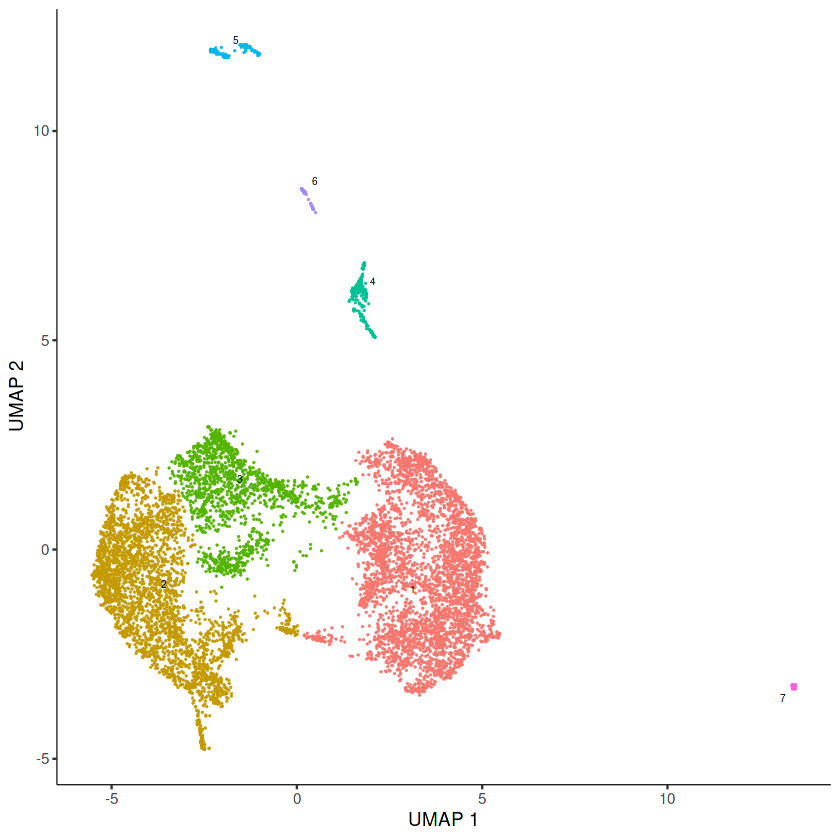

In [12]:
plot_cells(
  cds = monocle.object,
  color_cells_by = "cluster",
  show_trajectory_graph = TRUE
)

plot_cells(cds,
           color_cells_by = "cluster",
           label_groups_by_cluster=TRUE,
           label_leaves=TRUE,
           label_branch_points=TRUE)

In [13]:
ciliated_cds_pr_test_res <- graph_test(cds, neighbor_graph="knn", cores=4)
pr_deg_ids <- row.names(subset(ciliated_cds_pr_test_res, q_value < 0.05))

  |=======================================================| 100%, Elapsed 09:40


In [14]:
head(ciliated_cds_pr_test_res)

,status,p_value,morans_test_statistic,morans_I,gene_short_name,q_value
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
Xkr4,OK,0.650724,-0.3872757,-0.0012389108,Xkr4,0.7200636
Gm1992,FAIL,NA,NA,NA,Gm1992,1.0000000
Gm37381,OK,0.546711,-0.1173560,-0.0003999197,Gm37381,0.6741293
Rp1,FAIL,NA,NA,NA,Rp1,1.0000000
Rp1.1,FAIL,NA,NA,NA,Rp1.1,1.0000000
Sox17,FAIL,NA,NA,NA,Sox17,1.0000000


In [15]:
write.csv(ciliated_cds_pr_test_res, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/clusterall_heartmarkersMonocoleDPI14.csv")

In [16]:
gene_module_df <- find_gene_modules(cds[pr_deg_ids,], resolution=1e-2)

In [17]:
write.csv(gene_module_df, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/clusterall_heartmarkersMonocoleDPI14b.csv")

In [ ]:
cell_group_df <- tibble::tibble(cell=row.names(colData(cds)), 
                                cell_group=partitions(cds)[colnames(cds)])
agg_mat <- aggregate_gene_expression(cds, gene_module_df, cell_group_df)
row.names(agg_mat) <- stringr::str_c("Module ", row.names(agg_mat))
colnames(agg_mat) <- stringr::str_c("Partition ", colnames(agg_mat))

pheatmap::pheatmap(agg_mat, cluster_rows=TRUE, cluster_cols=TRUE,
                   scale="column", clustering_method="ward.D2",
                   fontsize=6)

In [ ]:
plot_cells(cds, 
           genes=gene_module_df %>% filter(module %in% c(8, 28, 33, 37)),
           group_cells_by="partition",
           color_cells_by="partition",
           show_trajectory_graph=FALSE)

In [ ]:
###################take separate for monocole

In [1]:
library(monocle3)
library(dplyr)
library(Seurat)
library(monocle3)
library("stringr")
library("factoextra")
library("Rtsne")

Loading required package: Biobase

Loading required package: BiocGenerics

Loading required package: parallel


Attaching package: ‘BiocGenerics’


The following objects are masked from ‘package:parallel’:

    clusterApply, clusterApplyLB, clusterCall, clusterEvalQ,
    clusterExport, clusterMap, parApply, parCapply, parLapply,
    parLapplyLB, parRapply, parSapply, parSapplyLB


The following objects are masked from ‘package:stats’:

    IQR, mad, sd, var, xtabs


The following objects are masked from ‘package:base’:

    anyDuplicated, append, as.data.frame, basename, cbind, colnames,
    dirname, do.call, duplicated, eval, evalq, Filter, Find, get, grep,
    grepl, intersect, is.unsorted, lapply, Map, mapply, match, mget,
    order, paste, pmax, pmax.int, pmin, pmin.int, Position, rank,
    rbind, Reduce, rownames, sapply, setdiff, sort, table, tapply,
    union, unique, unsplit, which.max, which.min


Welcome to Bioconductor

    Vignettes contain introductory material; view with


In [4]:
DPI_14 <-Read10X_h5(filename="/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/GSM3847603_30dpi_FilteredGeneBCMatrices.h5")
DPI14 <- CreateSeuratObject(counts = DPI_14 , project = "Dpi14")

Warning message in sparseMatrix(i = indices[] + 1, p = indptr[], x = as.numeric(x = counts[]), :
“'giveCsparse' has been deprecated; setting 'repr = "T"' for you”


In [6]:
data <- as(as.matrix(DPI14@assays$RNA@data), 'sparseMatrix')
pd <- data.frame(DPI14@meta.data)
pData <- pd %>% select(orig.ident, nCount_RNA, nFeature_RNA)
fData <- data.frame(gene_short_name = row.names(data), row.names = row.names(data))
monocle.object <- new_cell_data_set(expression_data = data, cell_metadata = pData, gene_metadata = fData)
head(pData)

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
AAACCTGAGATGTCGG-1,Dpi14,5839,2070
AAACCTGAGCTCTCGG-1,Dpi14,6320,1982
AAACCTGAGTGTACGG-1,Dpi14,8947,2959
AAACCTGAGTTGAGAT-1,Dpi14,5933,2157
AAACCTGCAAAGTCAA-1,Dpi14,5474,2053
AAACCTGCAAATACAG-1,Dpi14,7386,2177


No preprocess_method specified, using preprocess_method = 'PCA'

No trajectory to plot. Has learn_graph() been called yet?

cluster not found in colData(cds), cells will not be colored

cluster_cells() has not been called yet, can't color cells by cluster

No trajectory to plot. Has learn_graph() been called yet?



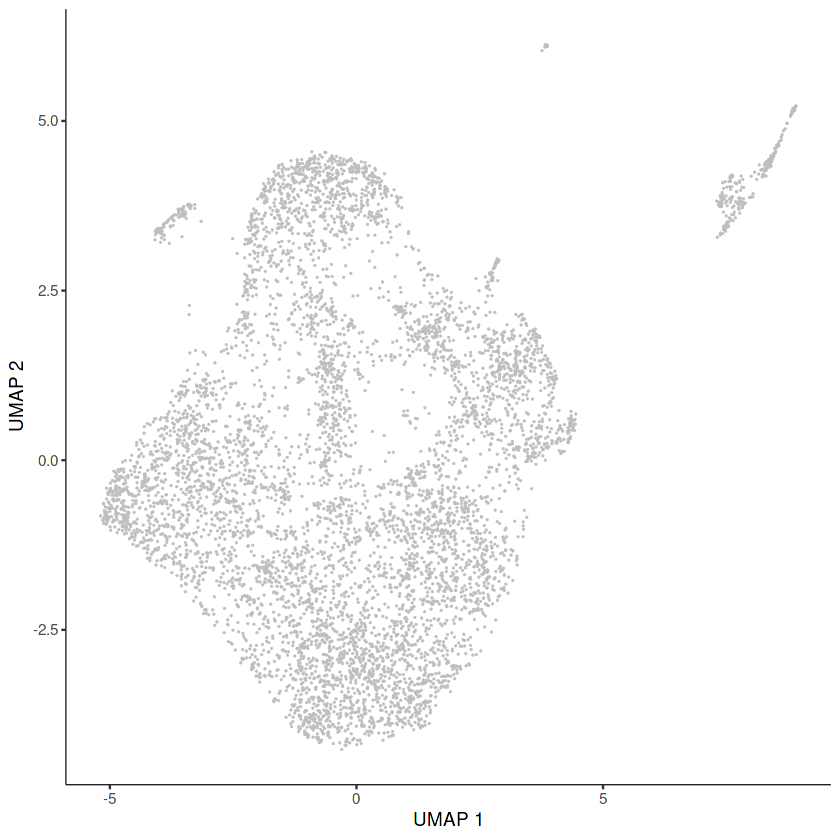

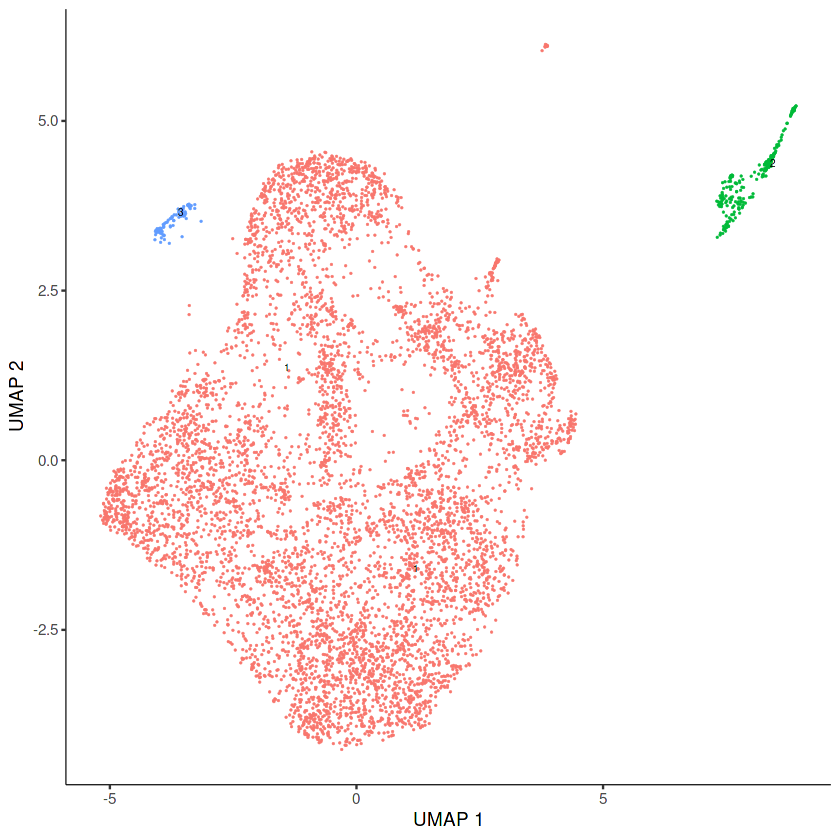

In [7]:
monocle.object = preprocess_cds(monocle.object, num_dim = 50, norm_method = "size_only", pseudo_count = 0)
monocle.object = reduce_dimension(monocle.object)
plot_cells(monocle.object)
monocle.object <- cluster_cells(monocle.object)
plot_cells(monocle.object, color_cells_by = "partition")

No trajectory to plot. Has learn_graph() been called yet?

No preprocess_method specified, using preprocess_method = 'PCA'



  |======================================================================| 100%


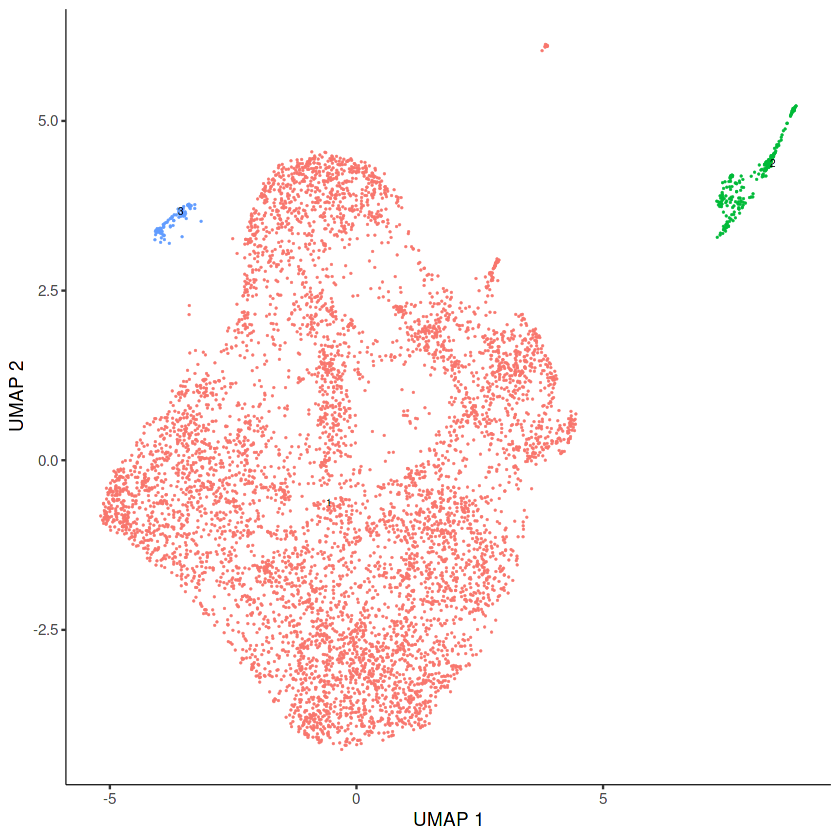

In [8]:
cds = cluster_cells(monocle.object, resolution=1e-5)
plot_cells(cds)
monocle.object <- reduce_dimension(cds, reduction_method = 'UMAP')
monocle.object <- cluster_cells(monocle.object, reduction_method = 'UMAP')
monocle.object <- learn_graph(monocle.object)

Warning message:
“`select_()` was deprecated in dplyr 0.7.0.
Please use `select()` instead.
This warning is displayed once every 8 hours.
Call `lifecycle::last_lifecycle_warnings()` to see where this warning was generated.”


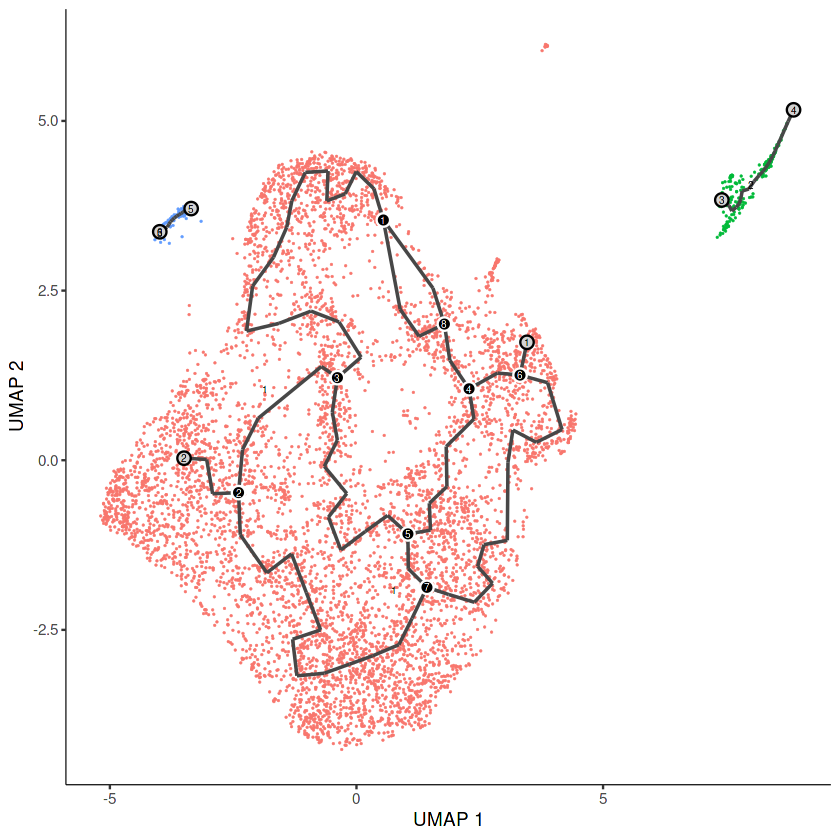

In [9]:
plot_cells(
  cds = monocle.object,
  color_cells_by = "partition",
  show_trajectory_graph = TRUE
)

No trajectory to plot. Has learn_graph() been called yet?



  |======================================================================| 100%


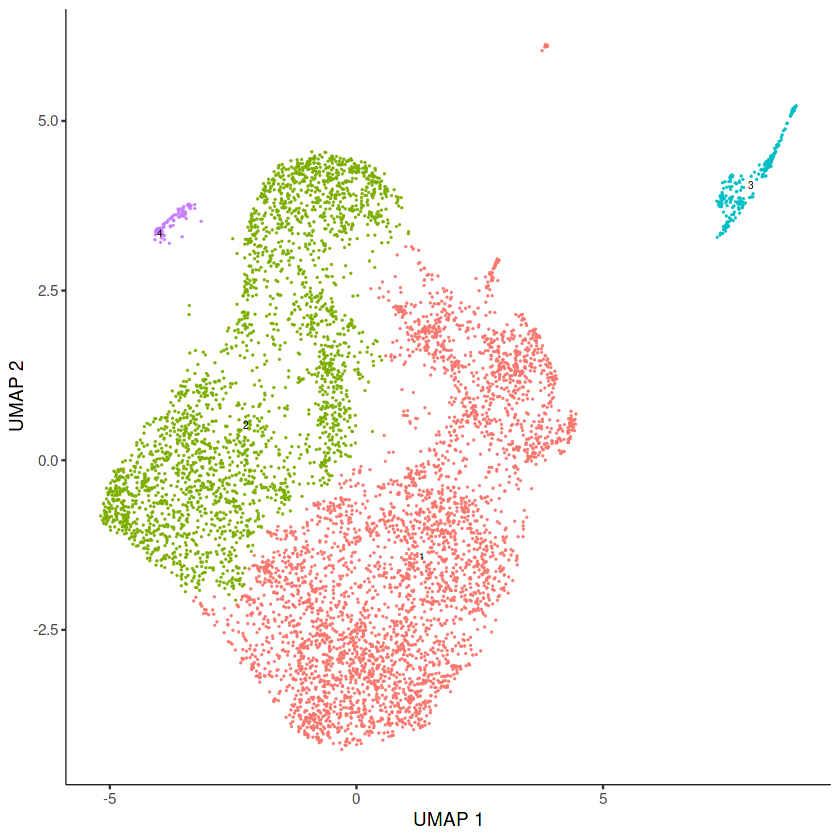

In [10]:
cds <- cluster_cells(cds, num_clusters = 15)

my_cluster_dim_5 <- pData(cds)$Cluster
plot_cells(cds)

monocle.object <- learn_graph(cds)



No trajectory to plot. Has learn_graph() been called yet?



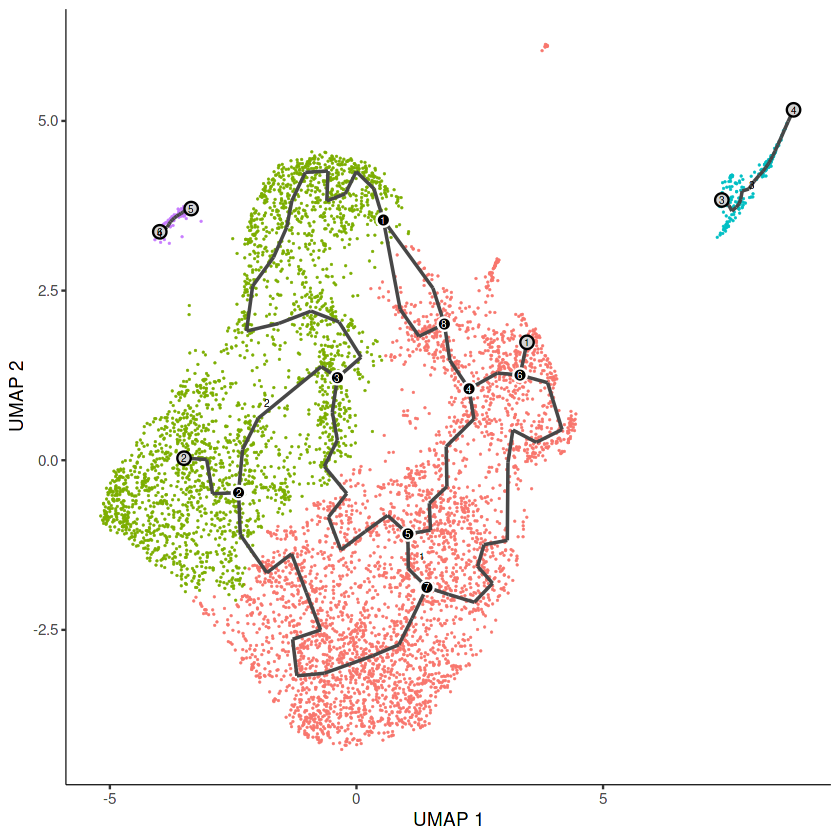

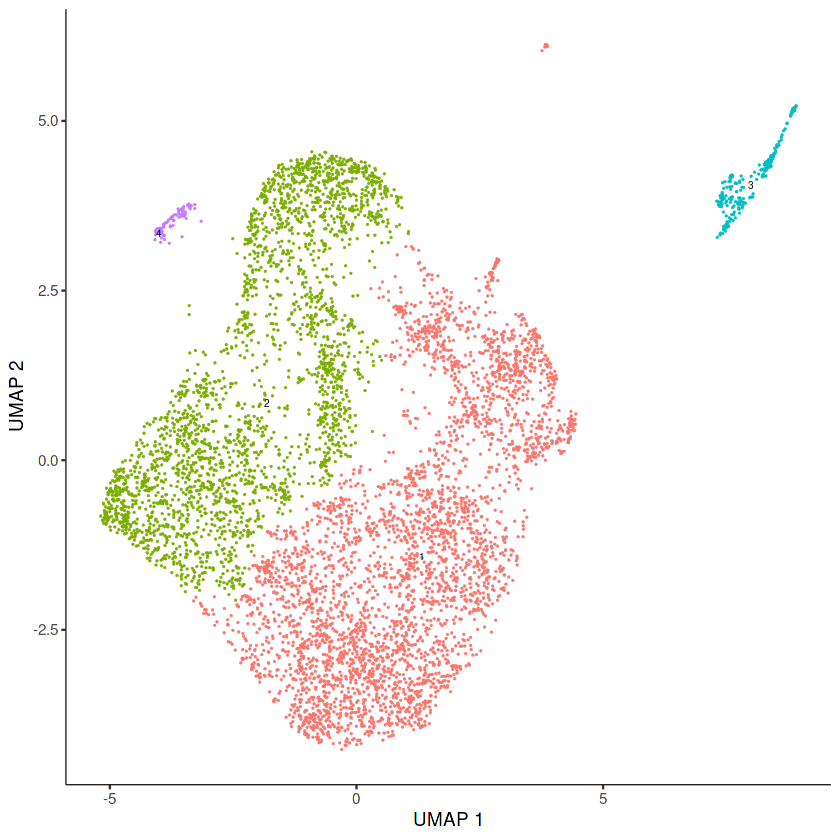

In [11]:
plot_cells(
  cds = monocle.object,
  color_cells_by = "cluster",
  show_trajectory_graph = TRUE
)

plot_cells(cds,
           color_cells_by = "cluster",
           label_groups_by_cluster=TRUE,
           label_leaves=TRUE,
           label_branch_points=TRUE)

In [12]:
ciliated_cds_pr_test_res <- graph_test(cds, neighbor_graph="knn", cores=4)
pr_deg_ids <- row.names(subset(ciliated_cds_pr_test_res, q_value < 0.05))  

head(ciliated_cds_pr_test_res)   

  |=======================================================| 100%, Elapsed 07:17


,status,p_value,morans_test_statistic,morans_I,gene_short_name,q_value
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
Xkr4,OK,0.3753298,0.3177696,0.0008495523,Xkr4,0.5783124
Gm1992,FAIL,NA,NA,NA,Gm1992,1.0000000
Gm37381,OK,0.5635549,-0.1599884,-0.0005995880,Gm37381,0.7026189
Rp1,FAIL,NA,NA,NA,Rp1,1.0000000
Rp1.1,FAIL,NA,NA,NA,Rp1.1,1.0000000
Sox17,FAIL,NA,NA,NA,Sox17,1.0000000


In [13]:
head(ciliated_cds_pr_test_res)   

write.csv(ciliated_cds_pr_test_res, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/clusterall_heartmarkersMonocoleDPI30.csv")


,status,p_value,morans_test_statistic,morans_I,gene_short_name,q_value
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
Xkr4,OK,0.3753298,0.3177696,0.0008495523,Xkr4,0.5783124
Gm1992,FAIL,NA,NA,NA,Gm1992,1.0000000
Gm37381,OK,0.5635549,-0.1599884,-0.0005995880,Gm37381,0.7026189
Rp1,FAIL,NA,NA,NA,Rp1,1.0000000
Rp1.1,FAIL,NA,NA,NA,Rp1.1,1.0000000
Sox17,FAIL,NA,NA,NA,Sox17,1.0000000


In [14]:

gene_module_df <- find_gene_modules(cds[pr_deg_ids,], resolution=1e-2)

write.csv(gene_module_df, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/clusterall_heartmarkersMonocoleDPI30b.csv")



In [15]:
marker_test_res <- top_markers(cds, group_cells_by="cluster", 
                               reference_cells=50, cores=8)

  |=======================================================| 100%, Elapsed 00:03
  |=======================================================| 100%, Elapsed 00:02


In [16]:
head(marker_test_res)

,gene_id,gene_short_name,cell_group,marker_score,mean_expression,fraction_expressing,specificity,pseudo_R2,marker_test_p_value,marker_test_q_value
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Col3a1,Col3a1,3,0.3569521,18.560022,0.9920319,0.3598192,0.06324992,2.376867e-04,1.0000000000
2,Fn1,Fn1,3,0.4286609,5.593904,0.8167331,0.5248482,0.13898573,5.003306e-08,0.0056033019
3,Sp110,Sp110,4,0.3900547,1.213560,0.6395349,0.6099037,0.14395074,4.336056e-06,0.4856036375
4,Sp100,Sp100,4,0.3960198,1.691374,0.7441860,0.5321516,0.24715984,1.703692e-09,0.0001907999
5,Cfh,Cfh,2,0.2944654,6.341609,0.9470721,0.3109218,0.02672057,1.614766e-03,1.0000000000
6,Atp1b1,Atp1b1,3,0.3941373,1.168472,0.4980080,0.7914277,0.17348188,1.115916e-09,0.0001249737


In [17]:
write.csv(marker_test_res, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/markersMonocoleDPI30.csv")


In [18]:
top_specific_markers <- marker_test_res %>%
                            filter(fraction_expressing >= 0.10) %>%
                            group_by(cell_group) %>%
                            top_n(6, pseudo_R2)

top_specific_marker_ids <- unique(top_specific_markers %>% pull(gene_id))

In [19]:
head(top_specific_markers)

gene_id,gene_short_name,cell_group,marker_score,mean_expression,fraction_expressing,specificity,pseudo_R2,marker_test_p_value,marker_test_q_value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
G0s2,G0s2,1,0.3713751,4.464444,0.8449001,0.4395491,0.06232879,6.627054e-07,7.421771e-02
Cd34,Cd34,2,0.3126854,6.212673,0.9226727,0.3388909,0.04351645,5.699127e-05,1.000000e+00
Gsn,Gsn,1,0.3486021,216.590546,1.0000000,0.3486021,0.12622982,1.418199e-12,1.588270e-07
Wt1,Wt1,3,0.5956783,1.385884,0.6414343,0.9286662,0.30781992,4.536501e-16,5.080518e-11
Adam33,Adam33,3,0.4811050,1.056381,0.5378486,0.8944990,0.23508847,1.293754e-12,1.448901e-07
Nkain4,Nkain4,3,0.5654798,3.798450,0.6095618,0.9276826,0.22536709,3.752633e-12,4.202649e-07


Warning message in if (axis_order == "marker_group") {:
“the condition has length > 1 and only the first element will be used”


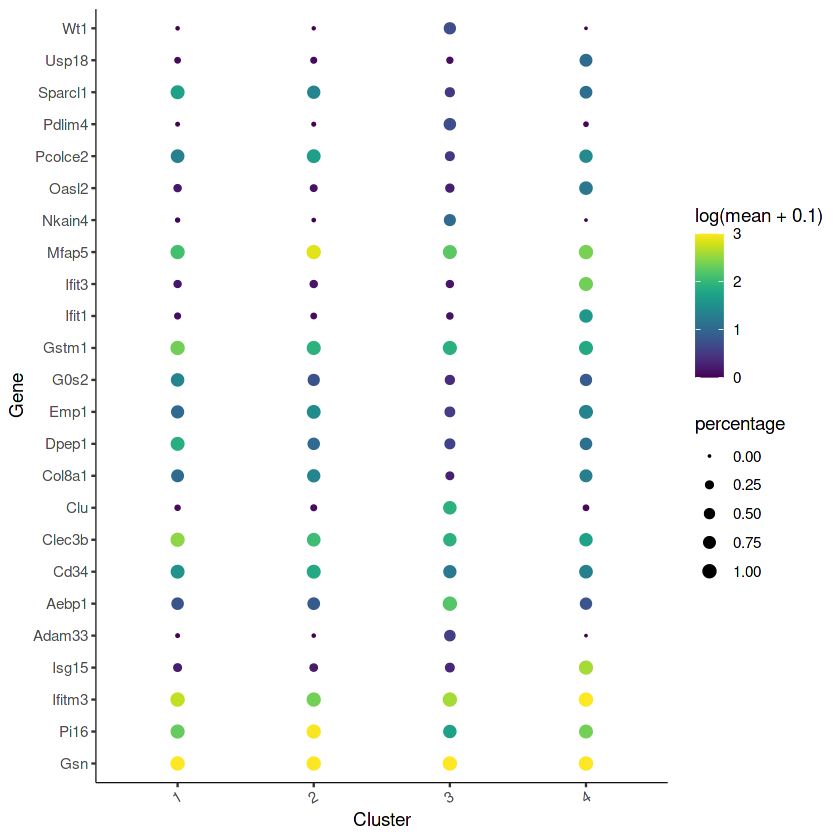

In [20]:
plot_genes_by_group(cds,
                    top_specific_marker_ids,
                    group_cells_by="cluster",
                    ordering_type="maximal_on_diag",
                    max.size=3)

No preprocess_method specified, using preprocess_method = 'PCA'



  |======================================================================| 100%


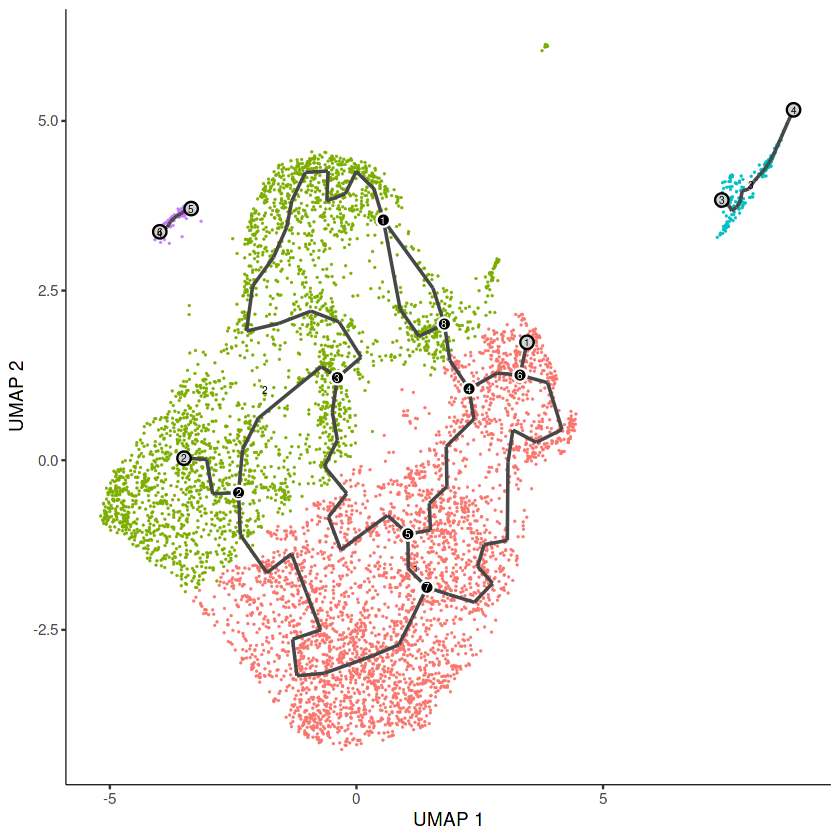

In [21]:
cds_subset = reduce_dimension(cds, max_components = 2)
cds_subset = cluster_cells(cds_subset)
cds_subset = learn_graph(cds_subset)
plot_cells(cds_subset, 
           color_cells_by = "cluster")

Cells aren't colored in a way that allows them to be grouped.



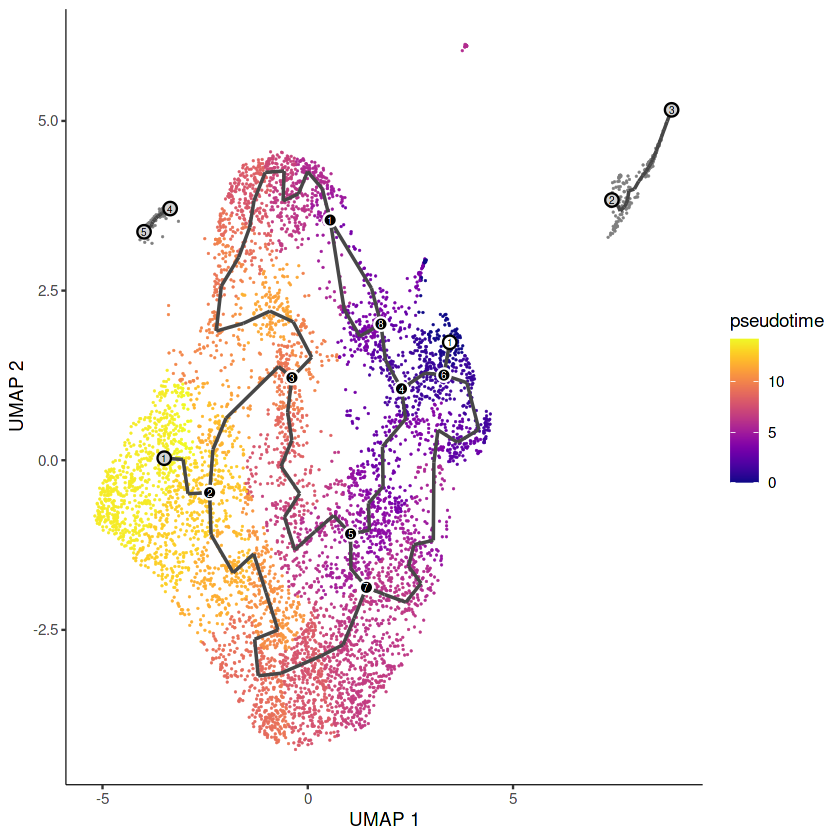

In [22]:
cds_subset = order_cells(cds_subset,root_pr_nodes = "Y_1")
plot_cells(cds_subset, 
           color_cells_by = "pseudotime")

In [28]:
Healthy <-Read10X_h5(filename="/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/GSM3847600_HealthyMyocardium_FilteredGeneBCMatrices.h5")
Healthy <- CreateSeuratObject(counts = Healthy , project = "Healthy")

Warning message in sparseMatrix(i = indices[] + 1, p = indptr[], x = as.numeric(x = counts[]), :
“'giveCsparse' has been deprecated; setting 'repr = "T"' for you”


In [29]:
data <- as(as.matrix(Healthy@assays$RNA@data), 'sparseMatrix')
pd <- data.frame(Healthy@meta.data)
pData <- pd %>% select(orig.ident, nCount_RNA, nFeature_RNA)
fData <- data.frame(gene_short_name = row.names(data), row.names = row.names(data))
monocle.object <- new_cell_data_set(expression_data = data, cell_metadata = pData, gene_metadata = fData)
head(pData)

,orig.ident,nCount_RNA,nFeature_RNA
,<fct>,<dbl>,<int>
AAACCTGAGAGGTAGA-1,Healthy,2985,1155
AAACCTGAGATCCTGT-1,Healthy,2836,1329
AAACCTGCAAACGCGA-1,Healthy,5260,1955
AAACCTGCAAGAAAGG-1,Healthy,2106,1030
AAACCTGCAGCTGCAC-1,Healthy,5952,1935
AAACCTGCAGGAACGT-1,Healthy,7282,2345


No preprocess_method specified, using preprocess_method = 'PCA'

No trajectory to plot. Has learn_graph() been called yet?

cluster not found in colData(cds), cells will not be colored

cluster_cells() has not been called yet, can't color cells by cluster

No trajectory to plot. Has learn_graph() been called yet?



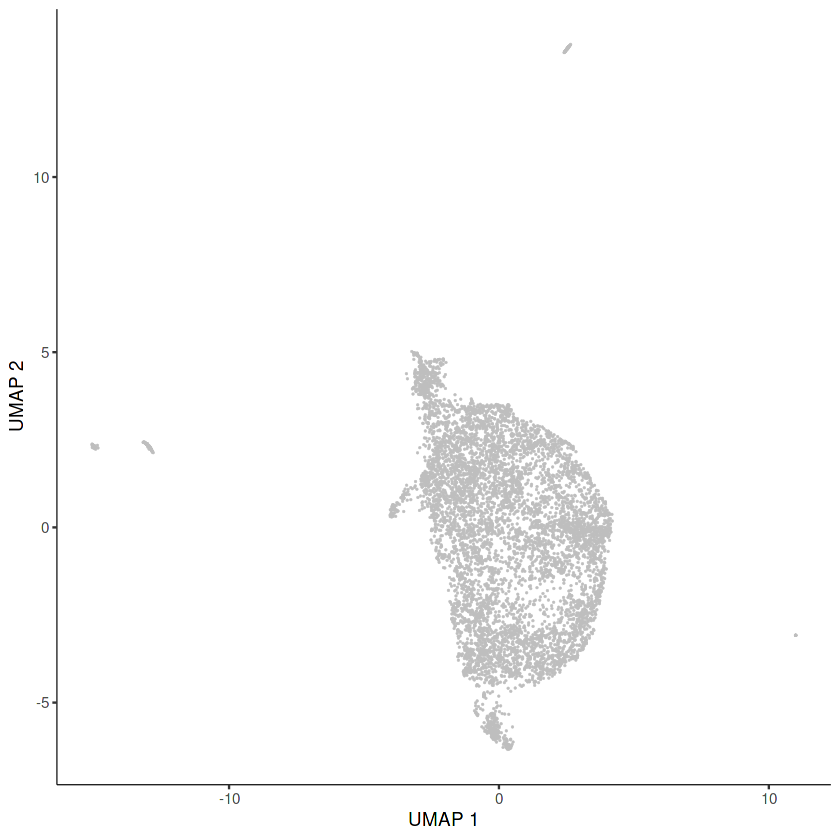

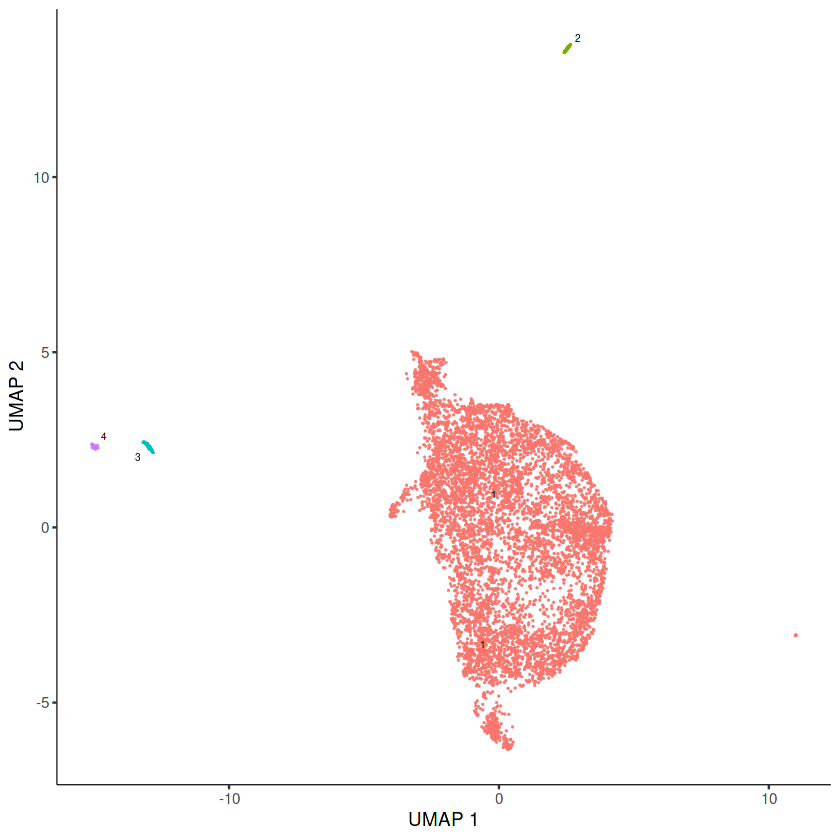

In [32]:
monocle.object = preprocess_cds(monocle.object, num_dim = 50, norm_method = "size_only", pseudo_count = 0)
monocle.object = reduce_dimension(monocle.object)
plot_cells(monocle.object)
monocle.object <- cluster_cells(monocle.object)
plot_cells(monocle.object, color_cells_by = "partition")

No trajectory to plot. Has learn_graph() been called yet?

No preprocess_method specified, using preprocess_method = 'PCA'



  |======================================================================| 100%


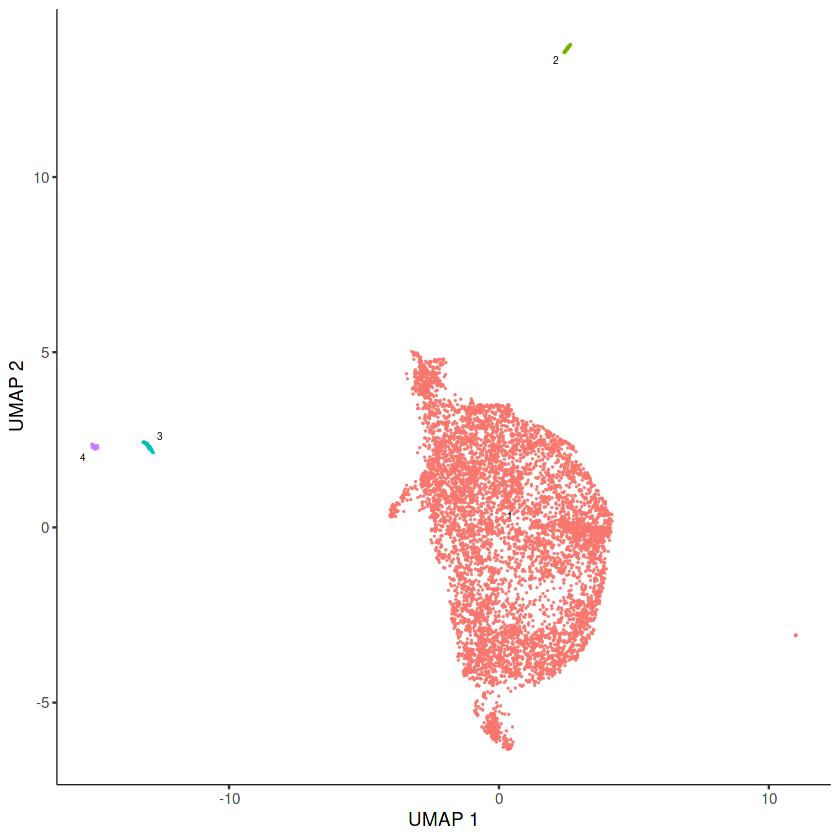

In [33]:
cds = cluster_cells(monocle.object, resolution=1e-5)
plot_cells(cds)
monocle.object <- reduce_dimension(cds, reduction_method = 'UMAP')
monocle.object <- cluster_cells(monocle.object, reduction_method = 'UMAP')
monocle.object <- learn_graph(monocle.object)

No trajectory to plot. Has learn_graph() been called yet?



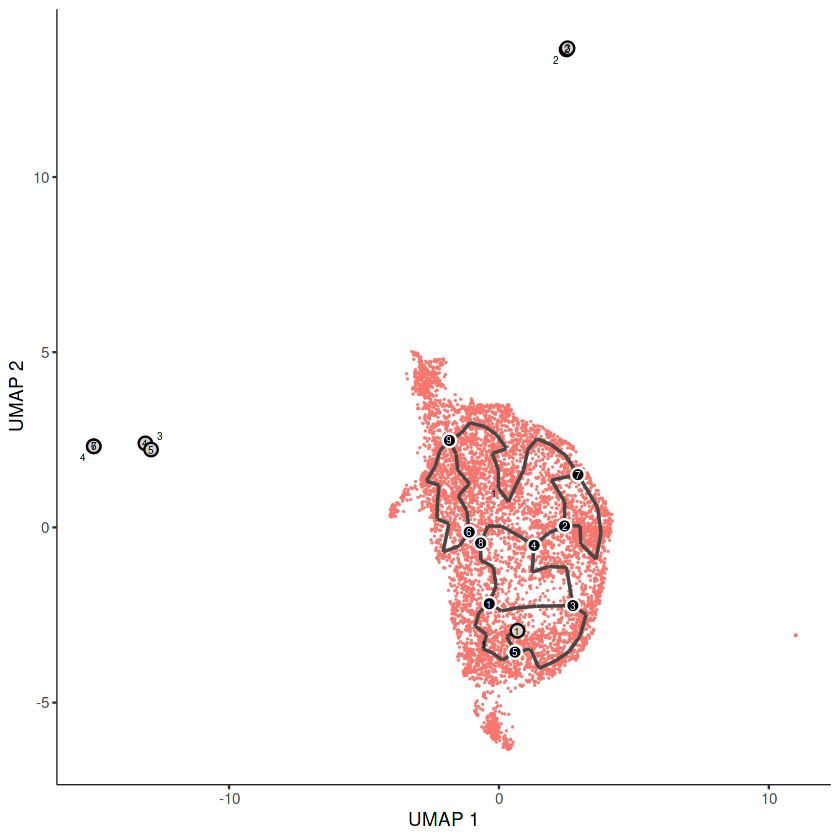

  |======================================================================| 100%


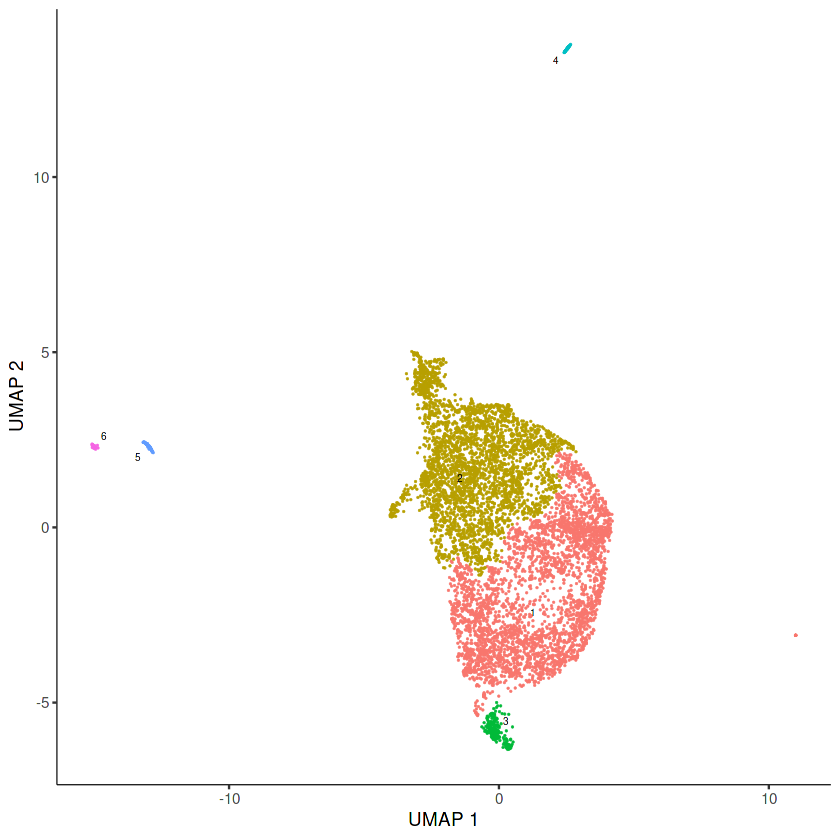

In [34]:
plot_cells(
  cds = monocle.object,
  color_cells_by = "partition",
  show_trajectory_graph = TRUE
)

cds <- cluster_cells(cds, num_clusters = 15)

my_cluster_dim_5 <- pData(cds)$Cluster
plot_cells(cds)

monocle.object <- learn_graph(cds)

No trajectory to plot. Has learn_graph() been called yet?



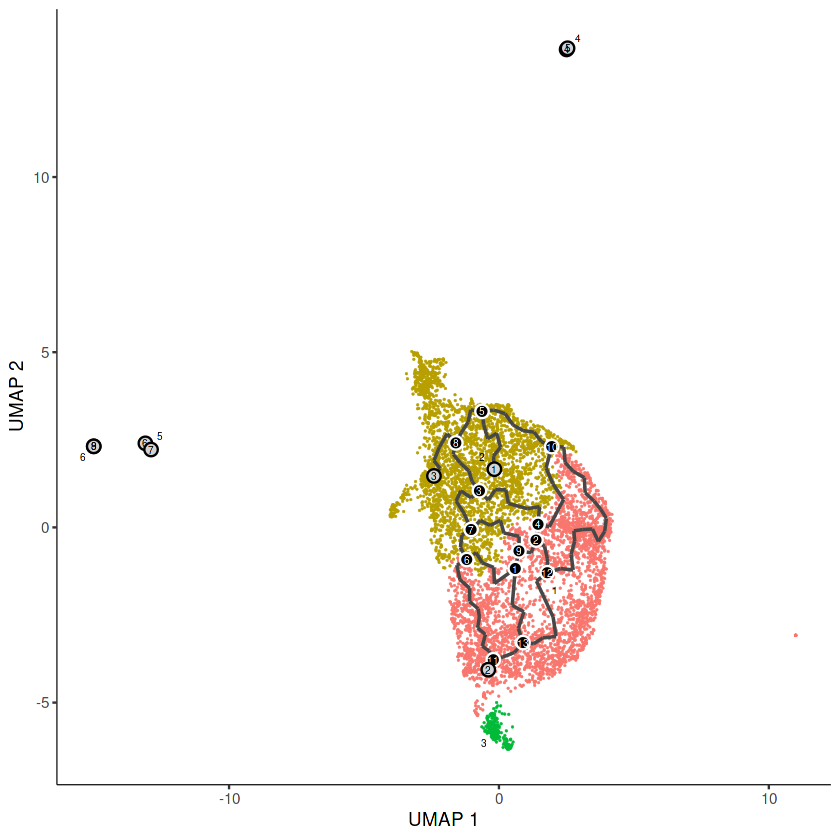

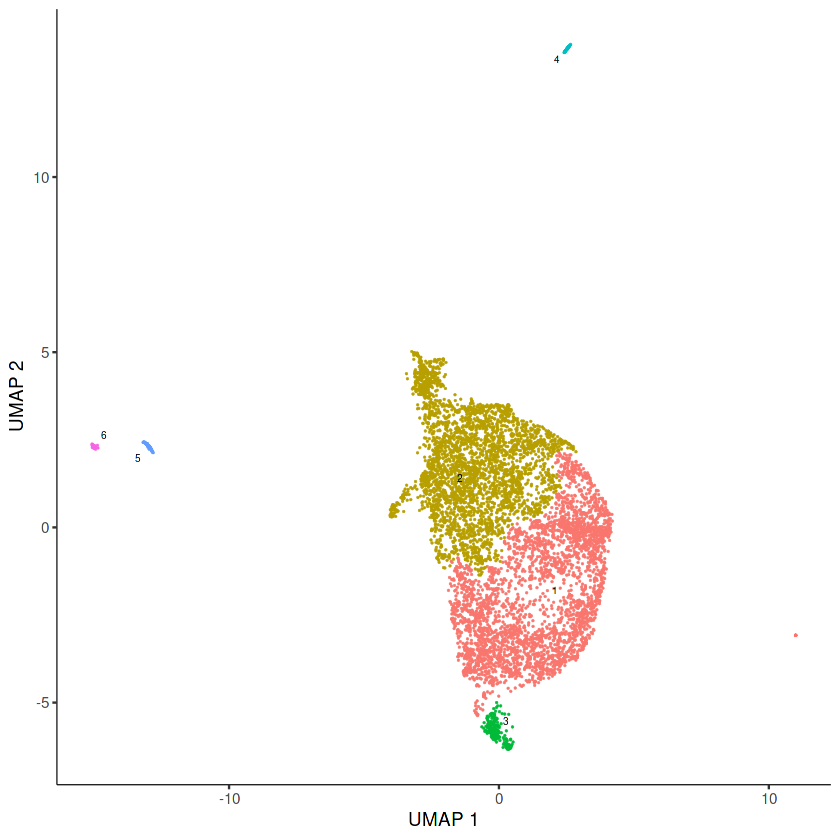

In [35]:
plot_cells(
  cds = monocle.object,
  color_cells_by = "cluster",
  show_trajectory_graph = TRUE
)

plot_cells(cds,
           color_cells_by = "cluster",
           label_groups_by_cluster=TRUE,
           label_leaves=TRUE,
           label_branch_points=TRUE)

In [36]:
ciliated_cds_pr_test_res <- graph_test(cds, neighbor_graph="knn", cores=4)
pr_deg_ids <- row.names(subset(ciliated_cds_pr_test_res, q_value < 0.05))  
head(ciliated_cds_pr_test_res)   

  |=======================================================| 100%, Elapsed 06:42


,status,p_value,morans_test_statistic,morans_I,gene_short_name,q_value
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
Xkr4,OK,7.949245e-01,-0.82362784,-0.0027193476,Xkr4,8.386485e-01
Gm1992,OK,2.350302e-68,17.43219556,0.0390223769,Gm1992,3.086982e-67
Gm37381,OK,5.316774e-01,-0.07948719,-0.0003227261,Gm37381,7.094881e-01
Rp1,OK,2.808548e-02,1.90970690,-0.0000791184,Rp1,6.992593e-02
Rp1.1,FAIL,NA,NA,NA,Rp1.1,1.000000e+00
Sox17,FAIL,NA,NA,NA,Sox17,1.000000e+00


In [37]:
head(ciliated_cds_pr_test_res)   
write.csv(ciliated_cds_pr_test_res, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/clusterall_healthymarkersMonocole.csv")

,status,p_value,morans_test_statistic,morans_I,gene_short_name,q_value
,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>
Xkr4,OK,7.949245e-01,-0.82362784,-0.0027193476,Xkr4,8.386485e-01
Gm1992,OK,2.350302e-68,17.43219556,0.0390223769,Gm1992,3.086982e-67
Gm37381,OK,5.316774e-01,-0.07948719,-0.0003227261,Gm37381,7.094881e-01
Rp1,OK,2.808548e-02,1.90970690,-0.0000791184,Rp1,6.992593e-02
Rp1.1,FAIL,NA,NA,NA,Rp1.1,1.000000e+00
Sox17,FAIL,NA,NA,NA,Sox17,1.000000e+00


In [38]:
gene_module_df <- find_gene_modules(cds[pr_deg_ids,], resolution=1e-2)
write.csv(gene_module_df, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/clusterall_healthymarkersMonocoleb.csv")

marker_test_res <- top_markers(cds, group_cells_by="cluster", 
                               reference_cells=50, cores=8)
                               
write.csv(marker_test_res, file = "/media/orsalia/Orsalia_SSD_512GB/Heart_project/mice_intraction/healthymarkersMonocole.csv")


top_specific_markers <- marker_test_res %>%
                            filter(fraction_expressing >= 0.10) %>%
                            group_by(cell_group) %>%
                            top_n(6, pseudo_R2)

  |=======================================================| 100%, Elapsed 00:03
  |=======================================================| 100%, Elapsed 00:03


gene_id,gene_short_name,cell_group,marker_score,mean_expression,fraction_expressing,specificity,pseudo_R2,marker_test_p_value,marker_test_q_value
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Dbi,Dbi,4,0.5489821,39.71792,1.0000000,0.5489821,0.8853991,2.205710e-31,3.705328e-26
Dpt,Dpt,3,0.3747618,11.58452,0.9950980,0.3766080,0.3818240,1.145538e-19,1.924366e-14
Rgs5,Rgs5,6,0.5310024,35.23597,0.9859155,0.5385881,0.6185682,3.215985e-21,5.402470e-16
Vim,Vim,3,0.3755745,33.49165,1.0000000,0.3755745,0.3926887,3.476903e-20,5.840780e-15
Gsn,Gsn,1,0.3371769,127.31726,0.9997010,0.3372778,0.2727096,5.029158e-27,8.448381e-22
Gsn,Gsn,2,0.2885824,103.82373,0.9993950,0.2887570,0.2238330,2.123432e-22,3.567110e-17


Warning message in if (axis_order == "marker_group") {:
“the condition has length > 1 and only the first element will be used”


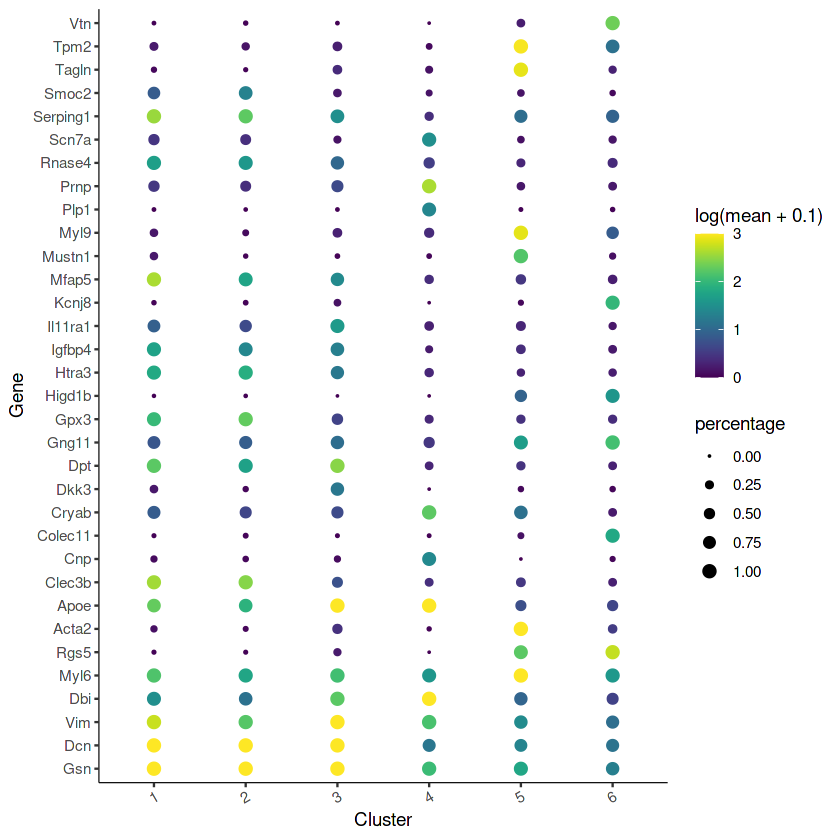

In [39]:
top_specific_marker_ids <- unique(top_specific_markers %>% pull(gene_id)) 

head(top_specific_markers)

plot_genes_by_group(cds,
                    top_specific_marker_ids,
                    group_cells_by="cluster",
                    ordering_type="maximal_on_diag",
                    max.size=3)

Warning message in if (axis_order == "marker_group") {:
“the condition has length > 1 and only the first element will be used”


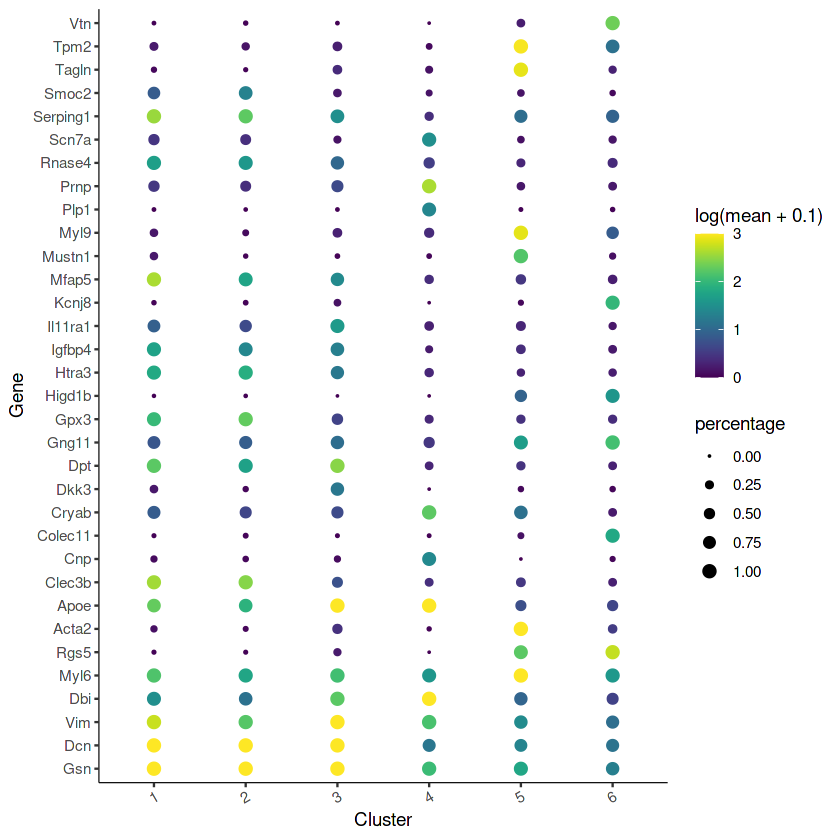

In [40]:
plot_genes_by_group(cds,
                    top_specific_marker_ids,
                    group_cells_by="cluster",
                    ordering_type="maximal_on_diag",
                    max.size=3)

No preprocess_method specified, using preprocess_method = 'PCA'



  |======================================================================| 100%


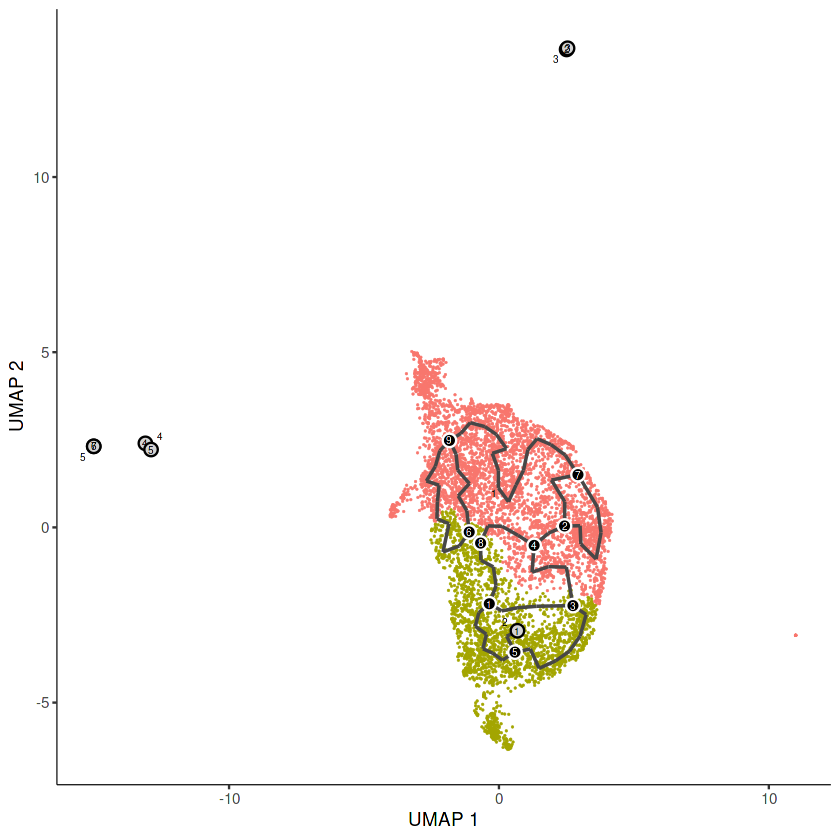

In [41]:
cds_subset = reduce_dimension(cds, max_components = 2)
cds_subset = cluster_cells(cds_subset)
cds_subset = learn_graph(cds_subset)
plot_cells(cds_subset, 
           color_cells_by = "cluster")


Cells aren't colored in a way that allows them to be grouped.



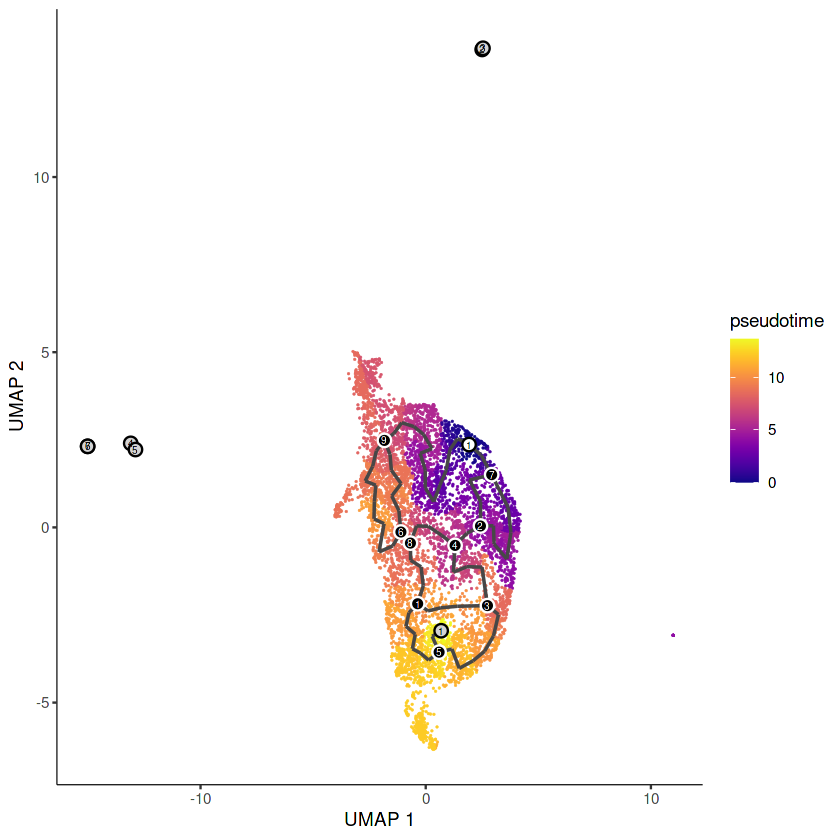

In [42]:
          
cds_subset = order_cells(cds_subset,root_pr_nodes = "Y_1")
plot_cells(cds_subset, 
           color_cells_by = "pseudotime")
